## Setup, Loading Data and CDFs

In [1]:
DATA_NAME = 'agriVision-full' 
TRANSFORM = 'gabor'
CHANNEL = 'green'
PARAM_CSV = "gabor_new.csv"

In [2]:
path_list = DATA_NAME.split("-") + TRANSFORM.split("-")
if CHANNEL:
    path_list.append(CHANNEL)
print(f"Name the notebook:\n{'_'.join(path_list[::-1])}.ipynb")
FULL_DATA_NAME='-'.join(path_list)

Name the notebook:
green_gabor_full_agriVision.ipynb


In [3]:
import git
from pathlib import Path
import os
import pandas as pd
import numpy as np

ROOT_DIR = Path(git.Repo('.', search_parent_directories=True).working_tree_dir)
CWD = os.path.join(ROOT_DIR, "results", "case-studies", *path_list)

assert CWD == os.getcwd()
Path(os.path.join(CWD, "CSVs")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "plots")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "cache")).mkdir(exist_ok=True)

GROUP = 'layer' if TRANSFORM.split("-")[0] == 'wavelet' else ('band' if TRANSFORM.split("-")[0] == 'fourier' else 'filter_idx')
RERUN = True
SKIP_OPTIMIZE_STEP = False
CWD

'd:\\new research\\hierarchical-bayesian-model-validation\\results\\case-studies\\agriVision\\full\\gabor\\green'

In [4]:
os.chdir(os.path.join(ROOT_DIR, "utilities"))
from testing import * # If MATLAB is not installed, open utilities and set to False
from plotting import *
from learned import *
os.chdir(CWD)
np.random.seed(0)

In [5]:
group_data_map = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}.pickle'))
group_total_samples = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}-size.pickle'))

# treat all as nonskewed for gabor grouped over frequency
nonskewed_filter_idxs = list(group_data_map.keys())

df = pd.read_csv(os.path.join(ROOT_DIR, "gabor", PARAM_CSV), index_col="index")
df = df.sort_index()

filter_group_map = (df.loc[:, ["wave_number", "aspect_ratio", "frequency"]]
                      .apply(tuple, axis=1)
                      .to_dict())

filter_group_map

{0: (2.0, 0.5, 0.044),
 1: (2.0, 0.5, 0.065),
 2: (2.0, 0.5, 0.096),
 3: (2.0, 0.5, 0.141),
 4: (2.0, 0.5, 0.208),
 5: (2.0, 0.5, 0.306),
 6: (2.0, 0.5, 0.45),
 7: (2.0, 1.0, 0.044),
 8: (2.0, 1.0, 0.065),
 9: (2.0, 1.0, 0.096),
 10: (2.0, 1.0, 0.141),
 11: (2.0, 1.0, 0.208),
 12: (2.0, 1.0, 0.306),
 13: (2.0, 1.0, 0.45),
 14: (3.0, 0.5, 0.044),
 15: (3.0, 0.5, 0.065),
 16: (3.0, 0.5, 0.096),
 17: (3.0, 0.5, 0.141),
 18: (3.0, 0.5, 0.208),
 19: (3.0, 0.5, 0.306),
 20: (3.0, 0.5, 0.45),
 21: (3.0, 1.0, 0.044),
 22: (3.0, 1.0, 0.065),
 23: (3.0, 1.0, 0.096),
 24: (3.0, 1.0, 0.141),
 25: (3.0, 1.0, 0.208),
 26: (3.0, 1.0, 0.306),
 27: (3.0, 1.0, 0.45),
 28: (4.0, 0.5, 0.044),
 29: (4.0, 0.5, 0.065),
 30: (4.0, 0.5, 0.096),
 31: (4.0, 0.5, 0.141),
 32: (4.0, 0.5, 0.208),
 33: (4.0, 0.5, 0.306),
 34: (4.0, 0.5, 0.45),
 35: (4.0, 1.0, 0.044),
 36: (4.0, 1.0, 0.065),
 37: (4.0, 1.0, 0.096),
 38: (4.0, 1.0, 0.141),
 39: (4.0, 1.0, 0.208),
 40: (4.0, 1.0, 0.306),
 41: (4.0, 1.0, 0.45)}

In [6]:
if 'fourier' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)[::3]
elif 'wavelet' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)
elif 'learned' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters
elif 'gabor' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters

cdfs_dir = os.path.join(ROOT_DIR, "results", "CDFs")
cdfs_list = sorted([os.path.join(cdfs_dir, i) for i in os.listdir(cdfs_dir)])
all_cdfs = combine_pickles(cdfs_list[0])
for cdf_dir in cdfs_list[:6]: # TODO For quick testing purposes. Currently excluding 20000 CDFs. Use cdfs_list[5:6] to access CDFs/_test
    all_cdfs = all_cdfs | combine_pickles(cdf_dir)
    
# group_data_map = {g : group_data_map[g][::100] for g in GROUPS} # TODO For quick testing purposes
group_total_samples

{0: 262144000,
 1: 262144000,
 2: 262144000,
 3: 262144000,
 4: 262144000,
 5: 262144000,
 6: 262144000,
 7: 262144000,
 8: 262144000,
 9: 262144000,
 10: 262144000,
 11: 262144000,
 12: 262144000,
 13: 262144000,
 14: 262144000,
 15: 262144000,
 16: 262144000,
 17: 262144000,
 18: 262144000,
 19: 262144000,
 20: 262144000,
 21: 262144000,
 22: 262144000,
 23: 262144000,
 24: 262144000,
 25: 262144000,
 26: 262144000,
 27: 262144000,
 28: 262144000,
 29: 262144000,
 30: 262144000,
 31: 262144000,
 32: 262144000,
 33: 262144000,
 34: 262144000,
 35: 262144000,
 36: 262144000,
 37: 262144000,
 38: 262144000,
 39: 262144000,
 40: 262144000,
 41: 262144000}

Running 12760 CDFs


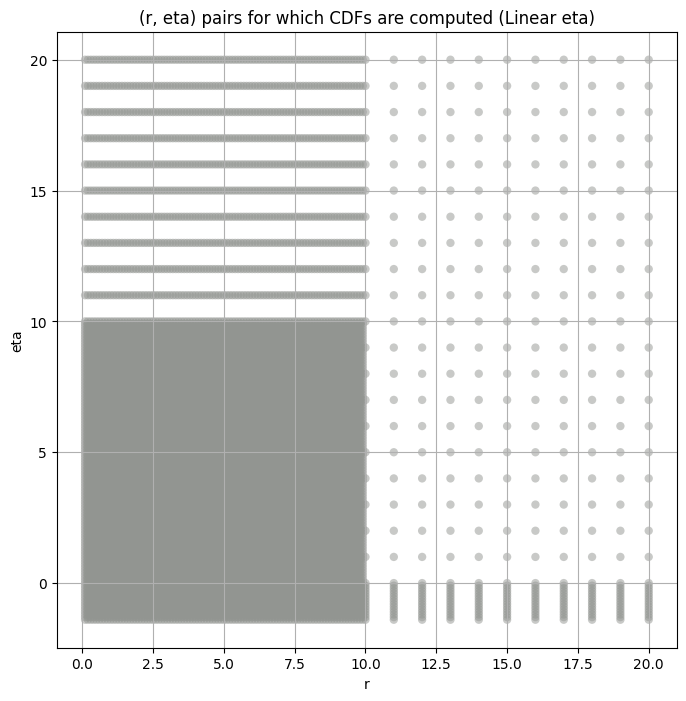

,"(r,eta),cdf",r,eta,cdf,variance,kurtosis
0,"((0.1, -1.4), <scipy.interpolate._fitpack2.Int...",0.1,-1.4,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.628800e+06,554265.000000
1,"((0.1, -1.3), <scipy.interpolate._fitpack2.Int...",0.1,-1.3,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.991680e+07,96192.272727
2,"((0.1, -1.2), <scipy.interpolate._fitpack2.Int...",0.1,-1.2,<scipy.interpolate._fitpack2.InterpolatedUniva...,2.395008e+08,29390.000000
3,"((0.1, -1.1), <scipy.interpolate._fitpack2.Int...",0.1,-1.1,<scipy.interpolate._fitpack2.InterpolatedUniva...,1.037837e+09,11997.692308
4,"((0.1, -1.0), <scipy.interpolate._fitpack2.Int...",0.1,-1.0,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.632429e+09,5874.890110


In [7]:
warnings.filterwarnings('ignore', category=RuntimeWarning)

all_cdfs_df = create_kurt_var_ksstat_df(all_cdfs)
fine_cdfs_df = all_cdfs_df.copy()
all_cdfs_df = all_cdfs_df[(np.round(all_cdfs_df['r'], 1) == all_cdfs_df['r']) & (np.round(all_cdfs_df['eta'], 1) == all_cdfs_df['eta'])]
all_cdfs_df = all_cdfs_df.reset_index(drop=True)
all_cdfs = {x[0] : x[1] for x in all_cdfs_df["(r,eta),cdf"]}
                                             
var_values_dict = dict()
kurt_values_dict = dict()
master_df = pd.DataFrame(columns=[GROUP]).set_index(GROUP)
temp_cdf = all_cdfs_df
print(f"Running {all_cdfs_df.shape[0]} CDFs")
create_scatter_plot(all_cdfs_df);
all_cdfs_df.head()

## Bootstrapping the Variance and Kurtosis

In [8]:
n_bootstrap = int(1e3) # TODO For quick testing purposes
bootstrap_size = int(1e3) # TODO For quick testing purposes
ci = 0.99

In [9]:
bootstrap_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))
master_df_var_kurt_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

if True or not master_df_var_kurt_path.exists(): # TODO For quick testing purposes
    for group in GROUPS:
        print(f'{GROUP.capitalize()} {group}: {str(filter_group_map[group])}')
        obs_var, var_lower, var_upper, var_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                n_bootstrap=n_bootstrap, 
                                                                                bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                metric= np.var, 
                                                                                ci=ci)
        obs_kurt, kurt_lower, kurt_upper, kurt_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                    n_bootstrap=n_bootstrap, 
                                                                                    bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                    metric= stats.kurtosis, ci=ci)  
        master_df.loc[group, 'obs_var'], master_df.loc[group, 'var_lower'], master_df.loc[group, 'var_upper'] = obs_var, var_lower, var_upper
        master_df.loc[group, 'obs_kurt'], master_df.loc[group, 'kurt_lower'], master_df.loc[group, 'kurt_upper'] = obs_kurt, kurt_lower, kurt_upper
        master_df.loc[group, 'total_samples'] = group_total_samples[group]
        master_df.loc[group, 'filter_group'] = str(filter_group_map[group])

    master_df.to_csv(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

master_df = pd.read_csv(master_df_var_kurt_path, index_col=GROUP)
var_kurt_df = pd.read_csv(bootstrap_path, index_col=GROUP)
master_df

Filter_idx 0: (2.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 1: (2.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 2: (2.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 3: (2.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 4: (2.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 5: (2.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 6: (2.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 7: (2.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 8: (2.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 9: (2.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 10: (2.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 11: (2.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 12: (2.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 13: (2.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 14: (3.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 15: (3.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 16: (3.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 17: (3.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 18: (3.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 19: (3.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 20: (3.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 21: (3.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 22: (3.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 23: (3.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 24: (3.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 25: (3.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 26: (3.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 27: (3.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 28: (4.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 29: (4.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 30: (4.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 31: (4.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 32: (4.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 33: (4.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 34: (4.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 35: (4.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 36: (4.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 37: (4.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 38: (4.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 39: (4.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 40: (4.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 41: (4.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group
filter_idx,,,,,,,,
0,85.236410,28.694447,732.051450,1326.75440,8.503800,845.48750,262144000.0,"(2.0, 0.5, 0.044)"
1,55.119440,16.155226,348.341670,905.38780,7.874421,853.06590,262144000.0,"(2.0, 0.5, 0.065)"
2,22.824420,9.009885,101.607285,555.71906,5.062737,758.95074,262144000.0,"(2.0, 0.5, 0.096)"
3,9.843026,4.680263,53.985220,570.56400,6.635873,714.98520,262144000.0,"(2.0, 0.5, 0.141)"
4,6.010580,1.755476,35.830950,694.43570,11.610837,844.96704,262144000.0,"(2.0, 0.5, 0.208)"
5,2.173437,0.544470,9.934200,431.17087,24.019732,662.25964,262144000.0,"(2.0, 0.5, 0.306)"
6,0.541408,0.220924,4.927081,1347.73650,10.447507,847.39990,262144000.0,"(2.0, 0.5, 0.45)"
7,104.480480,31.121315,1179.829300,2493.79760,8.534616,922.46640,262144000.0,"(2.0, 1.0, 0.044)"
8,47.764854,16.399597,625.038300,3161.99980,6.106381,912.12420,262144000.0,"(2.0, 1.0, 0.065)"


## Initial Grid Search and Hypothesis Test Plots

In [10]:
EXCLUDE_CUTOFFS = [0, 50, 100, 200] # TODO For quick testing purposes
SCALE_CAP = 1e5

In [11]:
augmented_var_df_path = Path(os.path.join(CWD, "CSVs", "augmented_var_df.csv"))
augmented_var_df = var_kurt_df[['obs_var']].copy()
augmented_var_df
for val in EXCLUDE_CUTOFFS:
    temp_arr = []
    for group in GROUPS:
        if val != 0:
            temp_arr.append(np.var(group_data_map[group][val:-val]))
        else:
            temp_arr.append(np.var(group_data_map[group]))

    augmented_var_df[f"var_exclude_{val}"] = temp_arr
augmented_var_df

,obs_var,var_exclude_0,var_exclude_50,var_exclude_100,var_exclude_200
filter_idx,,,,,
0,85.236410,85.236412,43.924774,37.780144,32.243713
1,55.119440,55.119438,27.253489,21.856323,17.474768
2,22.824420,22.824421,12.023202,10.829367,9.815873
3,9.843026,9.843026,6.368092,5.835878,5.241226
4,6.010580,6.010580,3.162456,2.511319,2.022064
5,2.173437,2.173437,1.326824,1.038590,0.740164
6,0.541408,0.541408,0.329878,0.295566,0.258607
7,104.480480,104.480476,47.441326,40.675121,34.469532
8,47.764854,47.764854,23.656776,21.008305,18.407948


####
Filter_idx, 0: (2.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 0 0.025186819829087714 85.23641


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 50 0.009973193051684537 43.924774


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 100 0.005932203002969039 37.780144


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 200 0.0030282741099896026 32.243713
Number of samples: 100000, Without approximation : 262144000.0


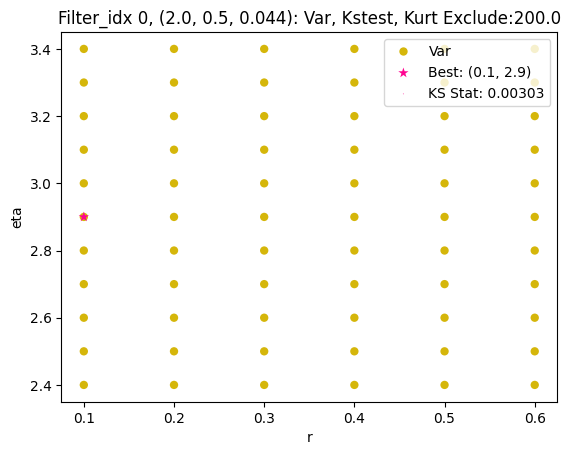

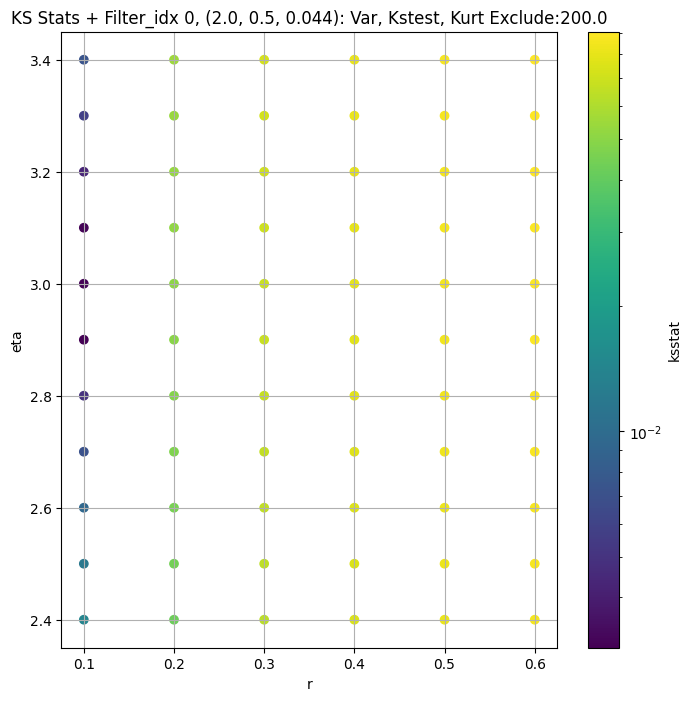

####
Filter_idx, 1: (2.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 0 0.025455067168684842 55.11944


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 50 0.009782398918671276 27.253489


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 100 0.004308804821018336 21.856323


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 200 0.0024295110956991713 17.474768
Number of samples: 100000, Without approximation : 262144000.0


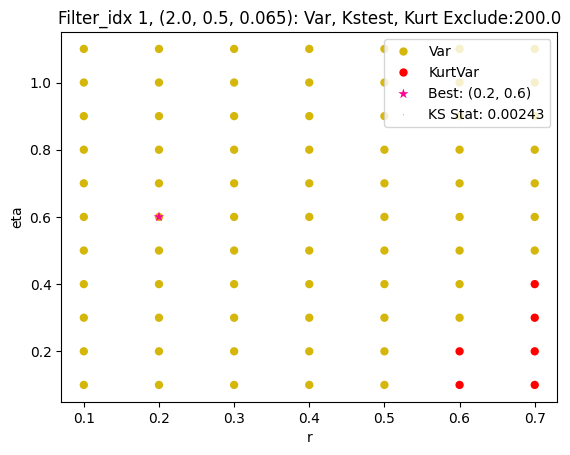

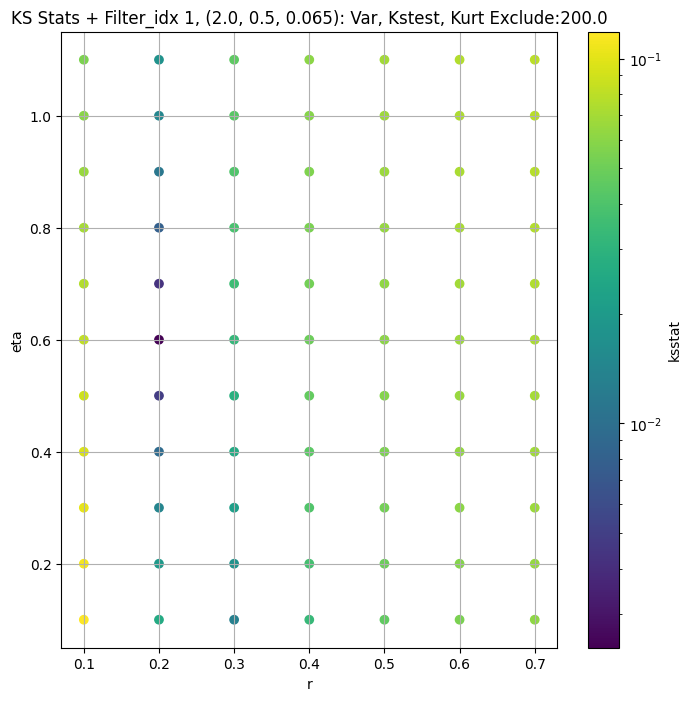

####
Filter_idx, 2: (2.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 0 0.017638877317921818 22.82442


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 50 0.0019219956336432031 12.023202


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 100 0.0022272131355047034 10.829367


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 200 0.0035880933507340014 9.815873
Number of samples: 100000, Without approximation : 262144000.0


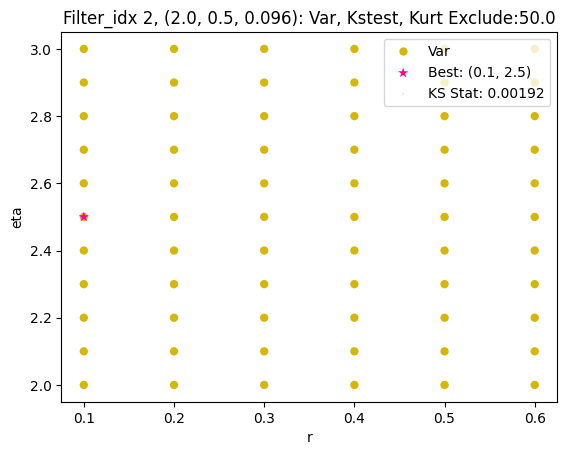

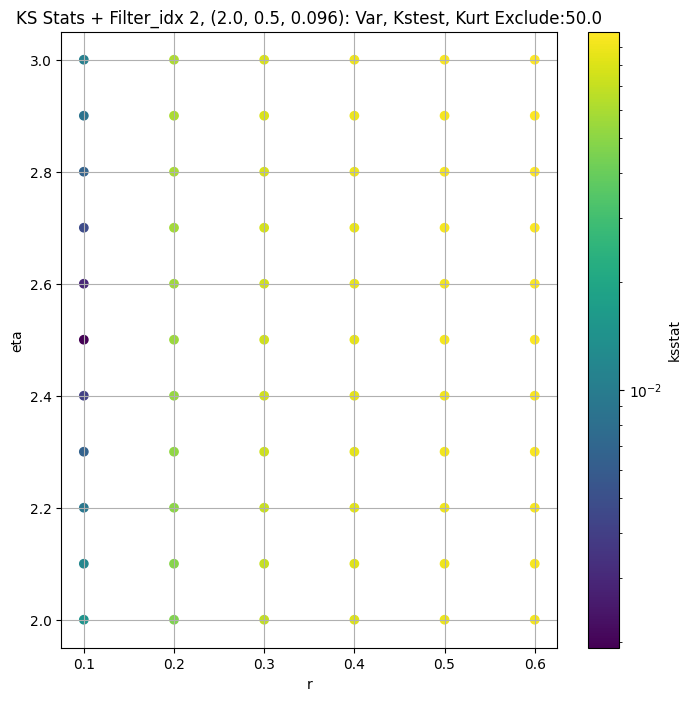

####
Filter_idx, 3: (2.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 0 0.012682539045136498 9.843026


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 50 0.003300781156987509 6.368092


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 100 0.002410421804583396 5.835878


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 200 0.003545060380979499 5.2412257
Number of samples: 100000, Without approximation : 262144000.0


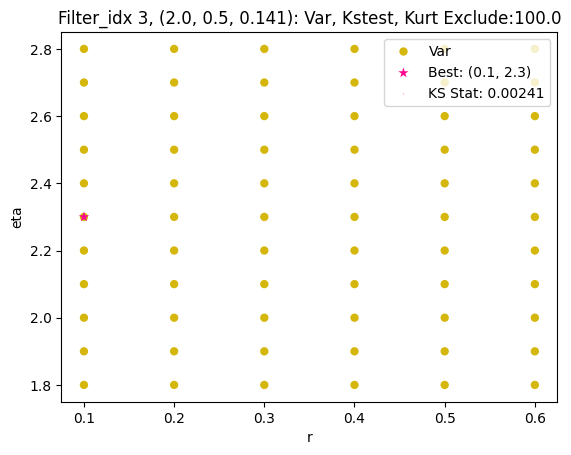

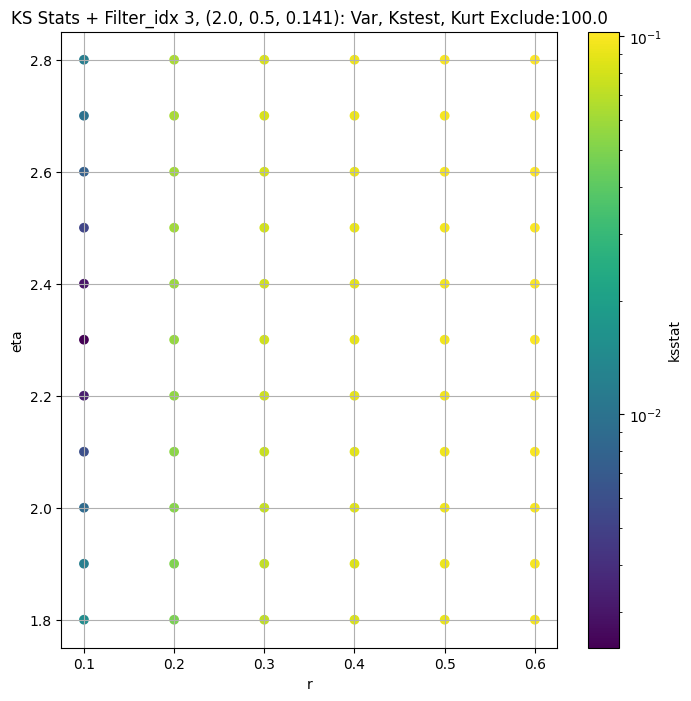

####
Filter_idx, 4: (2.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 0 0.025107610699038996 6.0105796


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 50 0.011876820043509095 3.1624556


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 100 0.007860886919838772 2.511319


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 200 0.003832552407017409 2.0220644
Number of samples: 100000, Without approximation : 262144000.0


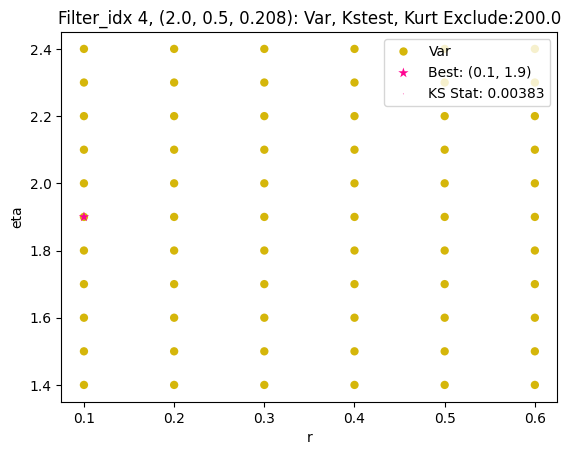

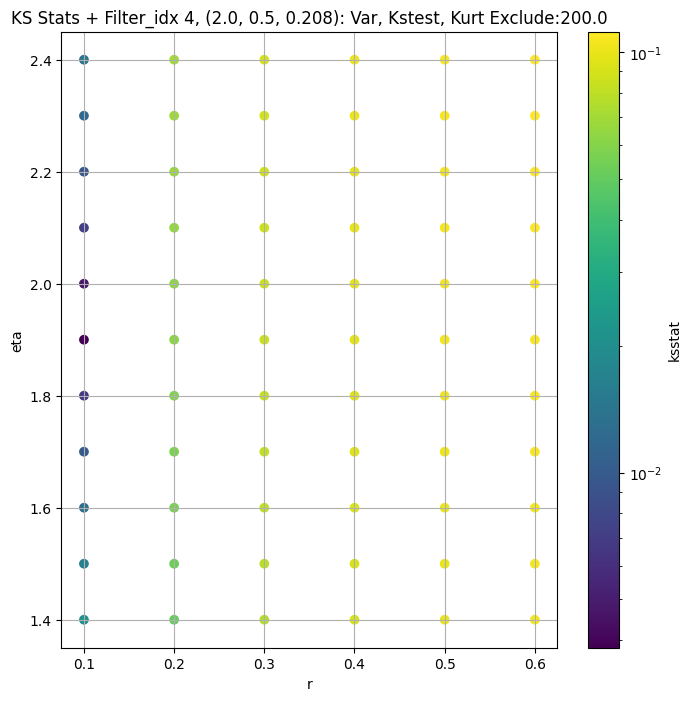

####
Filter_idx, 5: (2.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 0 0.03294892088540158 2.1734369


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 50 0.022012785826693304 1.3268241


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 100 0.019976182987124225 1.0385903


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 200 0.012624177629582164 0.74016446
Number of samples: 100000, Without approximation : 262144000.0


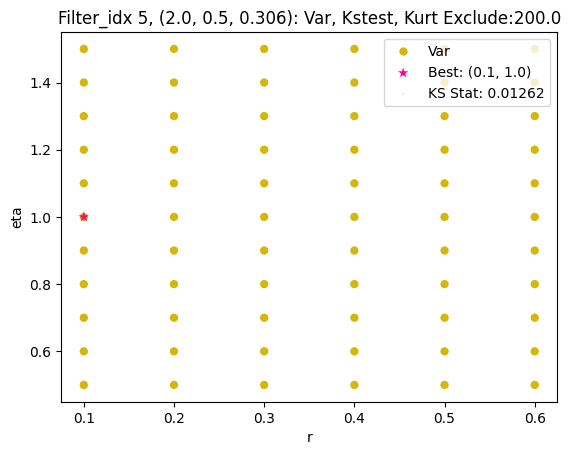

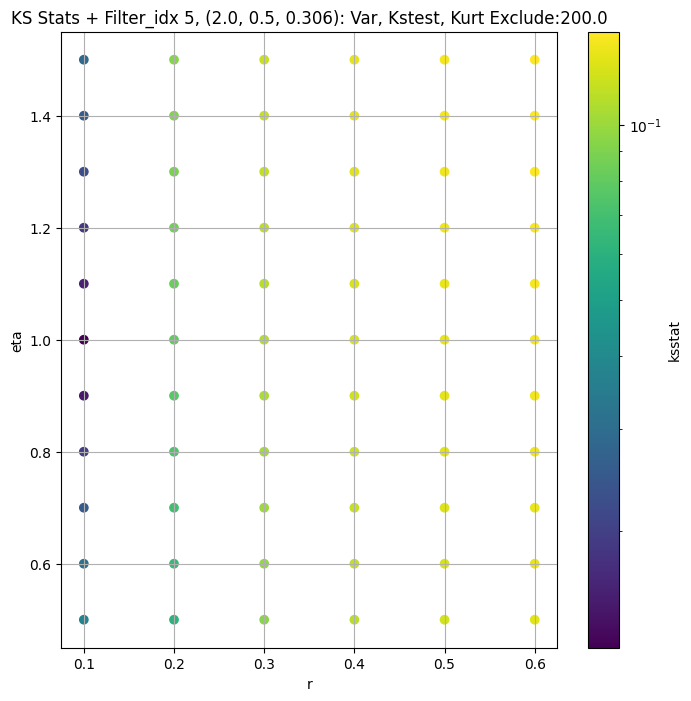

####
Filter_idx, 6: (2.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 0 0.018039596897488797 0.5414084


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 50 0.008619041661321325 0.32987753


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 100 0.007393532936328412 0.29556644


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 200 0.005524455172699727 0.2586071
Number of samples: 100000, Without approximation : 262144000.0


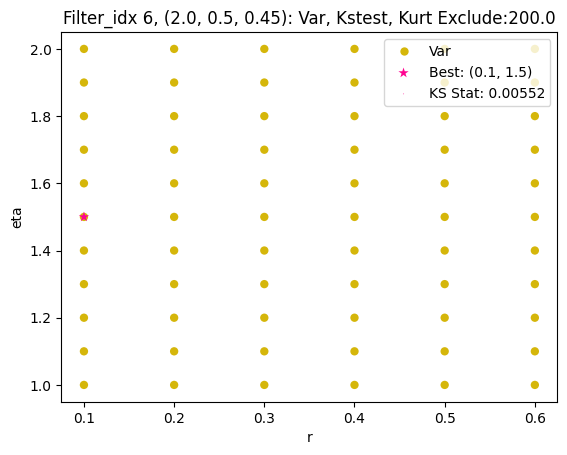

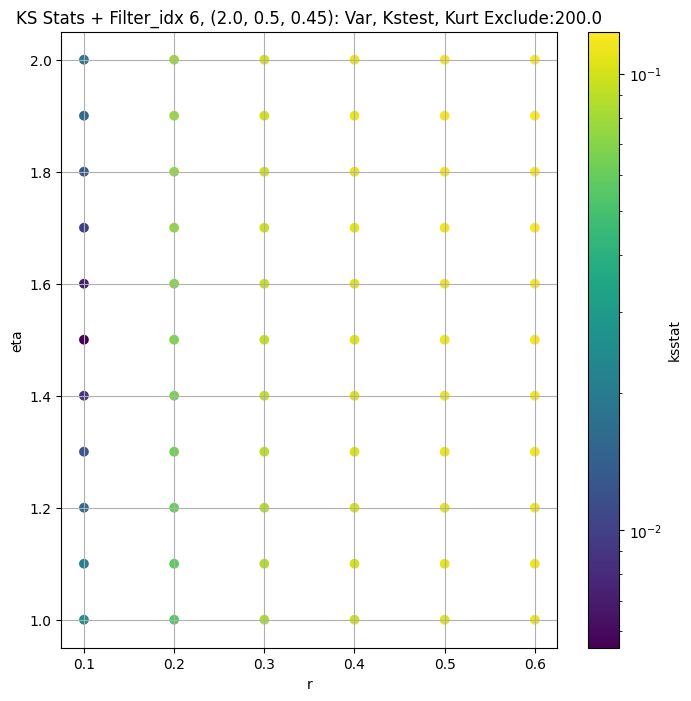

####
Filter_idx, 7: (2.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 0 0.026449135978727334 104.48048


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 50 0.009282861956979402 47.441326


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 100 0.0052822054266631335 40.67512


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 200 0.0028767430725926595 34.469532
Number of samples: 100000, Without approximation : 262144000.0


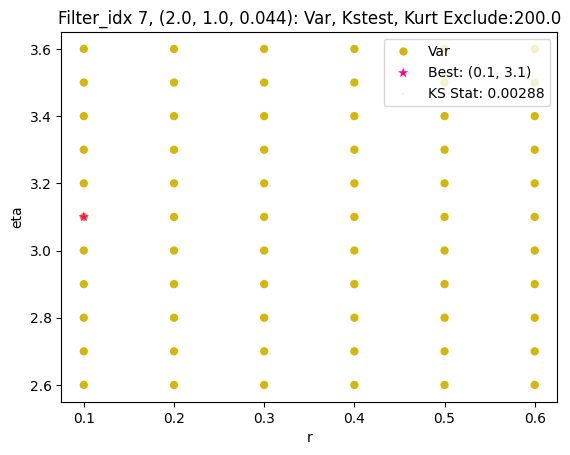

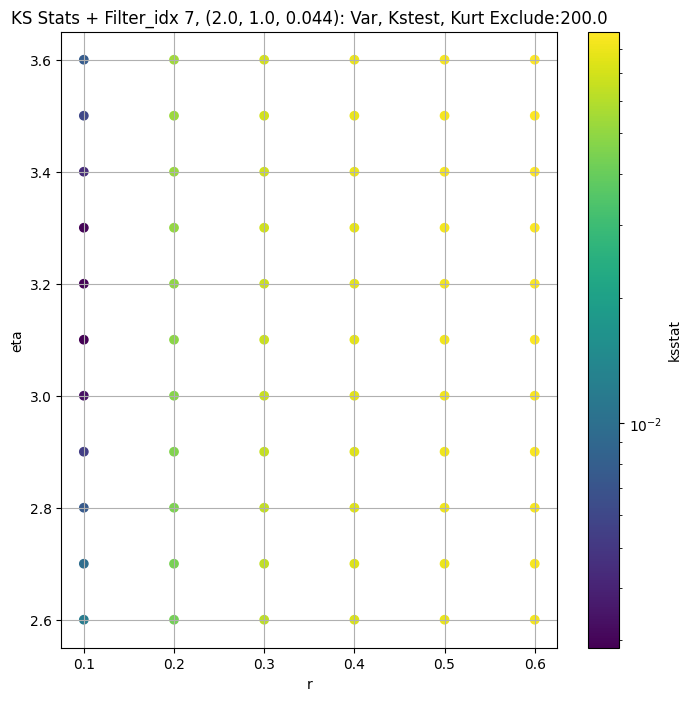

####
Filter_idx, 8: (2.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 0 0.020791053708347107 47.764854


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 50 0.004357235267108961 23.656776


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 100 0.0024791201544627217 21.008305


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 200 0.0025748592545005843 18.407948
Number of samples: 100000, Without approximation : 262144000.0


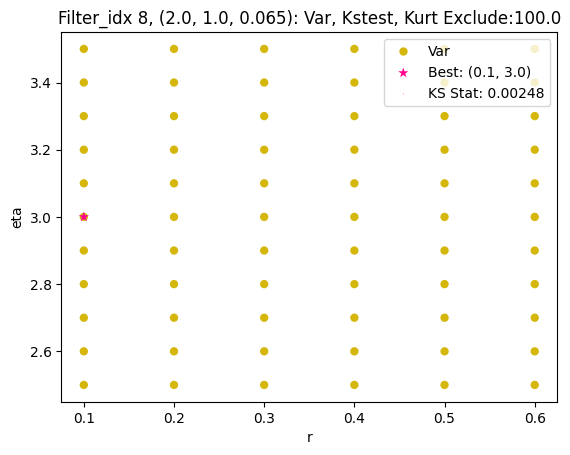

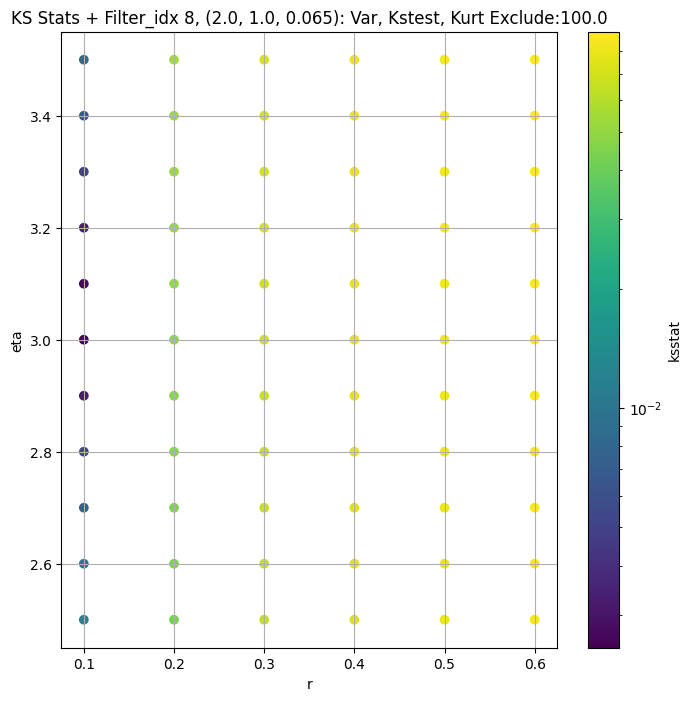

####
Filter_idx, 9: (2.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 0 0.020825302617794736 33.97162


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 50 0.008211597967657358 19.760983


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 100 0.004744614497597943 16.6039


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 200 0.0026394805915208293 13.649004
Number of samples: 100000, Without approximation : 262144000.0


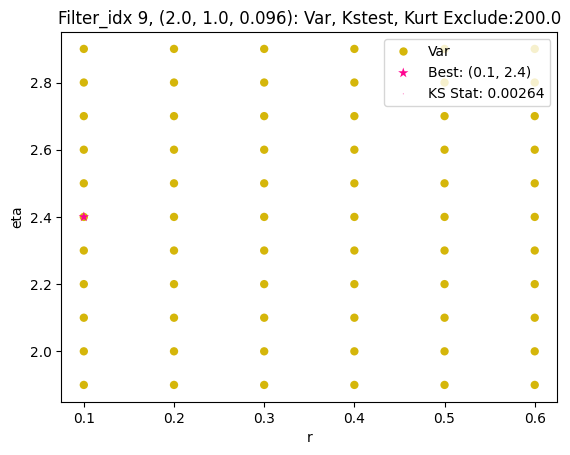

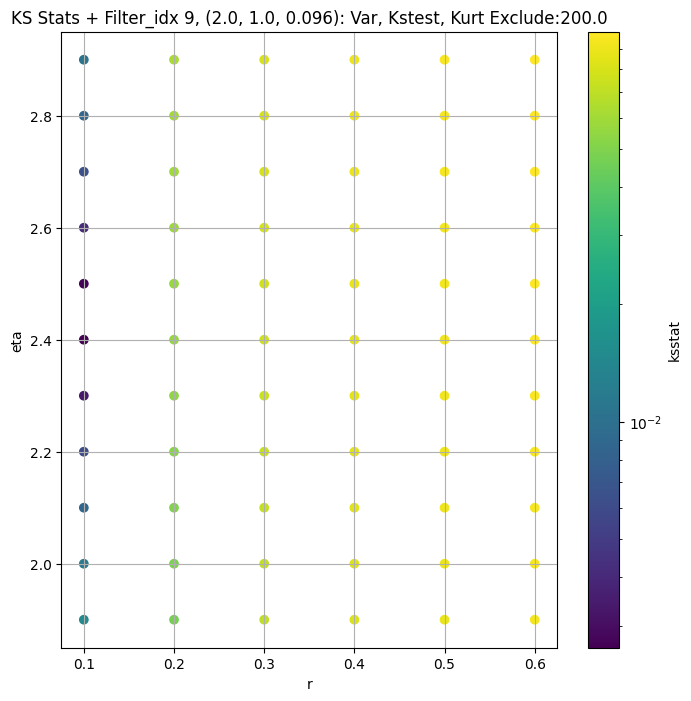

####
Filter_idx, 10: (2.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 0 0.025082794959578214 21.561584


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 50 0.012017826854118452 11.546256


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 100 0.007292793113229834 9.417662


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 200 0.0034633584620568647 7.6646657
Number of samples: 100000, Without approximation : 262144000.0


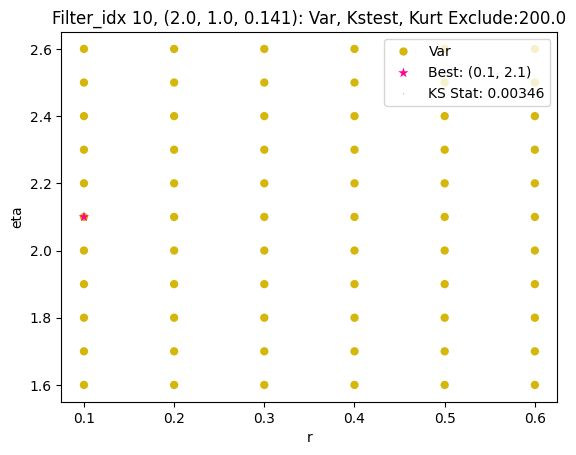

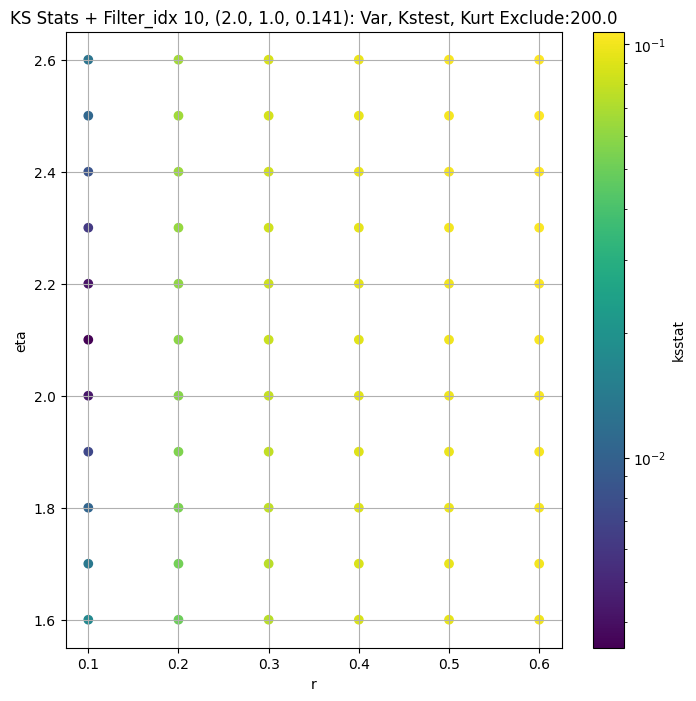

####
Filter_idx, 11: (2.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 0 0.01690457242397514 5.6215043


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 50 0.007923986833029473 3.6040967


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 100 0.00545757897323608 3.198791


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 200 0.0039038258871187947 2.7915506
Number of samples: 100000, Without approximation : 262144000.0


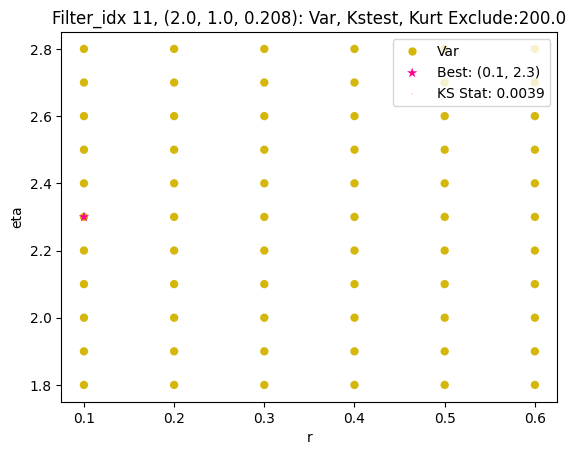

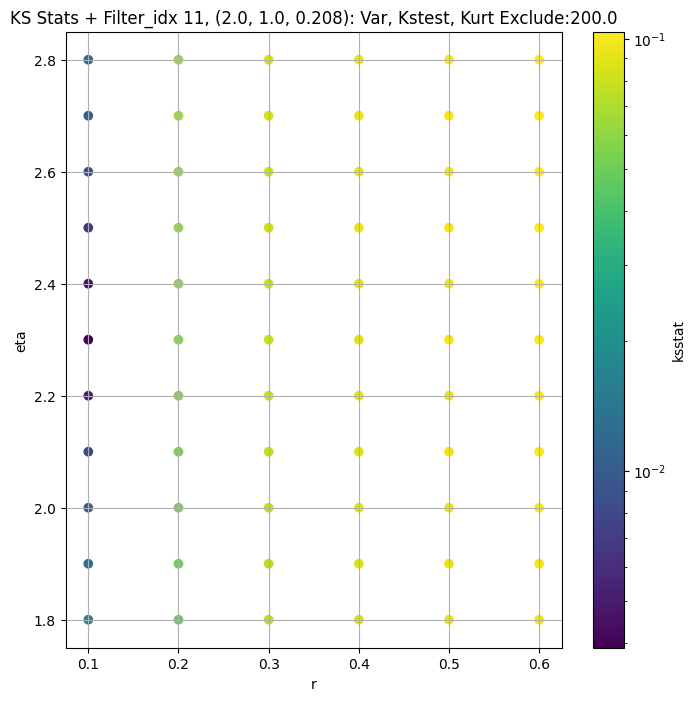

####
Filter_idx, 12: (2.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 0 0.02344338818336722 2.5409522


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 50 0.011751928519915134 1.4686849


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 100 0.007671492316341344 1.18323


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 200 0.004243985610033411 0.95401907
Number of samples: 100000, Without approximation : 262144000.0


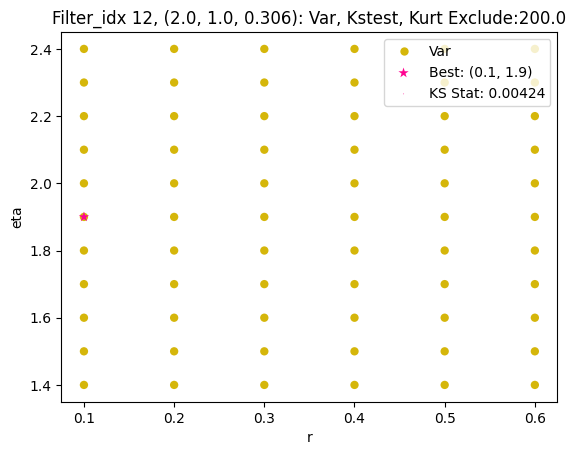

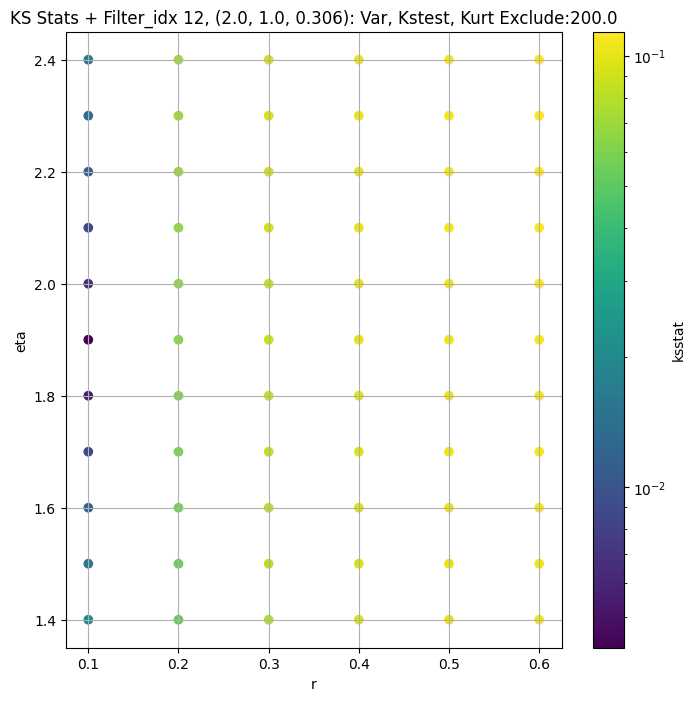

####
Filter_idx, 13: (2.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 0 0.026308841262042693 0.6566615


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 50 0.009070724401635033 0.27862158


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 100 0.006000089770976269 0.23489825


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 200 0.004423204022902721 0.20126992
Number of samples: 100000, Without approximation : 262144000.0


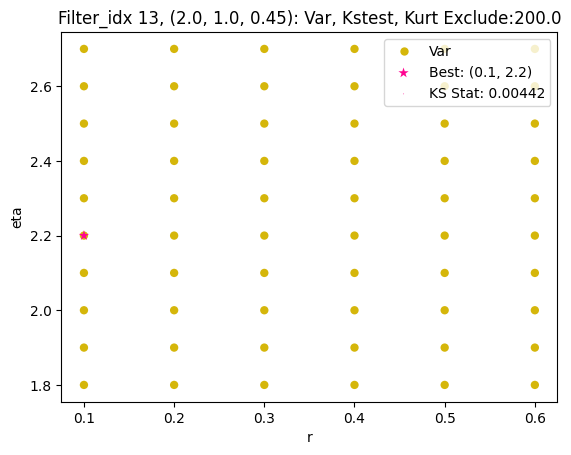

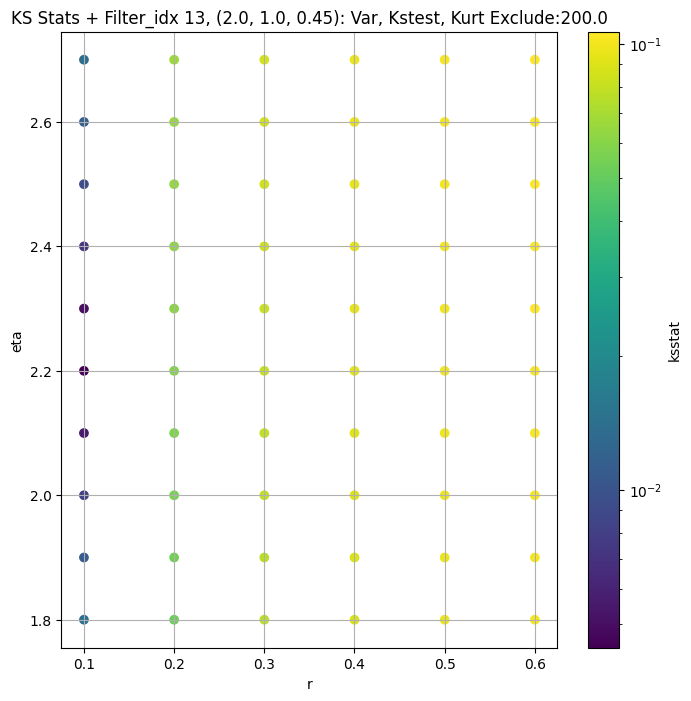

####
Filter_idx, 14: (3.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 0 0.027140436440061616 97.28535


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 50 0.009847186658948112 44.061546


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 100 0.005692259473500383 36.560097


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 200 0.0026648305104520764 30.072851
Number of samples: 100000, Without approximation : 262144000.0


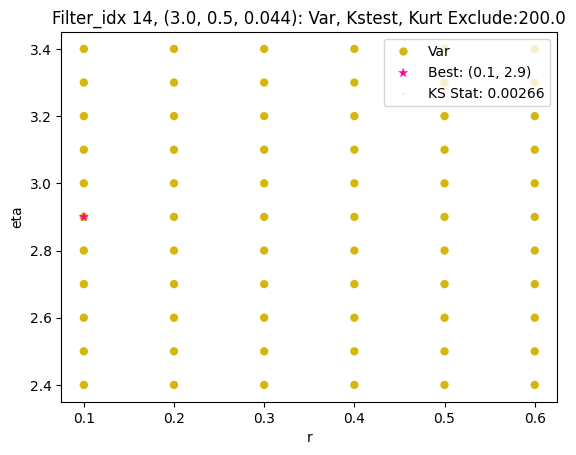

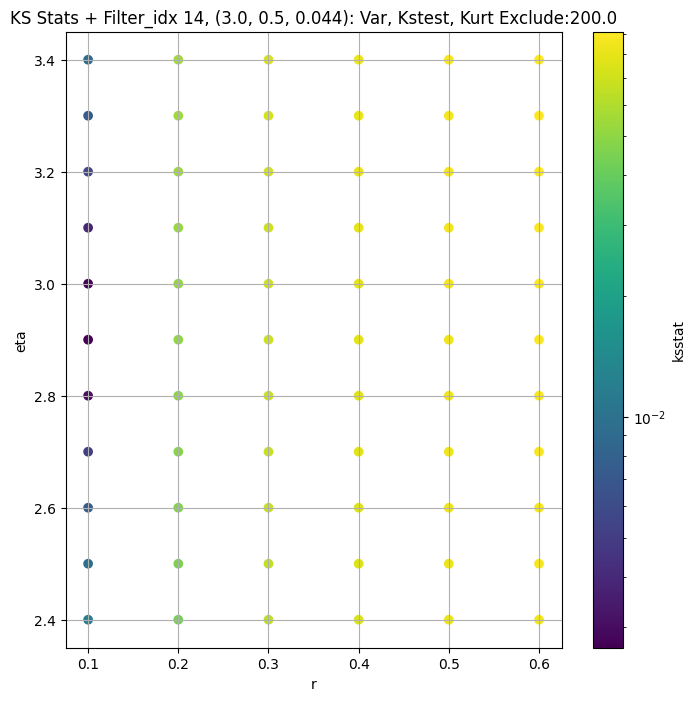

####
Filter_idx, 15: (3.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 0 0.021316440295307937 37.0874


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 50 0.006139562660511855 19.240528


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 100 0.0019796075891896914 16.59365


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 200 0.0025120459381109406 14.252781
Number of samples: 100000, Without approximation : 262144000.0


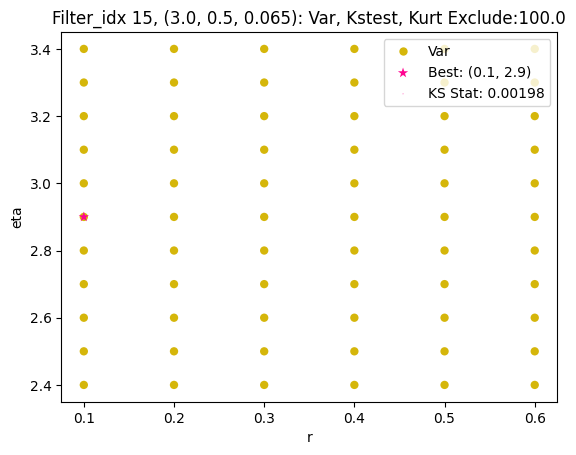

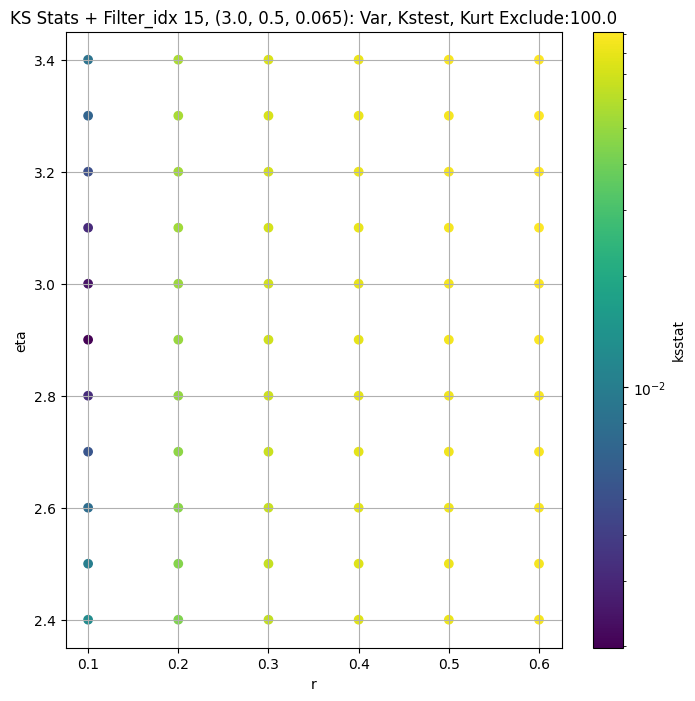

####
Filter_idx, 16: (3.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 0 0.015170721841432908 23.7597


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 50 0.0019884491677086835 13.304388


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 100 0.0030764841251158803 12.132593


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 200 0.004084663834390101 10.945077
Number of samples: 100000, Without approximation : 262144000.0


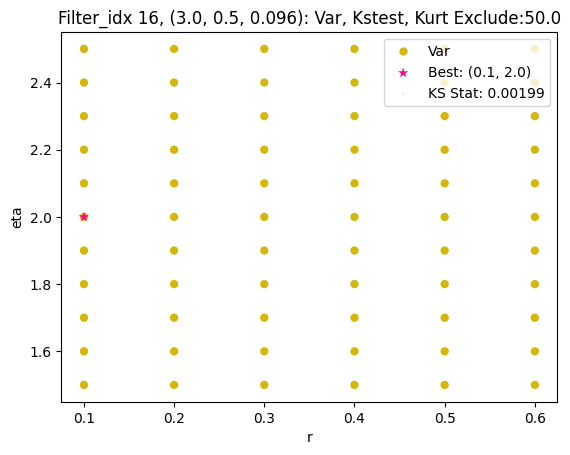

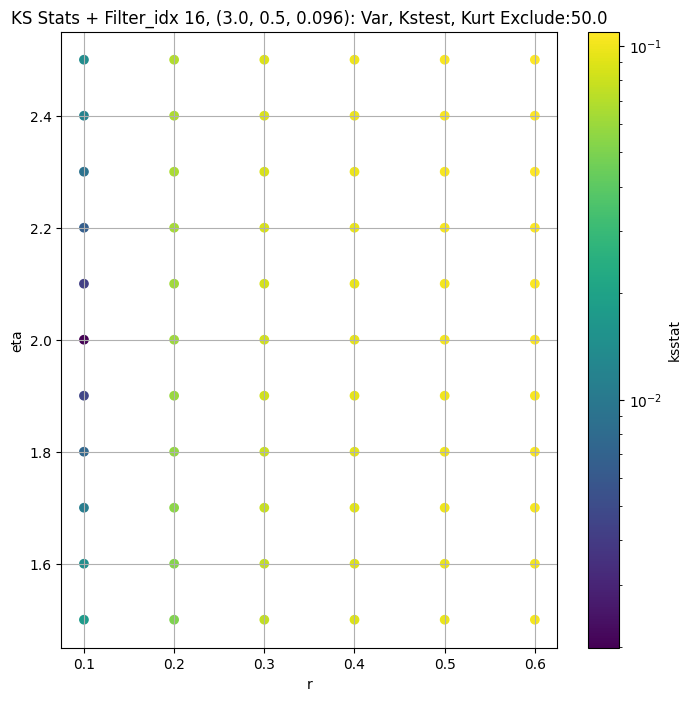

####
Filter_idx, 17: (3.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 0 0.028711368079100297 25.57635


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 50 0.01046819869681527 9.819882


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 100 0.005315094898250439 7.7602525


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 200 0.004276058409732433 6.4498754
Number of samples: 100000, Without approximation : 262144000.0


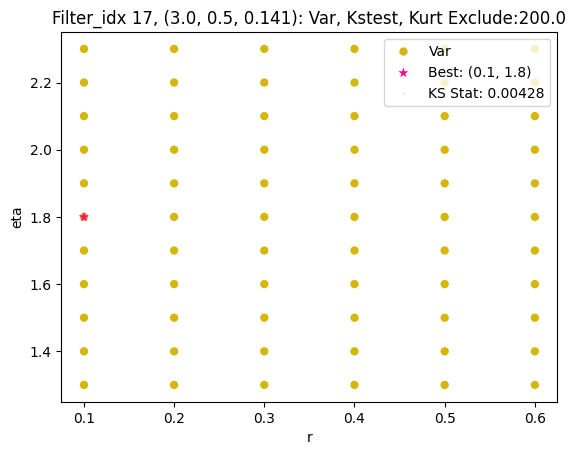

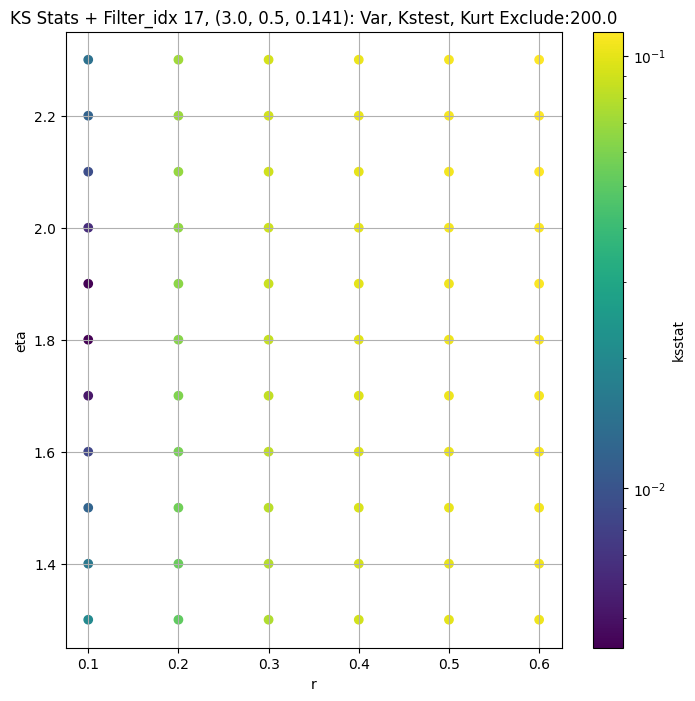

####
Filter_idx, 18: (3.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 0 0.02046682139424405 4.793636


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 50 0.010640506957570017 2.7263832


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 100 0.006966585342652487 2.3697848


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 200 0.005667815446662408 2.036751
Number of samples: 100000, Without approximation : 262144000.0


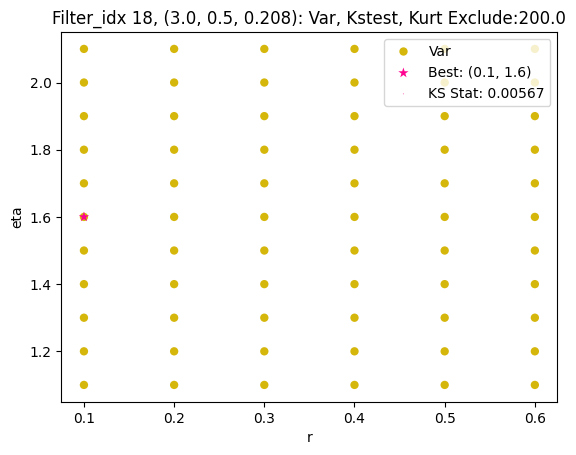

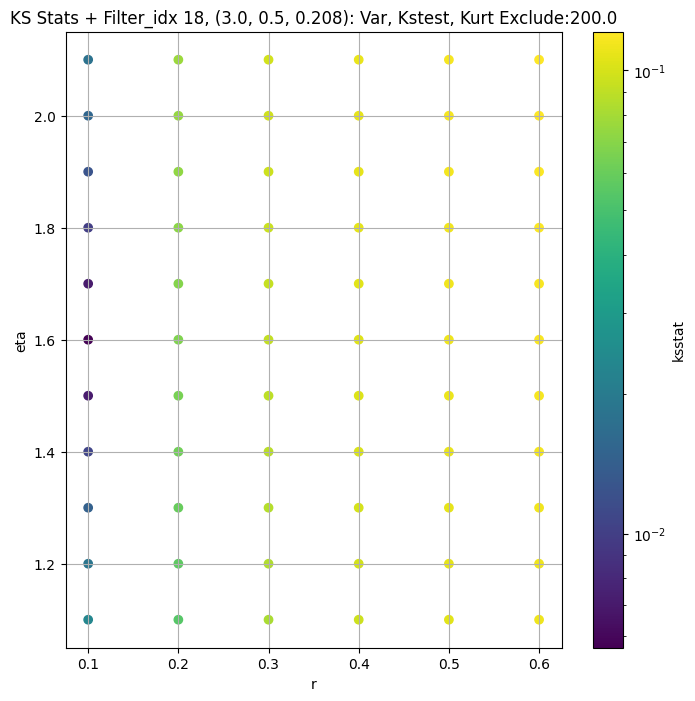

####
Filter_idx, 19: (3.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 0 0.02114187322376826 0.86579955


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 50 0.009273843401859772 0.47205862


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 100 0.007743833706017056 0.4094624


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 200 0.00601115835166317 0.35606083
Number of samples: 100000, Without approximation : 262144000.0


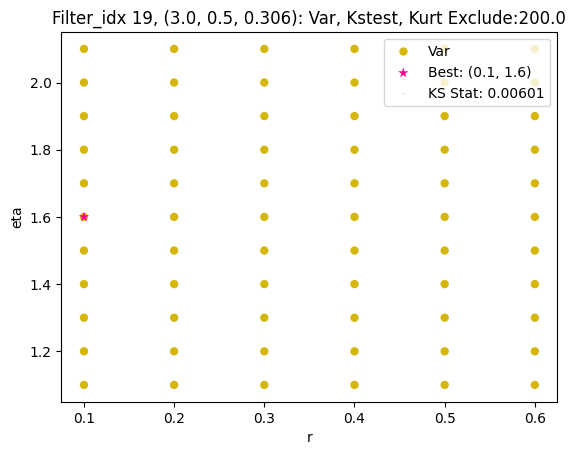

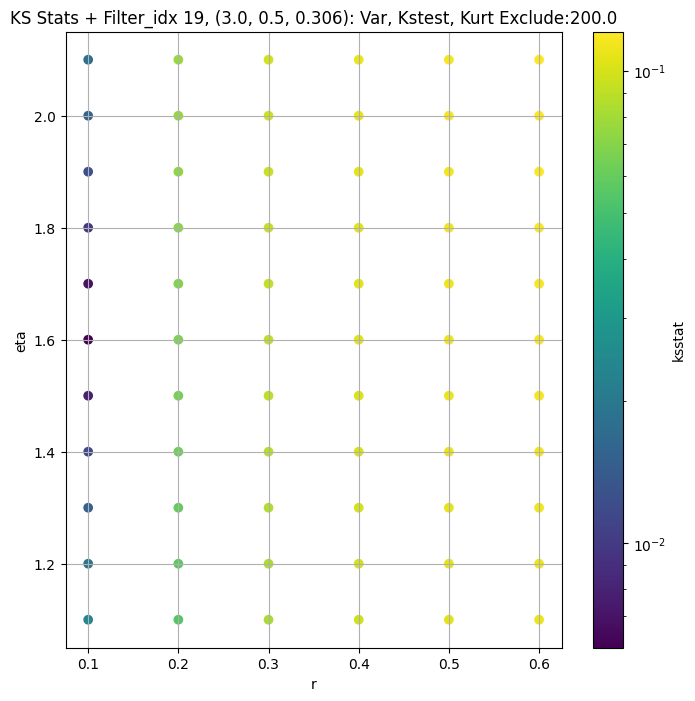

####
Filter_idx, 20: (3.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 0 0.034164740325444365 0.40613803


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 50 0.020717154124316184 0.19488105


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 100 0.017772810720323773 0.15532142


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 200 0.013526286157032996 0.11591711
Number of samples: 100000, Without approximation : 262144000.0


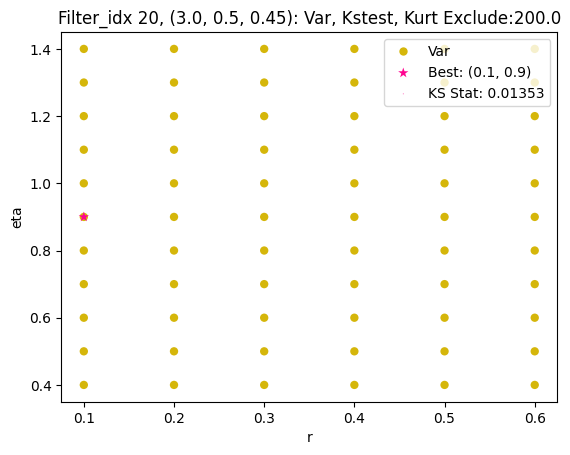

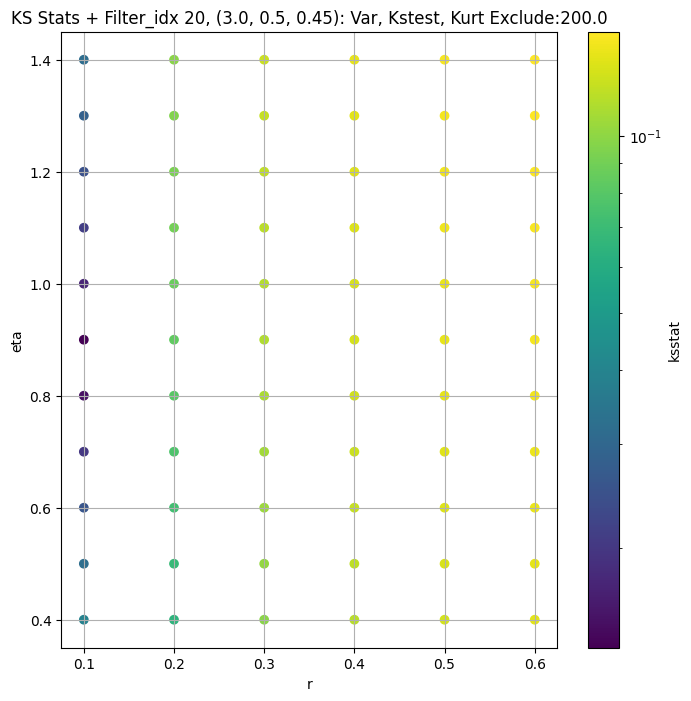

####
Filter_idx, 21: (3.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 0 0.019392050235988445 70.56708


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 50 0.006412380390044409 40.398758


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 100 0.003057342954068218 35.23385


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 200 0.0029371655151303466 30.510302
Number of samples: 100000, Without approximation : 262144000.0


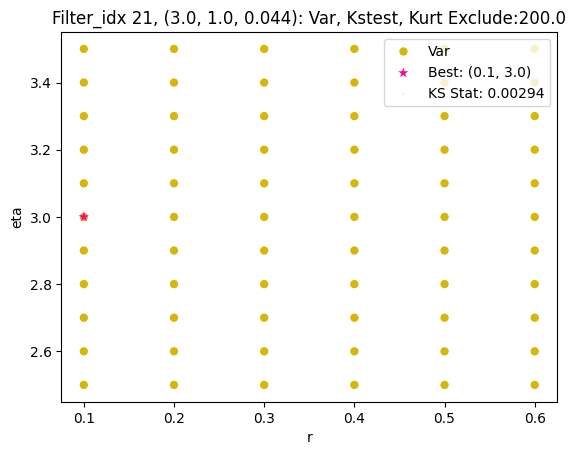

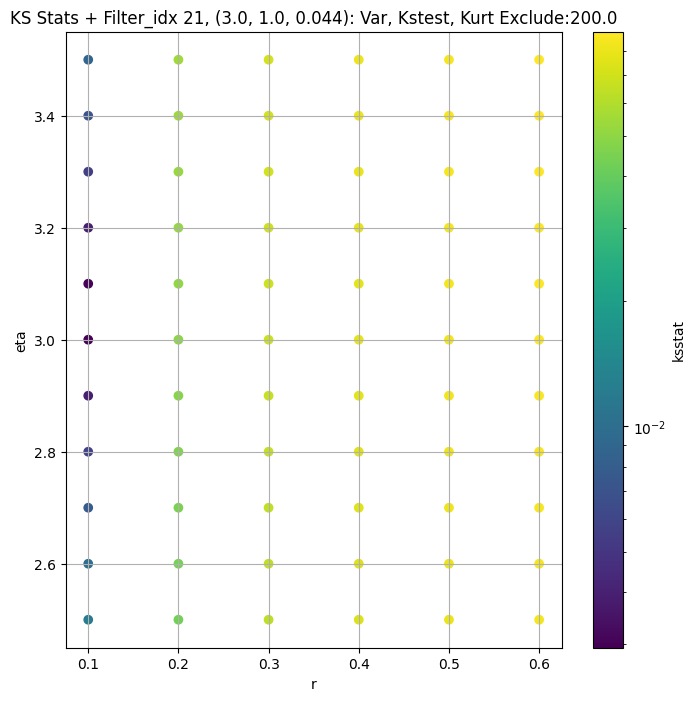

####
Filter_idx, 22: (3.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 0 0.028341767173639835 64.40502


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 50 0.01146948500913586 28.798008


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 100 0.005530195049378031 23.060925


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 200 0.002495622867062397 18.294224
Number of samples: 100000, Without approximation : 262144000.0


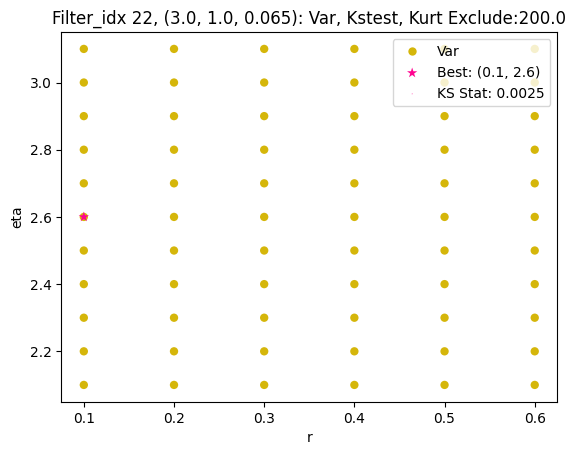

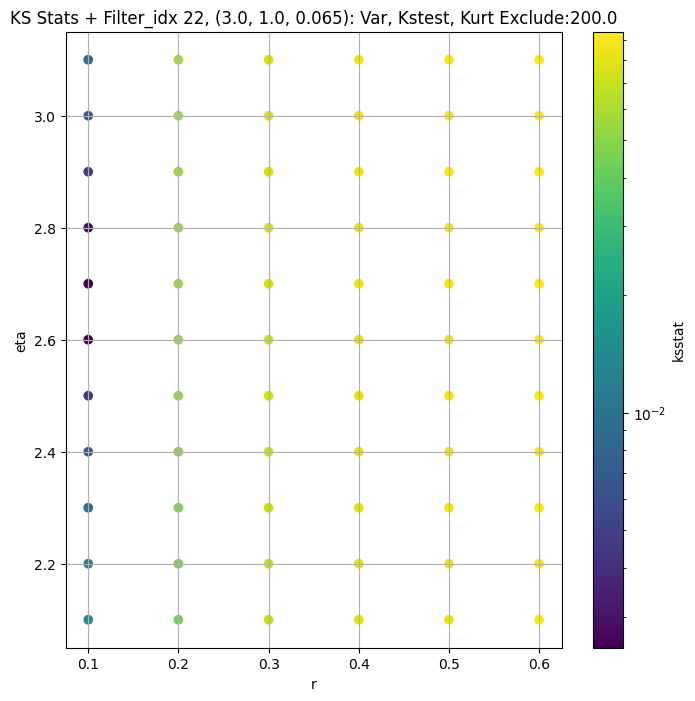

####
Filter_idx, 23: (3.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 0 0.019589325539082658 29.92623


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 50 0.0064761812157042575 16.942072


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 100 0.0037048900750898672 14.747558


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 200 0.0035558509558948764 12.662242
Number of samples: 100000, Without approximation : 262144000.0


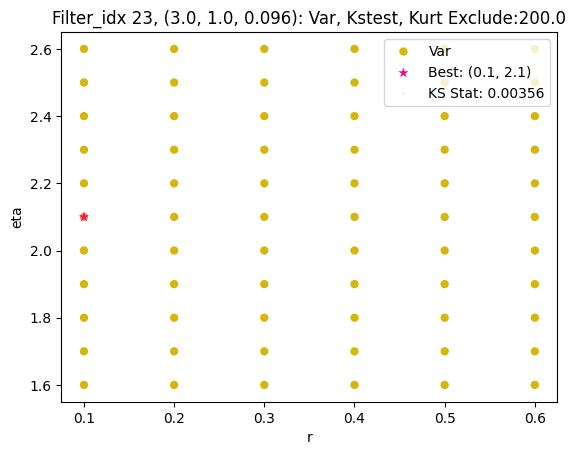

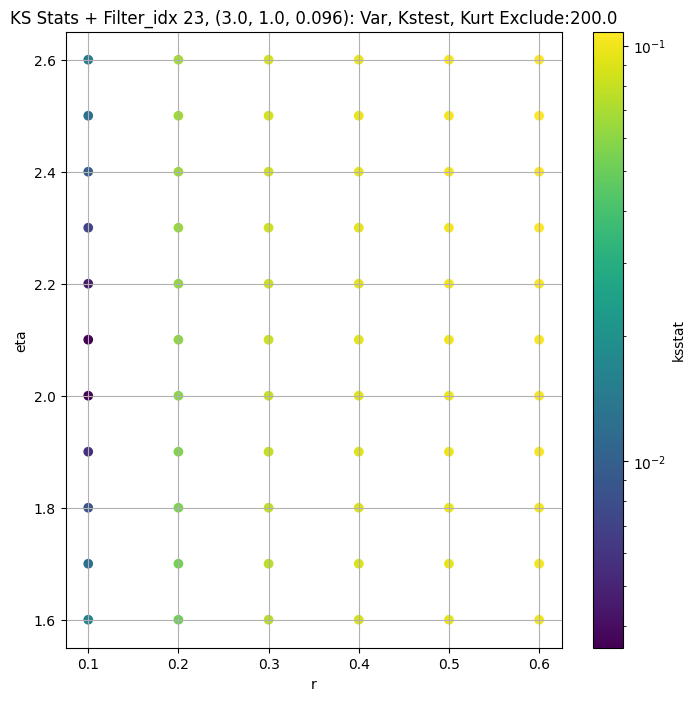

####
Filter_idx, 24: (3.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 0 0.0086046246966055 9.18067


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 50 0.002614378553159491 6.478615


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 100 0.0032642649968979143 6.0606976


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 200 0.00452219642195717 5.525719
Number of samples: 100000, Without approximation : 262144000.0


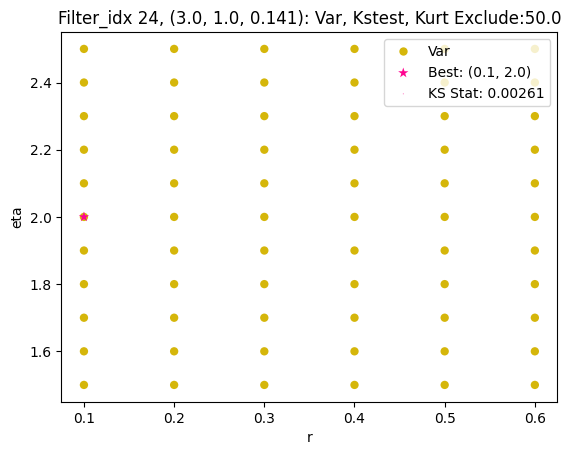

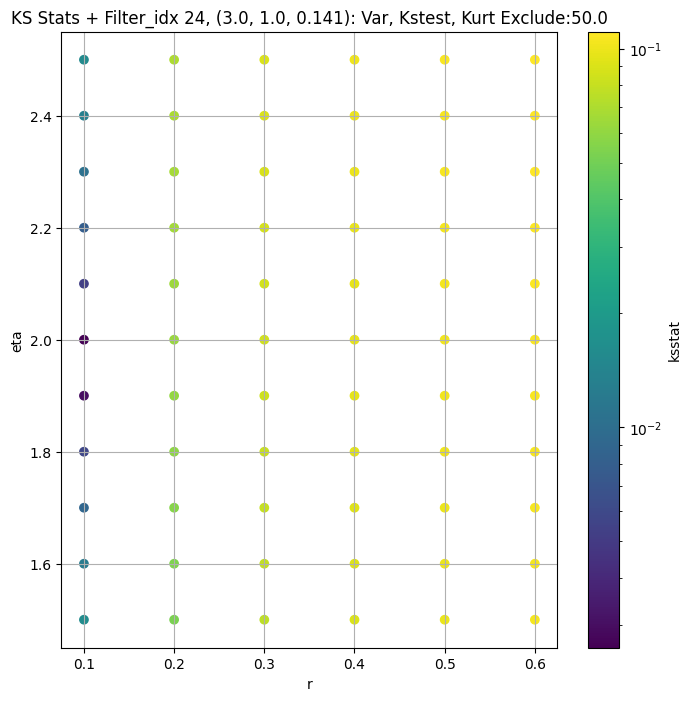

####
Filter_idx, 25: (3.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 0 0.03070242076689711 10.392351


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 50 0.021018791855071925 5.6787076


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 100 0.015885419772682652 4.408851


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 200 0.008866248430358104 3.1999106
Number of samples: 100000, Without approximation : 262144000.0


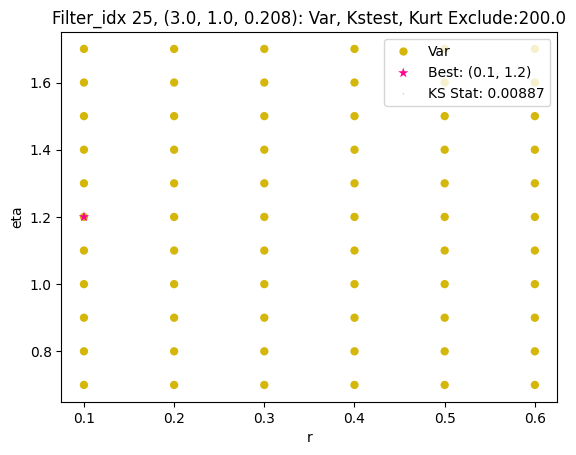

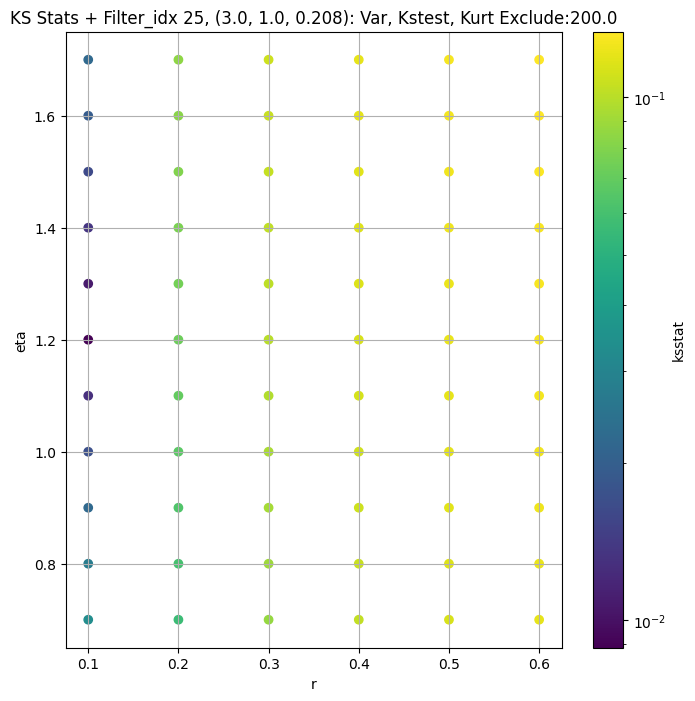

####
Filter_idx, 26: (3.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 0 0.02715526527198442 1.6148978


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 50 0.013722968894530452 0.8055424


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 100 0.010179500625051685 0.6561953


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 200 0.006205010893299057 0.53404546
Number of samples: 100000, Without approximation : 262144000.0


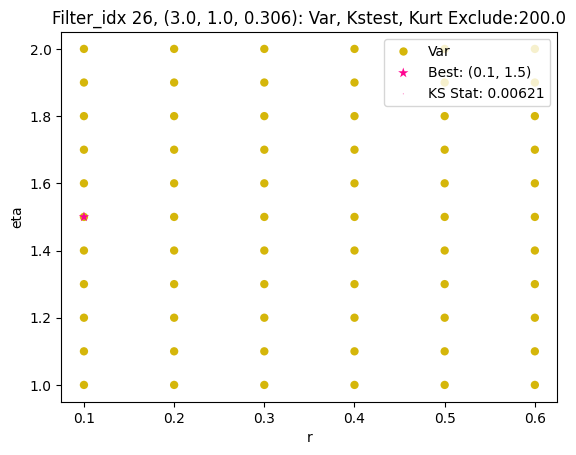

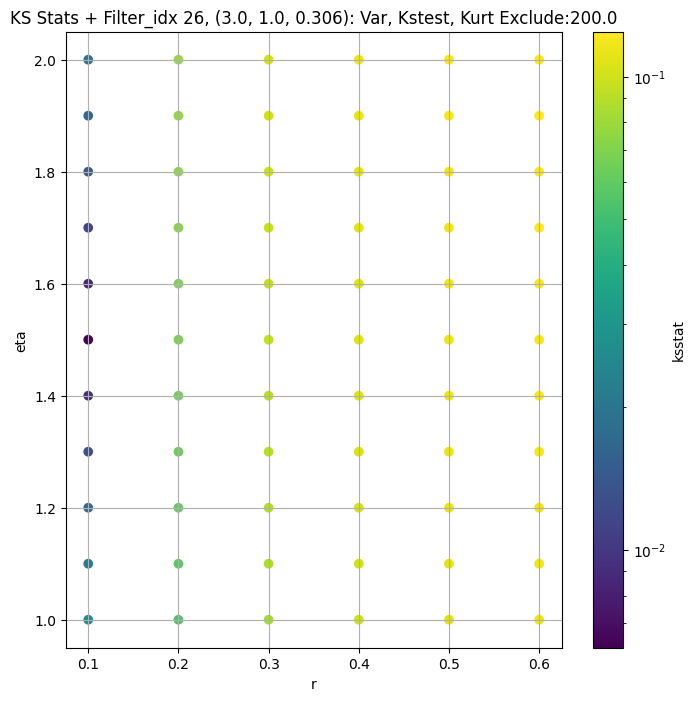

####
Filter_idx, 27: (3.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 0 0.034597039824119546 0.48520938


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 50 0.017167189683711143 0.17973968


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 100 0.012912987627307637 0.14628151


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 200 0.010452414203881044 0.11610006
Number of samples: 100000, Without approximation : 262144000.0


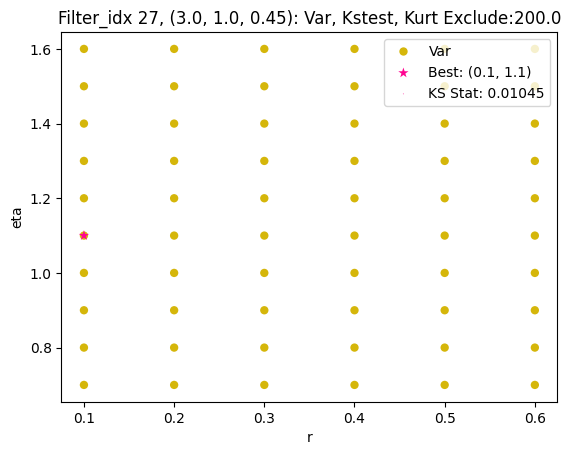

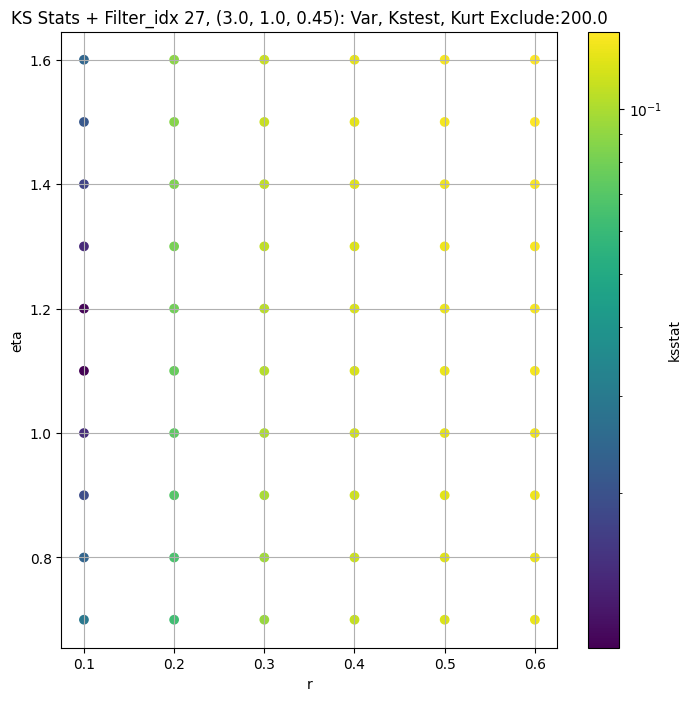

####
Filter_idx, 28: (4.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 0 0.016399419786121305 55.464695


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 50 0.003532336469179484 33.85059


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 100 0.001552707059923053 30.346762


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 200 0.002924823268647514 26.785652
Number of samples: 100000, Without approximation : 262144000.0


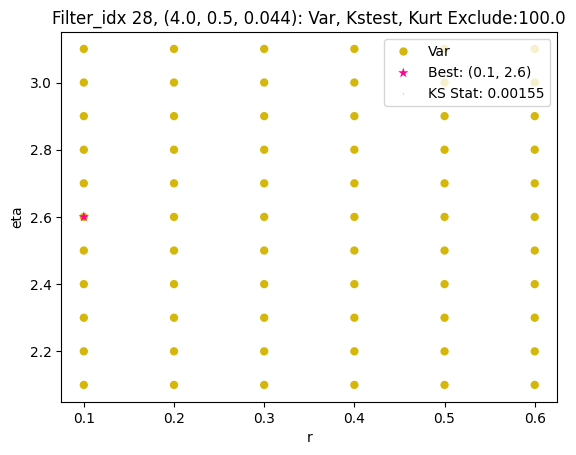

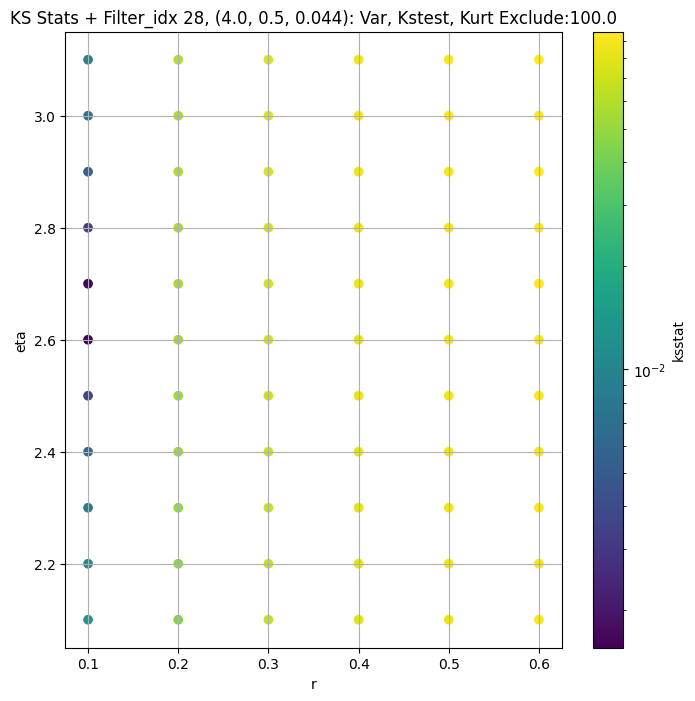

####
Filter_idx, 29: (4.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 0 0.023651975396297154 42.59629


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 50 0.006795193349283572 19.872631


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 100 0.0019274847374372572 16.727026


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 200 0.002638487555617933 14.210953
Number of samples: 100000, Without approximation : 262144000.0


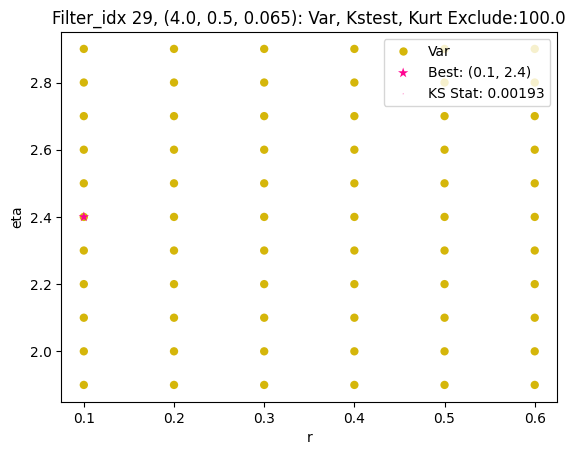

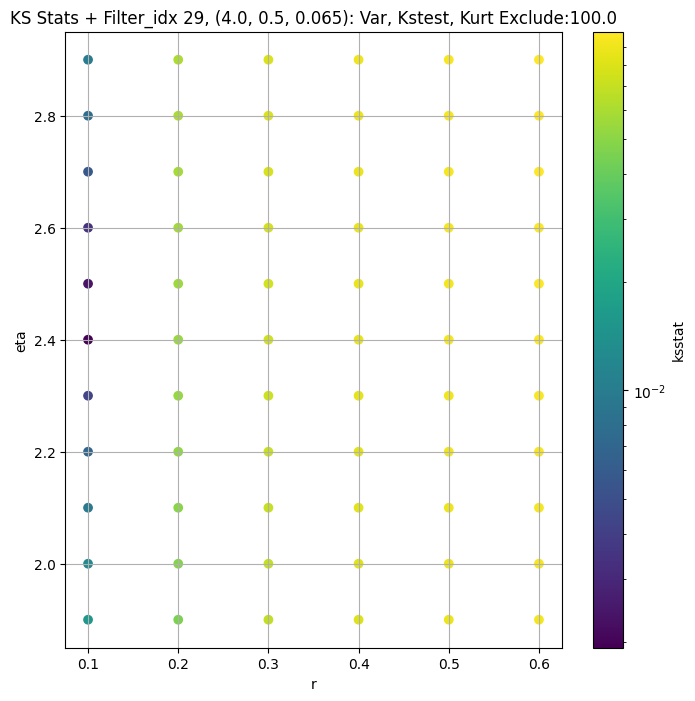

####
Filter_idx, 30: (4.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 0 0.024537932126988224 36.765217


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 50 0.011482102050994536 18.465158


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 100 0.006525929605563793 14.969995


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 200 0.002607133471977968 11.858973
Number of samples: 100000, Without approximation : 262144000.0


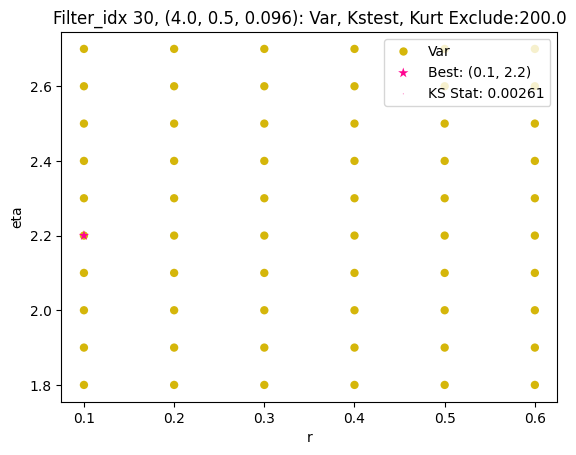

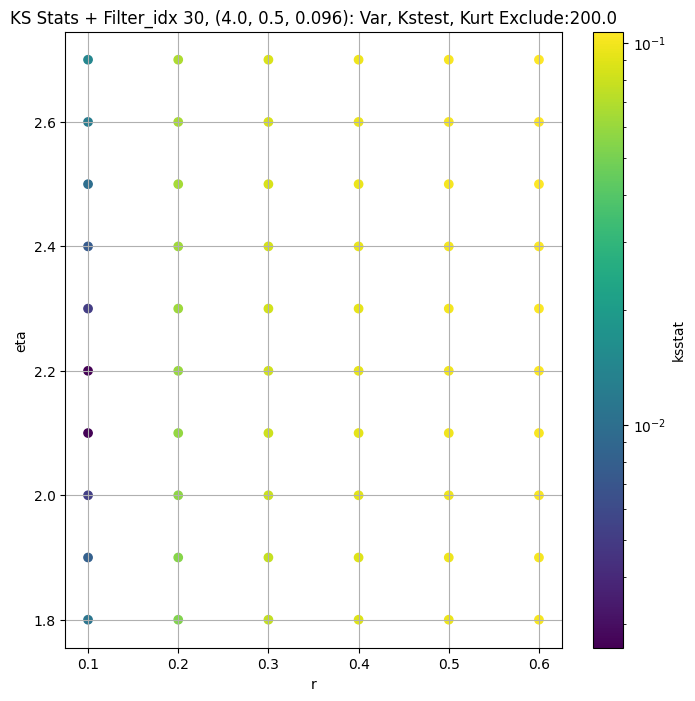

####
Filter_idx, 31: (4.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 0 0.032628912612390426 26.165375


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 50 0.015839806116680344 11.280693


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 100 0.011195234265734655 8.690303


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 200 0.005645178935339723 6.6765513
Number of samples: 100000, Without approximation : 262144000.0


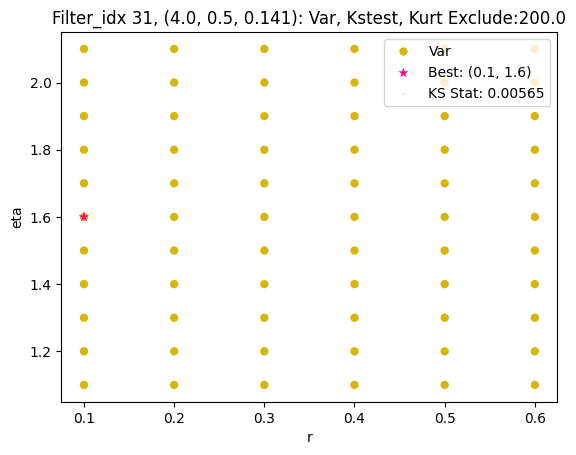

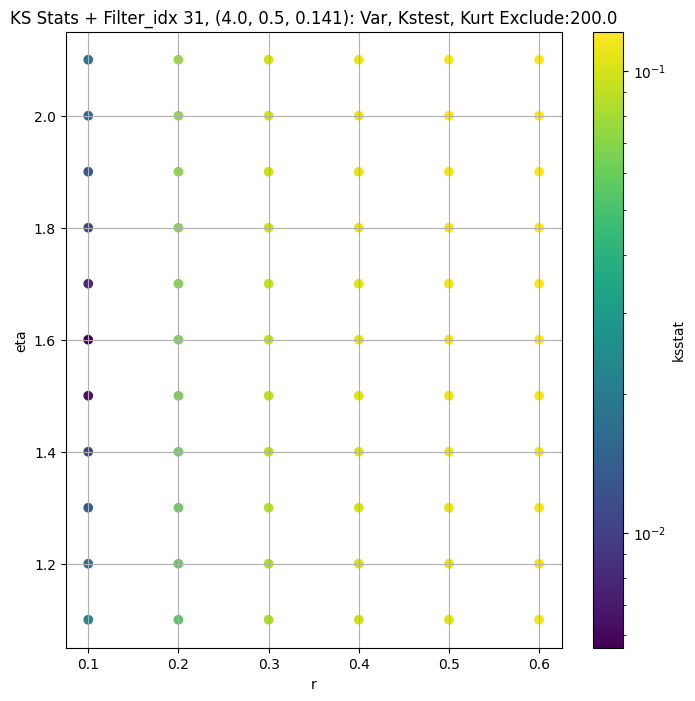

####
Filter_idx, 32: (4.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 0 0.03155827630938546 6.0620213


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 50 0.019051443496837128 3.4679396


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 100 0.01578899278028656 2.7593257


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 200 0.01032229202101953 2.102159
Number of samples: 100000, Without approximation : 262144000.0


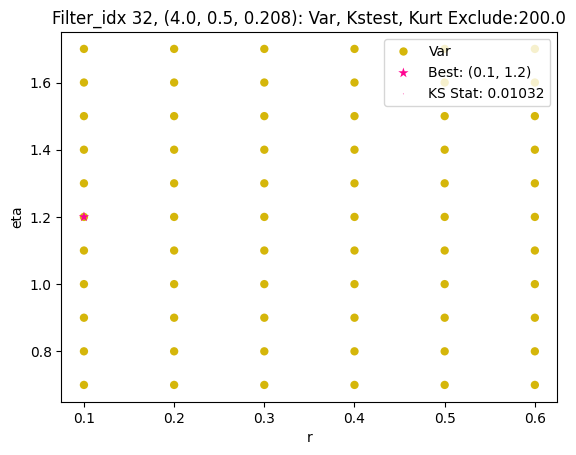

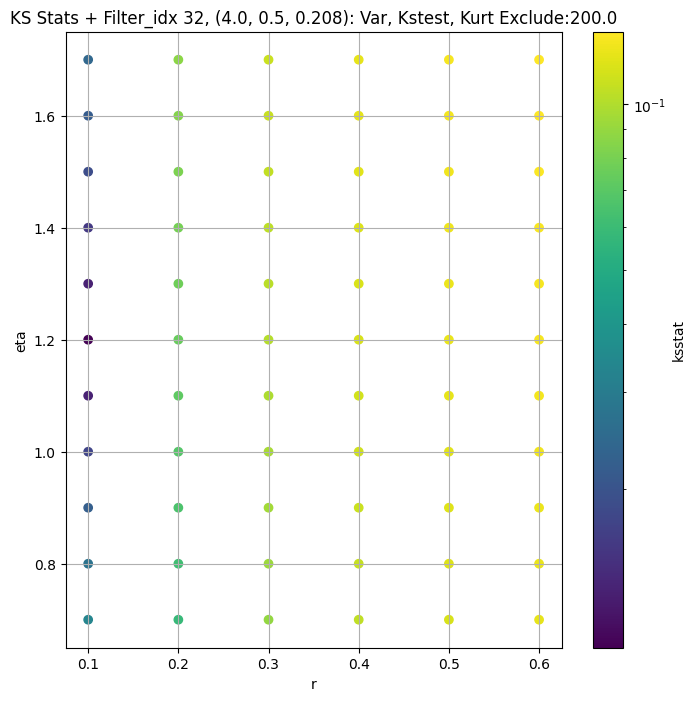

####
Filter_idx, 33: (4.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 0 0.02121827331316252 0.62071776


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 50 0.009064064552731399 0.3426612


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 100 0.0073300691021185305 0.29529643


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 200 0.0049454143535659426 0.25267154
Number of samples: 100000, Without approximation : 262144000.0


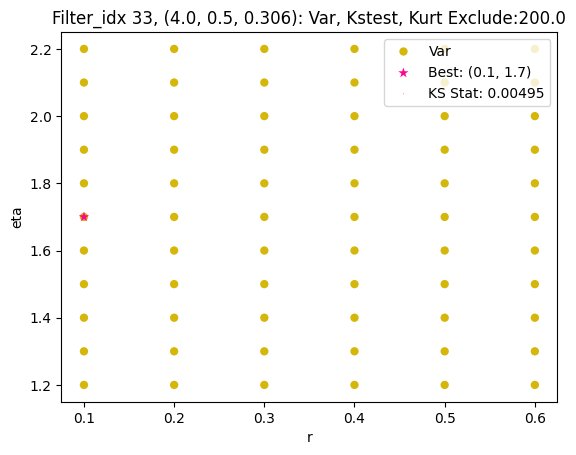

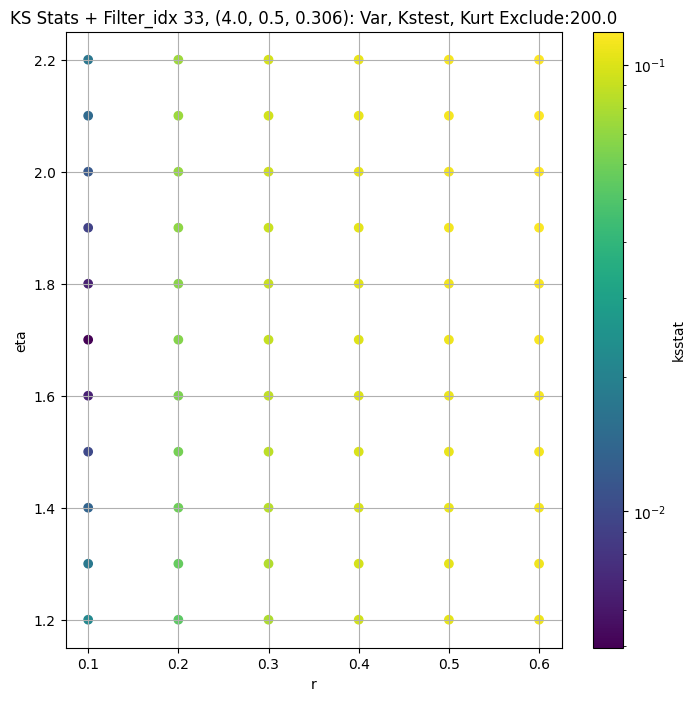

####
Filter_idx, 34: (4.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 0 0.0302397574376988 0.16974755


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 50 0.015611013709406957 0.07122631


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 100 0.014626377797383183 0.061566893


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 200 0.010685632081564644 0.05181806
Number of samples: 100000, Without approximation : 262144000.0


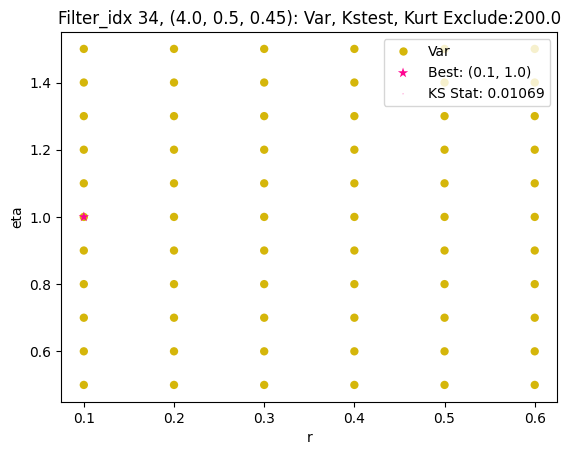

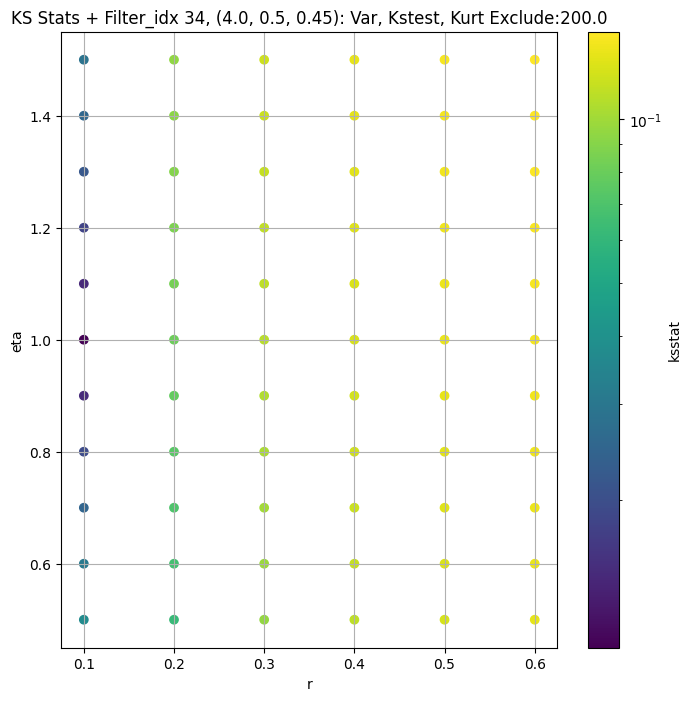

####
Filter_idx, 35: (4.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 0 0.02705912203887806 96.42034


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 50 0.008271708658779832 39.845276


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 100 0.0028775894279447073 32.909748


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 200 0.0026061622811167926 27.457342
Number of samples: 100000, Without approximation : 262144000.0


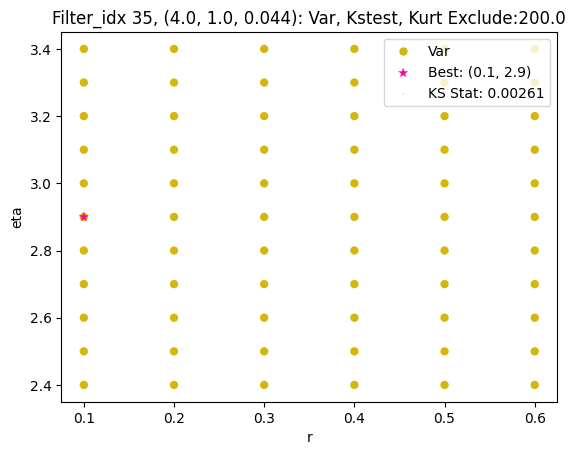

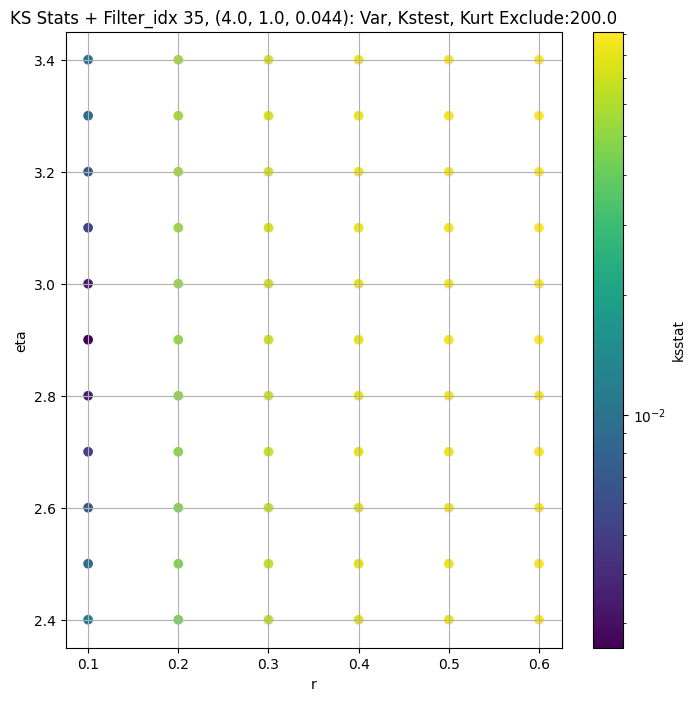

####
Filter_idx, 36: (4.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 0 0.01856905137324838 35.171085


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 50 0.004603040904071501 19.798876


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 100 0.0015241691186573814 17.489897


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 200 0.0029252116345505307 15.298115
Number of samples: 100000, Without approximation : 262144000.0


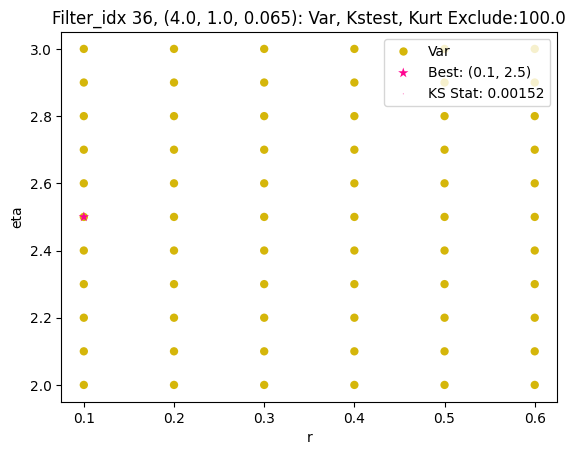

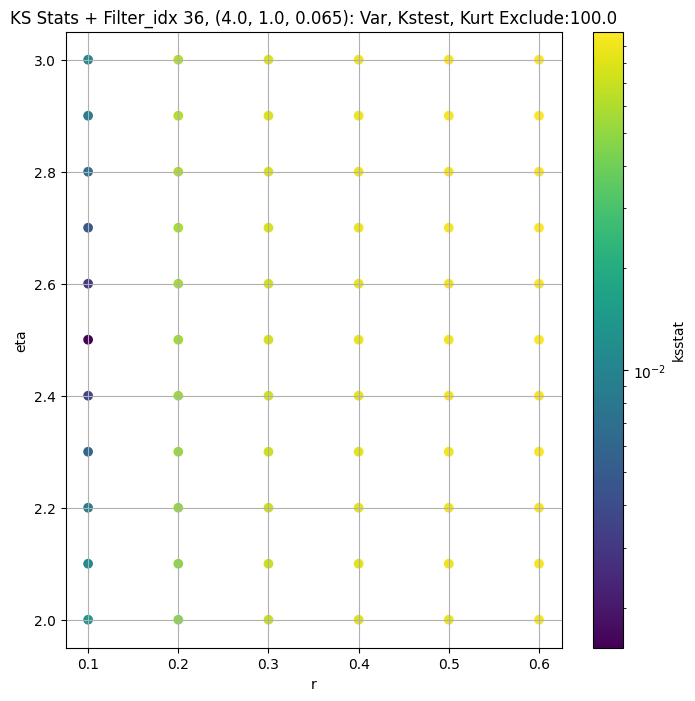

####
Filter_idx, 37: (4.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 0 0.024074908176584975 33.92649


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 50 0.007922683972462763 15.401537


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 100 0.004454686095784172 13.171143


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 200 0.003497752948897405 11.280186
Number of samples: 100000, Without approximation : 262144000.0


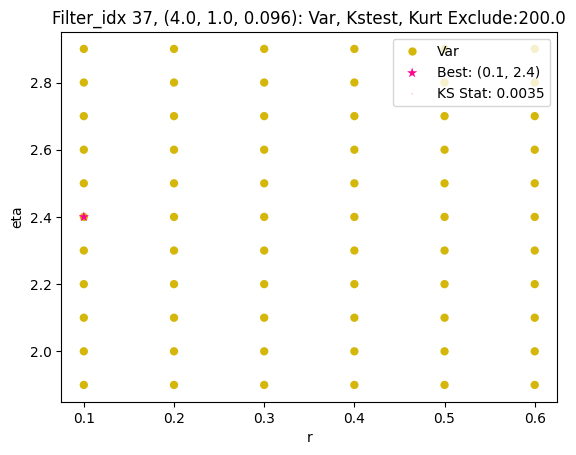

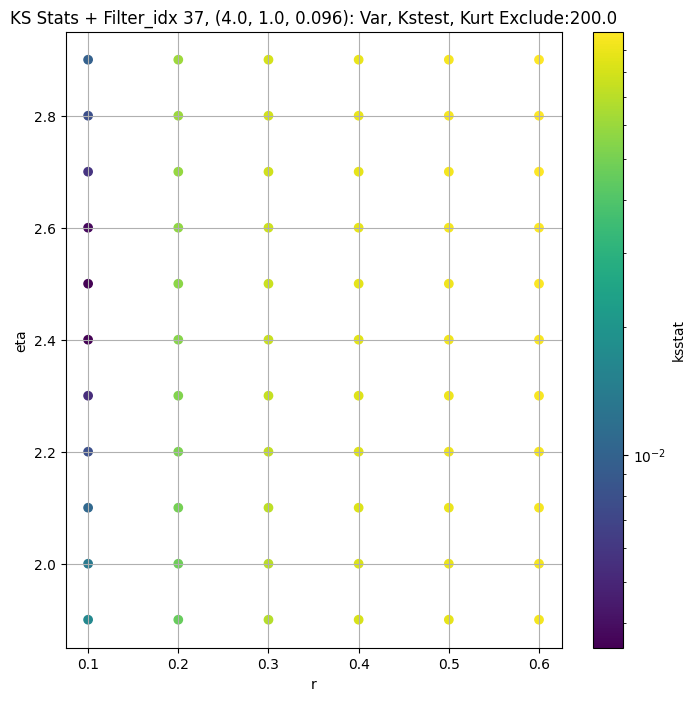

####
Filter_idx, 38: (4.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 0 0.03222505365731476 28.359837


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 50 0.014613301880080337 11.323949


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 100 0.009854867257762856 9.509749


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 200 0.0061522296694175305 7.6272902
Number of samples: 100000, Without approximation : 262144000.0


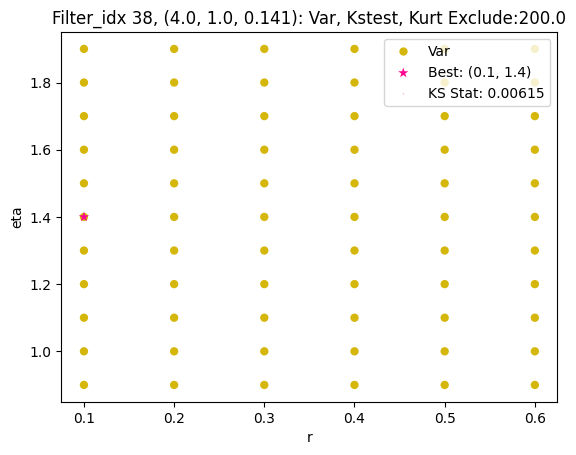

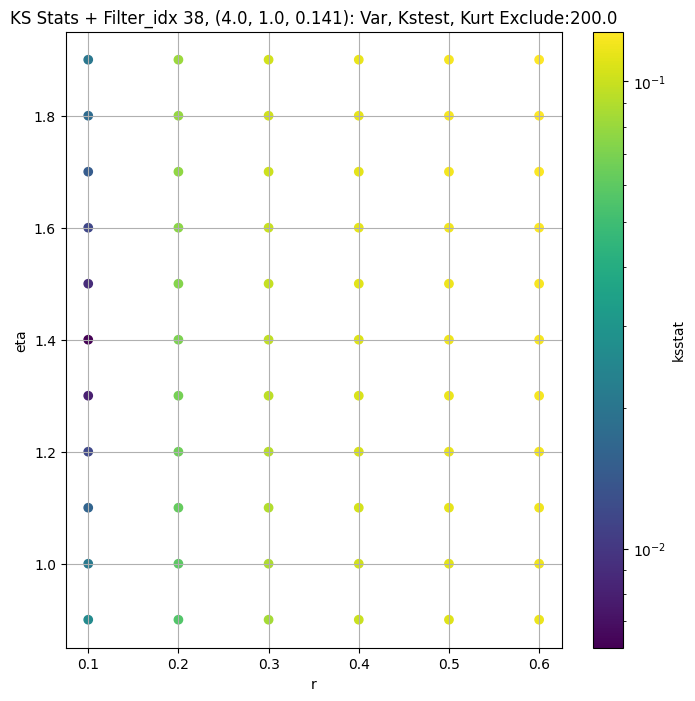

####
Filter_idx, 39: (4.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 0 0.03232046743881056 8.556268


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 50 0.020799806545178323 4.167284


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 100 0.014379932877437496 3.079044


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 200 0.009043566563647798 2.2261448
Number of samples: 100000, Without approximation : 262144000.0


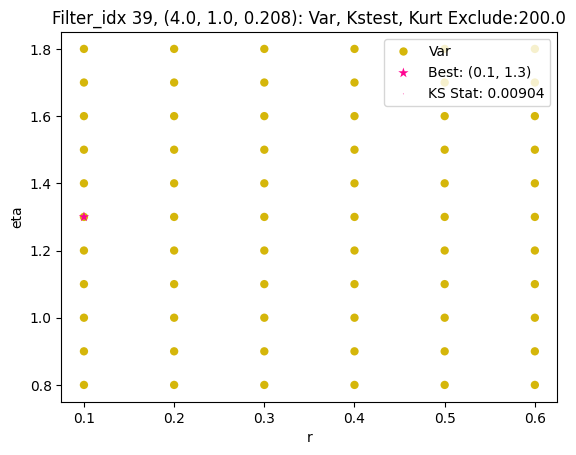

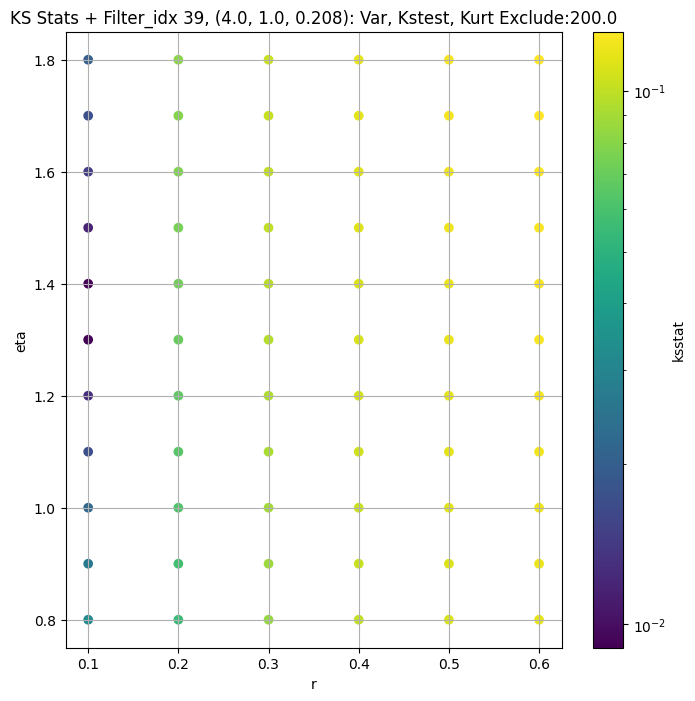

####
Filter_idx, 40: (4.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 0 0.02748905733849963 1.3124895


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 50 0.014346792622081092 0.59122336


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 100 0.011768642983738364 0.48338205


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 200 0.006543101514177585 0.3894139
Number of samples: 100000, Without approximation : 262144000.0


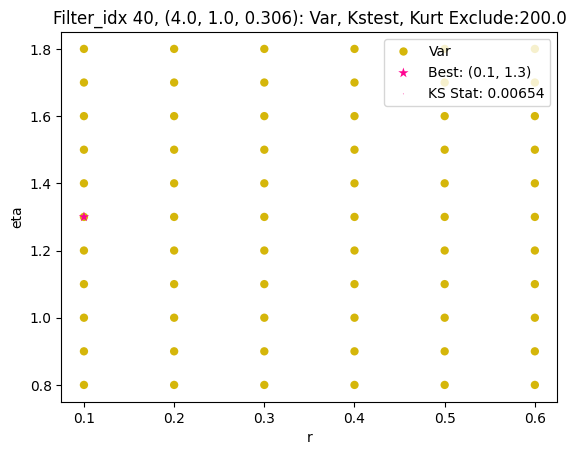

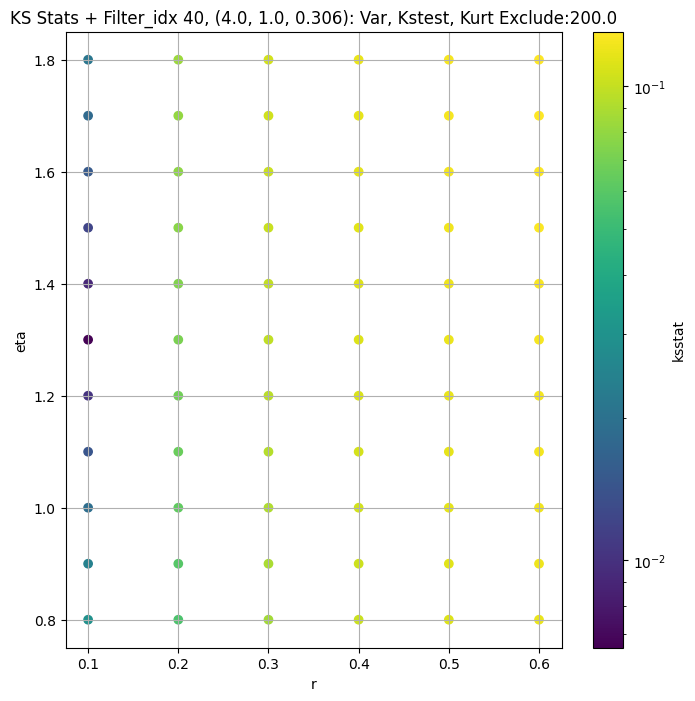

####
Filter_idx, 41: (4.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 0 0.04186714977521197 0.340345


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 50 0.016389016716335858 0.08073604


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 100 0.014745460606465727 0.069237985


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 200 0.012152882282993882 0.057765506
Number of samples: 100000, Without approximation : 262144000.0


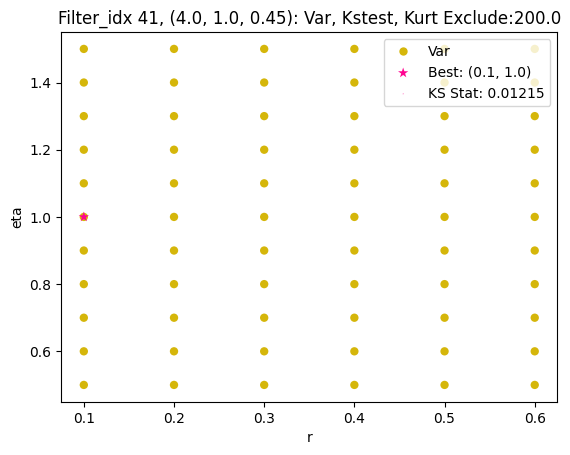

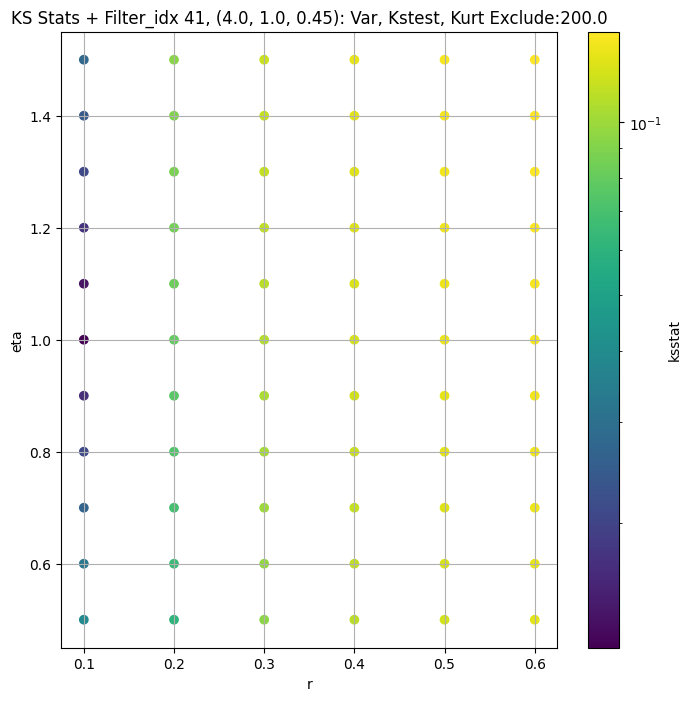

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,initial_r,initial_eta,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05
filter_idx,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",85.236410,28.694447,732.051450,1326.75440,8.503800,845.48750,262144000.0,"(2.0, 0.5, 0.044)",0.003028,0.1,2.9,4.556879e-16,200.0,32.243713,0.000084
1,"(2.0, 0.5, 0.065)",55.119440,16.155226,348.341670,905.38780,7.874421,853.06590,262144000.0,"(2.0, 0.5, 0.065)",0.002430,0.2,0.6,5.914424e-05,200.0,17.474768,0.000084
2,"(2.0, 0.5, 0.096)",22.824420,9.009885,101.607285,555.71906,5.062737,758.95074,262144000.0,"(2.0, 0.5, 0.096)",0.001922,0.1,2.5,4.031813e-16,50.0,12.023202,0.000084
3,"(2.0, 0.5, 0.141)",9.843026,4.680263,53.985220,570.56400,6.635873,714.98520,262144000.0,"(2.0, 0.5, 0.141)",0.002410,0.1,2.3,3.105815e-16,100.0,5.835878,0.000084
4,"(2.0, 0.5, 0.208)",6.010580,1.755476,35.830950,694.43570,11.610837,844.96704,262144000.0,"(2.0, 0.5, 0.208)",0.003833,0.1,1.9,2.906257e-16,200.0,2.022064,0.000084
5,"(2.0, 0.5, 0.306)",2.173437,0.544470,9.934200,431.17087,24.019732,662.25964,262144000.0,"(2.0, 0.5, 0.306)",0.012624,0.1,1.0,1.555497e-15,200.0,0.740164,0.000084
6,"(2.0, 0.5, 0.45)",0.541408,0.220924,4.927081,1347.73650,10.447507,847.39990,262144000.0,"(2.0, 0.5, 0.45)",0.005524,0.1,1.5,1.120970e-16,200.0,0.258607,0.000084
7,"(2.0, 1.0, 0.044)",104.480480,31.121315,1179.829300,2493.79760,8.534616,922.46640,262144000.0,"(2.0, 1.0, 0.044)",0.002877,0.1,3.1,3.247630e-16,200.0,34.469532,0.000084
8,"(2.0, 1.0, 0.065)",47.764854,16.399597,625.038300,3161.99980,6.106381,912.12420,262144000.0,"(2.0, 1.0, 0.065)",0.002479,0.1,3.0,2.419203e-16,100.0,21.008305,0.000084


In [12]:
master_df_combo_path = Path(os.path.join(CWD, "CSVs", "master_df_combo.csv"))
rEtaKsstats_dict_path = Path(os.path.join(CWD, "cache", "rEtaKsstats_dict.pickle"))

rEtaKsstats_dict = dict()

if RERUN or not master_df_combo_path.exists():
    sorted_params = sorted(all_cdfs)
    ksstats_dict = dict()

    for i, group in enumerate(GROUPS): # TODO For quick testing purposes
        print(f"####\n{GROUP.capitalize()}, {group}: {str(filter_group_map[group])}")
        sample = group_data_map[group]
        if len(sample) == 0:
            continue
        group_cdfs_df = all_cdfs_df.copy()
        master_df.loc[group, 'kstest_stat_initial'] = 1

        for j in range(len(EXCLUDE_CUTOFFS)):

            exclude_cutoff = EXCLUDE_CUTOFFS[j]
            exclude_cutoff = int(exclude_cutoff)

            if exclude_cutoff == 0:
                augmented_var = np.var(group_data_map[group]) 
            else:
                augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])
                if augmented_var == np.var(group_data_map[group]):
                    continue 
                
            group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
            ksstats, initial_param, min_stat = gridsearch(sample, all_cdfs, debug=True, scales=group_cdfs_df['scale'])
            augmented_var_df.loc[group, f"kstest_stat_{exclude_cutoff}"] = min_stat
            group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] = ksstats
            
            print(group, exclude_cutoff, min_stat, augmented_var)
            
            if (min_stat < master_df.loc[group, 'kstest_stat_initial']) and not np.isclose(min_stat, master_df.loc[group, 'kstest_stat_initial'], 1e-6):
                inital_min_stat = min_stat
                inital_best_param = initial_param
                master_df.loc[group, 'kstest_stat_initial'] = min_stat
                initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                master_df.loc[group, 'initial_r'], master_df.loc[group, 'initial_eta'] = initial_param
                master_df.loc[group, 'initial_scale'] = initial_scale
                master_df.loc[group, 'initial_exclude_cutoff'] = exclude_cutoff
                master_df.loc[group, 'best_augmented_var'] = augmented_var
        
        ksstats = group_cdfs_df[f"ksstat_exclude_{int(master_df.loc[group, 'initial_exclude_cutoff'])}"]
            
        print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
        
        cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
        master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

        best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

        group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
        group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

        group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

        group_dict = {'r' : group_cdfs_df['r'], 'eta' : group_cdfs_df['eta']}
        group_dict.update({f'ksstat_exclude_{exclude_cutoff}' : group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] for exclude_cutoff in EXCLUDE_CUTOFFS[:j+1]})
        rEtaKsstats_dict[group] = group_dict

        cols = ['pass_var', 'pass_kstest', 'pass_kurt']

        fig = combo_test_plot(group_cdfs_df, cols, 
                            plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: {', '.join([col[5:].capitalize() for col in cols])} Exclude:{master_df.loc[group, 'initial_exclude_cutoff']}", 
                            target_var = None,
                            best_param = inital_best_param,
                            best_ksstat=inital_min_stat
                            )
        
        fig.figure.savefig(os.path.join(CWD, "plots", f"full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)

        # Optional: 
        # Create plots of bootstrapped variance and kurtosis for varying confidence intervals
        # fig_var = create_ci_scatter_plot(group_cdfs_df, var_values_dict, metric='variance', group=group)
        # fig_kurt = create_ci_scatter_plot(group_cdfs_df, kurt_values_dict, metric='kurtosis', group=group)

        # fig_var.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_var)
        # fig_kurt.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_kurt)

    # new: add parameter information
    master_df.insert(0, 'params', master_df.index.map(filter_group_map))

    master_df.to_csv(master_df_combo_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)
    augmented_var_df.to_csv(augmented_var_df_path)

augmented_var_df = pd.read_csv(augmented_var_df_path, index_col=GROUP)
master_df = pd.read_csv(master_df_combo_path, index_col=GROUP)
rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df

## Optimization

In [13]:
master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
master_df[f'best_r'] = master_df['initial_r']
master_df[f'best_eta'] = master_df['initial_eta']
master_df[f'best_scale'] = master_df['initial_scale']
master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

Filter_idx 0, (2.0, 0.5, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 100 = 300, ksstat: 0.004372740656580465, var: 29.16977882385254


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 75 = 275, ksstat: 0.004045251193012489, var: 29.819541931152344


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 50 = 250, ksstat: 0.0036983241269685947, var: 30.53727149963379


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 25 = 225, ksstat: 0.003359277590193166, var: 31.33845329284668


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 0 = 200, ksstat: 0.0030282741099896026, var: 32.24371337890625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + -25 = 175, ksstat: 0.002736926359091063, var: 33.28166198730469


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + -50 = 150, ksstat: 0.0033257749766645306, var: 34.494354248046875


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + -75 = 125, ksstat: 0.004249484235415157, var: 35.94963836669922


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + -100 = 100, ksstat: 0.005564954051794635, var: 37.78014373779297
Number of samples: 100000, Without approximation : 262144000.0


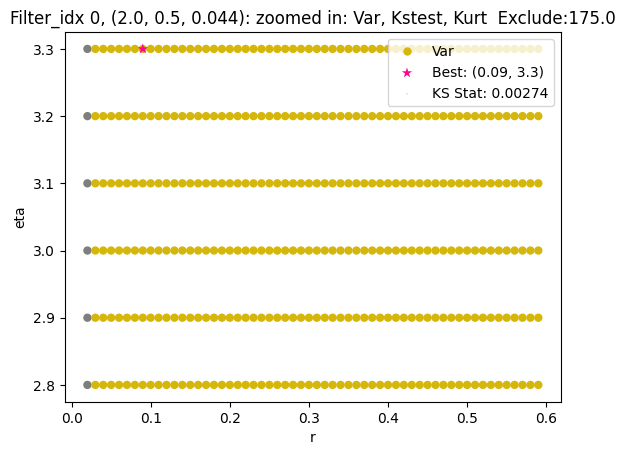

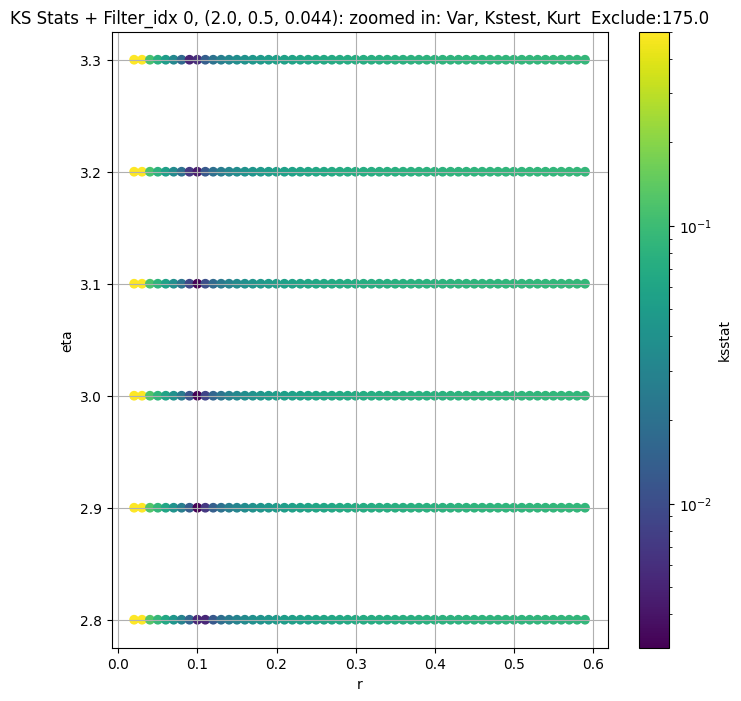

Filter_idx 1, (2.0, 0.5, 0.065):


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 1, 200.0 + 100 = 300, ksstat: 0.0039947798200489736, var: 15.578279495239258


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 1, 200.0 + 75 = 275, ksstat: 0.003441064435947272, var: 15.949155807495117


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 1, 200.0 + 50 = 250, ksstat: 0.002930492664431572, var: 16.376434326171875


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 1, 200.0 + 25 = 225, ksstat: 0.0026119239258658444, var: 16.87723159790039


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 1, 200.0 + 0 = 200, ksstat: 0.002371510900979568, var: 17.474767684936523


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 1, 200.0 + -25 = 175, ksstat: 0.0022043481705953383, var: 18.205141067504883


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 1, 200.0 + -50 = 150, ksstat: 0.0024443821114868147, var: 19.120542526245117


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 1, 200.0 + -75 = 125, ksstat: 0.00372997193997604, var: 20.29662322998047


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 1, 200.0 + -100 = 100, ksstat: 0.005253322351709069, var: 21.8563232421875
Number of samples: 100000, Without approximation : 262144000.0


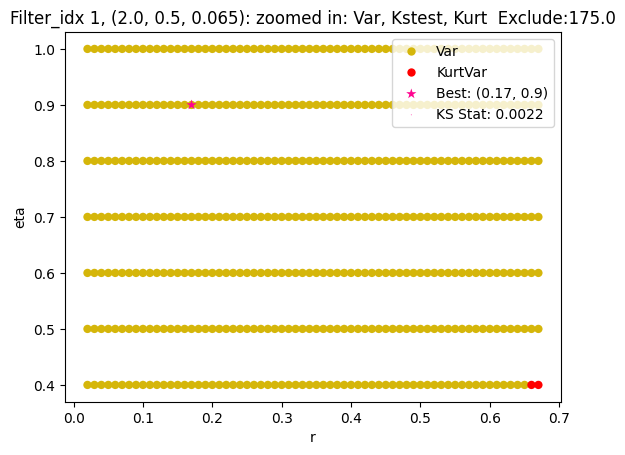

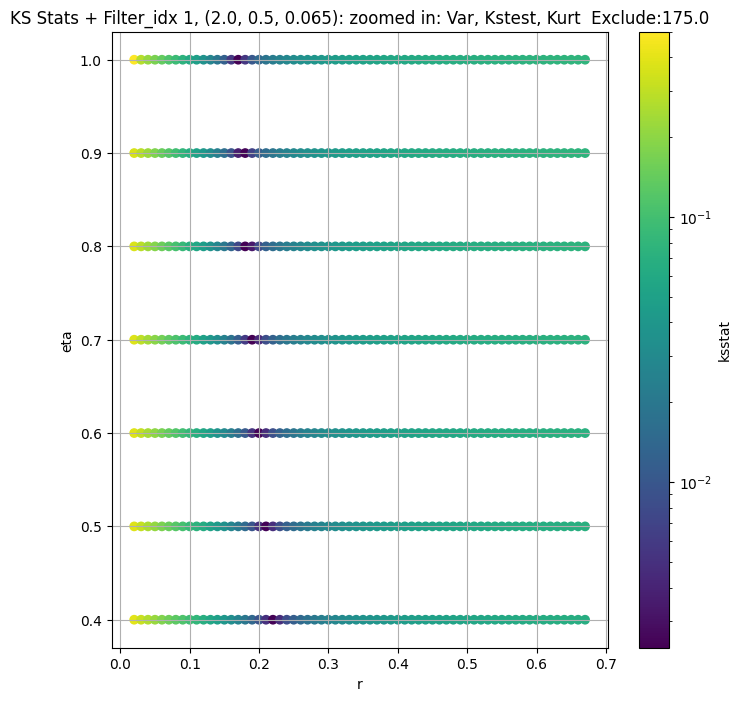

Filter_idx 2, (2.0, 0.5, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + 100 = 150, ksstat: 0.003526815618271173, var: 10.238774299621582


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + 75 = 125, ksstat: 0.0029196725642679777, var: 10.50262451171875


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + 50 = 100, ksstat: 0.0020591748825318362, var: 10.829366683959961


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + 25 = 75, ksstat: 0.0016859841806318165, var: 11.276715278625488


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + 0 = 50, ksstat: 0.0019219956336432031, var: 12.023201942443848


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + -25 = 25, ksstat: 0.005306452225444236, var: 14.010086059570312


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + -50 = 0, ksstat: 0.015470250258259058, var: 22.824420928955078
Number of samples: 100000, Without approximation : 262144000.0


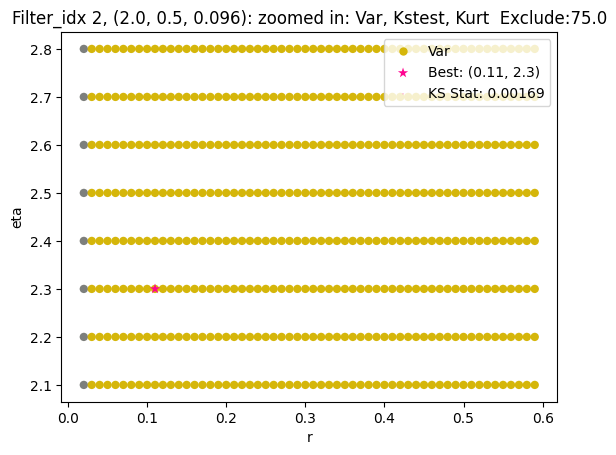

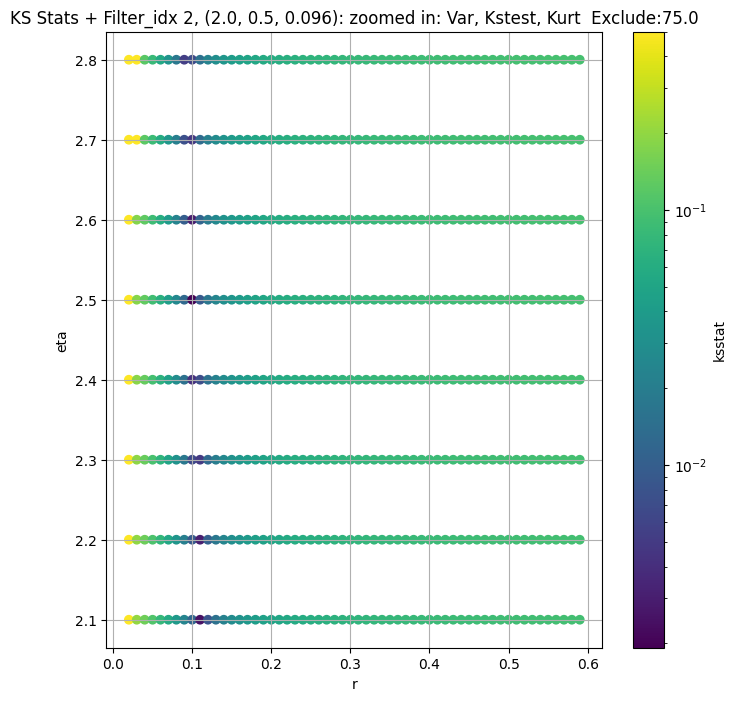

Filter_idx 3, (2.0, 0.5, 0.141):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 3, 100.0 + 100 = 200, ksstat: 0.004435134705030208, var: 5.241225719451904


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 3, 100.0 + 75 = 175, ksstat: 0.003890175263309134, var: 5.361677169799805


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 3, 100.0 + 50 = 150, ksstat: 0.003315960722337863, var: 5.497097015380859


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 3, 100.0 + 25 = 125, ksstat: 0.0027511898761145674, var: 5.6524505615234375


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 3, 100.0 + 0 = 100, ksstat: 0.002232836851946529, var: 5.835877895355225


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 3, 100.0 + -25 = 75, ksstat: 0.0022906241109595937, var: 6.062448501586914


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 3, 100.0 + -50 = 50, ksstat: 0.0028513552375657447, var: 6.368092060089111


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 3, 100.0 + -75 = 25, ksstat: 0.003669189787940952, var: 6.886055946350098


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 3, 100.0 + -100 = 0, ksstat: 0.0111668233142318, var: 9.843026161193848
Number of samples: 100000, Without approximation : 262144000.0


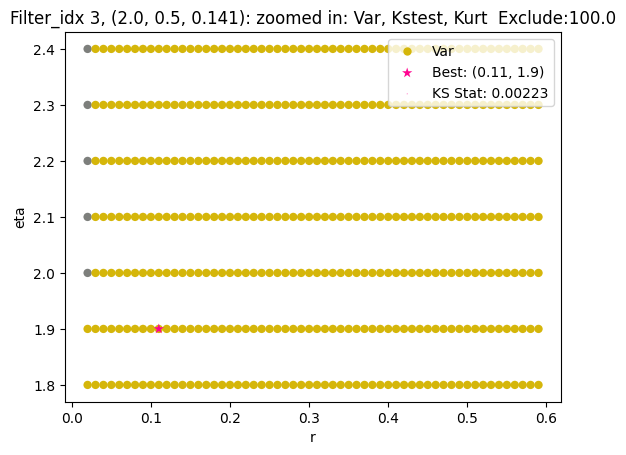

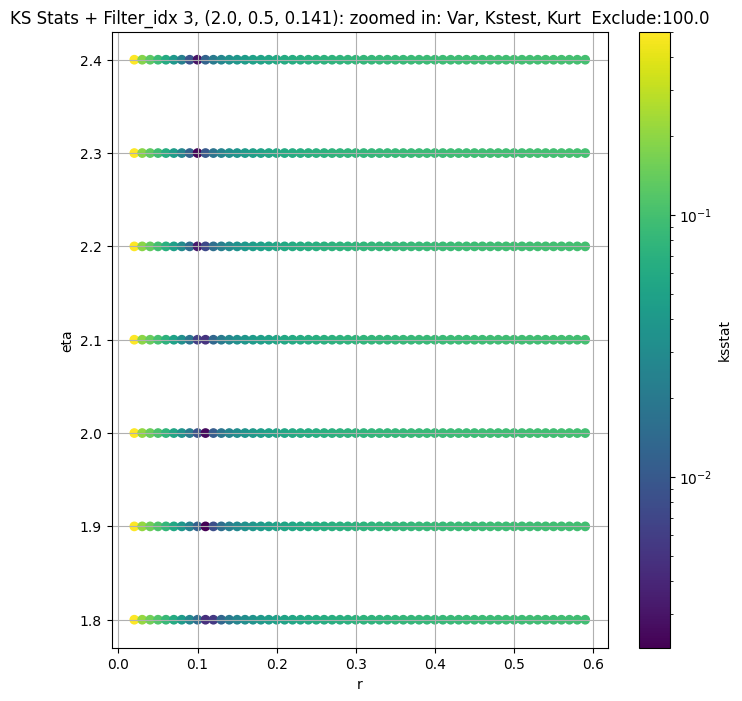

Filter_idx 4, (2.0, 0.5, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 100 = 300, ksstat: 0.005725394707474928, var: 1.8025480508804321


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 75 = 275, ksstat: 0.005229915947738029, var: 1.8472809791564941


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 50 = 250, ksstat: 0.004703387282461394, var: 1.8975436687469482


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 25 = 225, ksstat: 0.0042046263465900235, var: 1.9549591541290283


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 0 = 200, ksstat: 0.003586562199242027, var: 2.022064447402954


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + -25 = 175, ksstat: 0.004074852418036179, var: 2.102672576904297


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + -50 = 150, ksstat: 0.004382155235331309, var: 2.202920436859131


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + -75 = 125, ksstat: 0.006174923012037092, var: 2.3333497047424316


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + -100 = 100, ksstat: 0.006787122843254112, var: 2.5113189220428467
Number of samples: 100000, Without approximation : 262144000.0


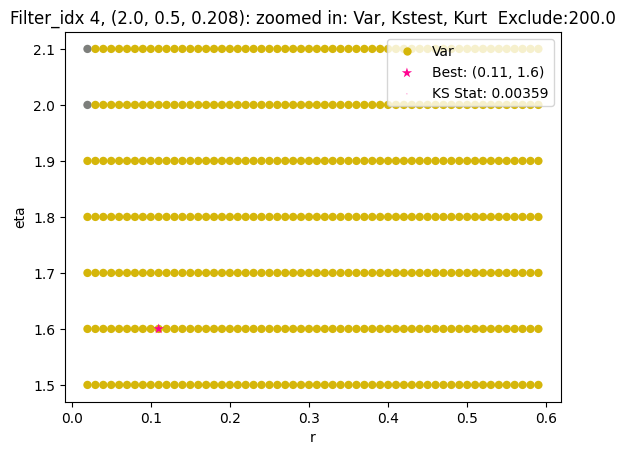

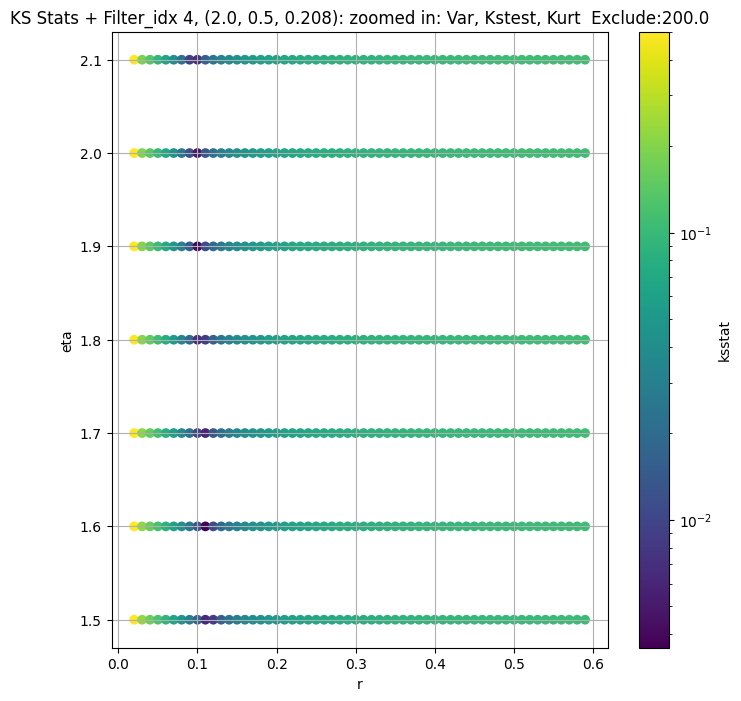

Filter_idx 5, (2.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 100 = 300, ksstat: 0.008907513012334084, var: 0.5907331705093384


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 75 = 275, ksstat: 0.00921508000227178, var: 0.6199199557304382


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 50 = 250, ksstat: 0.010071498246242372, var: 0.6538510322570801


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 25 = 225, ksstat: 0.010581327799763729, var: 0.6935250163078308


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 0 = 200, ksstat: 0.01208251886367906, var: 0.7401644587516785


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + -25 = 175, ksstat: 0.013829988926815973, var: 0.7953079342842102


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + -50 = 150, ksstat: 0.013859042439807068, var: 0.8611199259757996


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + -75 = 125, ksstat: 0.01612924433392149, var: 0.9406602382659912


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + -100 = 100, ksstat: 0.01689443393301726, var: 1.0385903120040894
Number of samples: 100000, Without approximation : 262144000.0


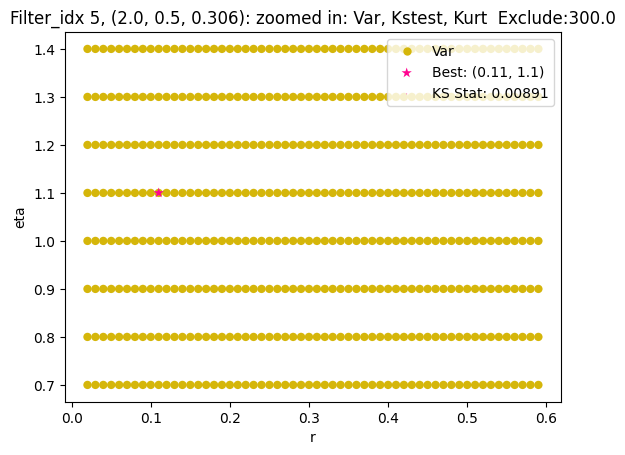

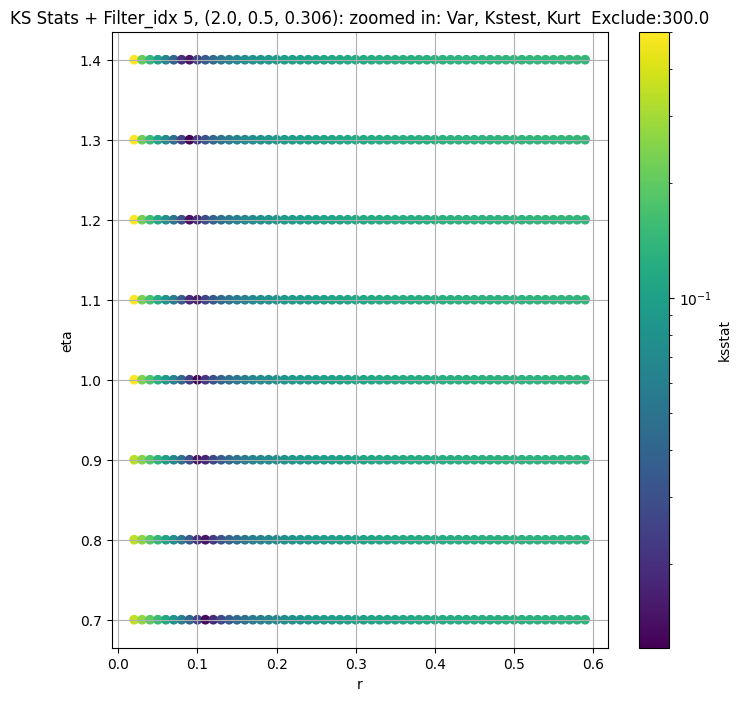

Filter_idx 6, (2.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 100 = 300, ksstat: 0.006877773291601663, var: 0.23508453369140625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 75 = 275, ksstat: 0.00653498199858633, var: 0.24026073515415192


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 50 = 250, ksstat: 0.00599058933517127, var: 0.24584975838661194


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 25 = 225, ksstat: 0.005632939711906038, var: 0.25192996859550476


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 0 = 200, ksstat: 0.0053837877366148534, var: 0.25860708951950073


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + -25 = 175, ksstat: 0.005521830943151951, var: 0.2660273015499115


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + -50 = 150, ksstat: 0.005940904657145474, var: 0.2743992805480957


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + -75 = 125, ksstat: 0.005981880371745518, var: 0.28405988216400146


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + -100 = 100, ksstat: 0.0066232779423930355, var: 0.2955664396286011
Number of samples: 100000, Without approximation : 262144000.0


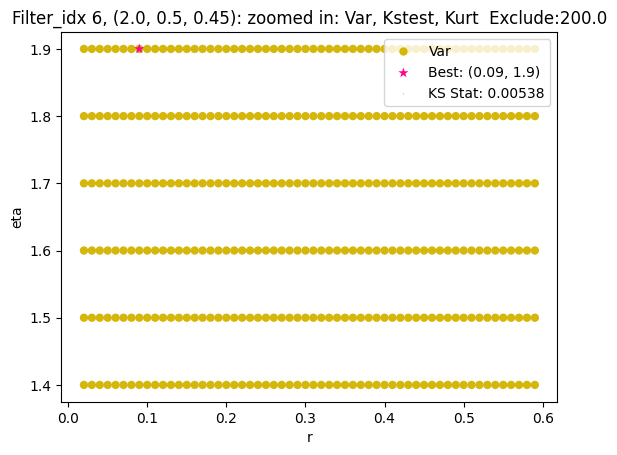

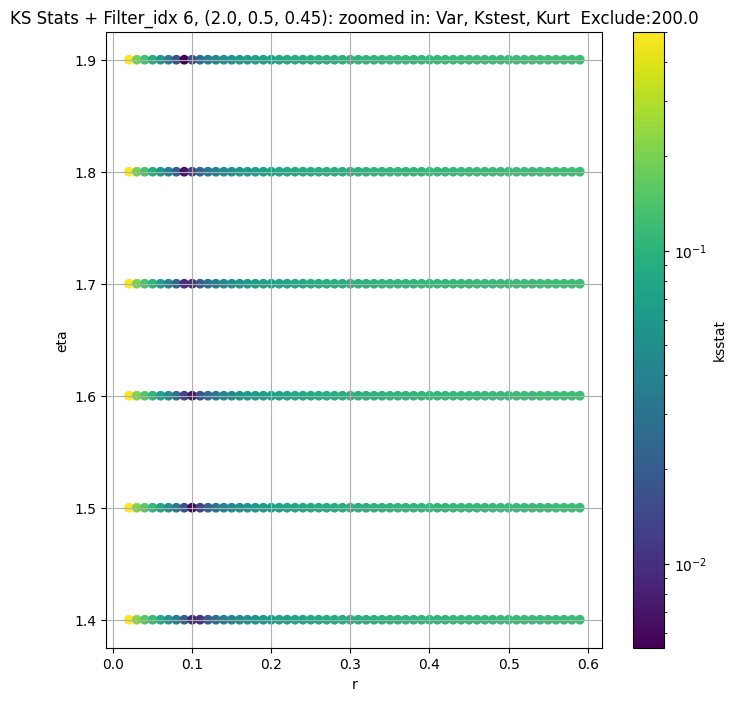

Filter_idx 7, (2.0, 1.0, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 100 = 300, ksstat: 0.00414077815155095, var: 31.139707565307617


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 75 = 275, ksstat: 0.003793777121130564, var: 31.83879852294922


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 50 = 250, ksstat: 0.0034649776901319873, var: 32.61397933959961


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 25 = 225, ksstat: 0.003146133477291424, var: 33.48268127441406


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 0 = 200, ksstat: 0.0028767430725926595, var: 34.46953201293945


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + -25 = 175, ksstat: 0.002582106377870554, var: 35.60786437988281


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + -50 = 150, ksstat: 0.0025133573701049683, var: 36.95267868041992


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + -75 = 125, ksstat: 0.003712683114508522, var: 38.59248352050781


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + -100 = 100, ksstat: 0.004975392977011772, var: 40.67512130737305
Number of samples: 100000, Without approximation : 262144000.0


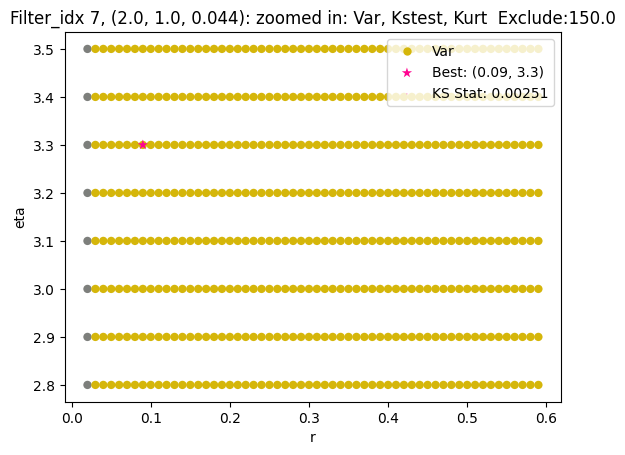

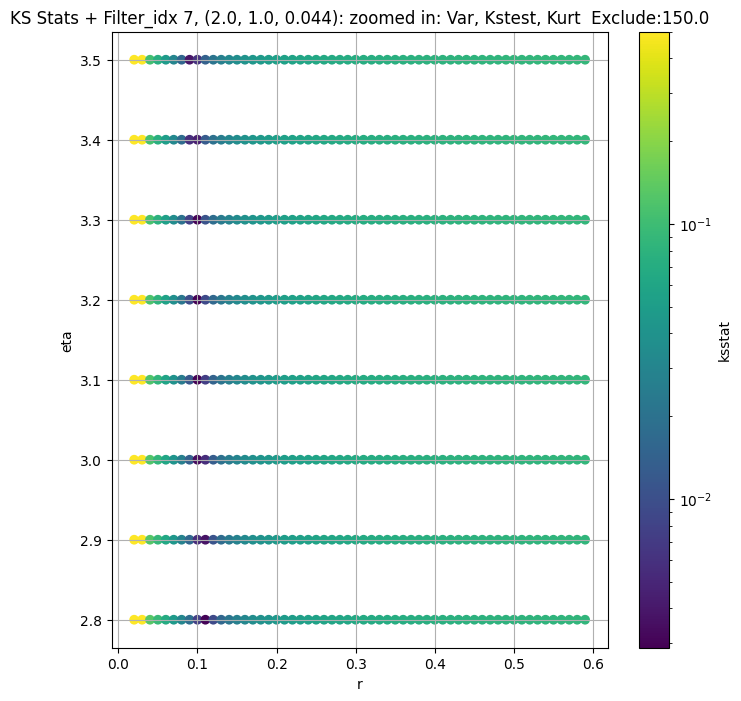

Filter_idx 8, (2.0, 1.0, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 100 = 200, ksstat: 0.0033300253284695436, var: 18.407947540283203


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 75 = 175, ksstat: 0.00291181093639839, var: 18.896610260009766


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 50 = 150, ksstat: 0.0027360350841533765, var: 19.468252182006836


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 25 = 125, ksstat: 0.002484363406603074, var: 20.15475082397461


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 0 = 100, ksstat: 0.0024791201544627217, var: 21.008304595947266


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + -25 = 75, ksstat: 0.0023839955797433365, var: 22.11585807800293


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + -50 = 50, ksstat: 0.004284916068412192, var: 23.656776428222656


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + -75 = 25, ksstat: 0.006491778840079898, var: 26.126178741455078


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + -100 = 0, ksstat: 0.018917696337577068, var: 47.764854431152344
Number of samples: 100000, Without approximation : 262144000.0


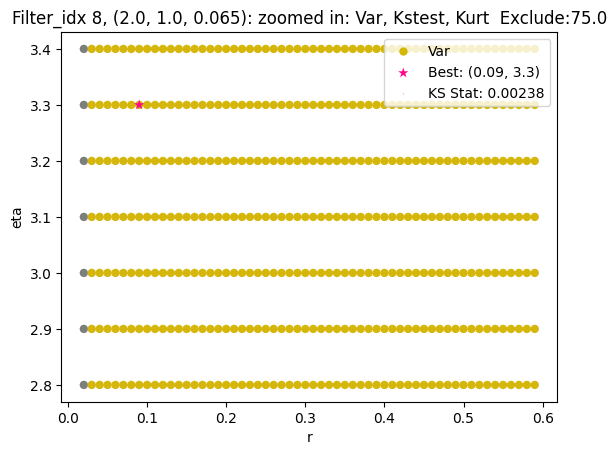

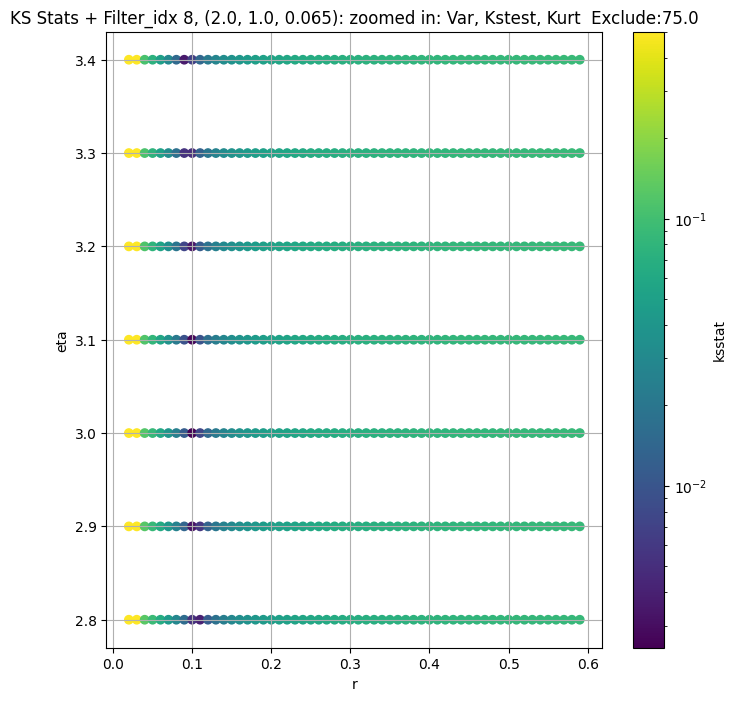

Filter_idx 9, (2.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 200.0 + 100 = 300, ksstat: 0.004556799992910775, var: 12.170707702636719


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 200.0 + 75 = 275, ksstat: 0.003962177446923287, var: 12.474176406860352


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 200.0 + 50 = 250, ksstat: 0.003390800103776015, var: 12.81455135345459


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 200.0 + 25 = 225, ksstat: 0.0029324079376490276, var: 13.201616287231445


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 200.0 + 0 = 200, ksstat: 0.0026093318916012905, var: 13.649003982543945


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 200.0 + -25 = 175, ksstat: 0.002353071564001916, var: 14.175740242004395


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 200.0 + -50 = 150, ksstat: 0.002120803613322567, var: 14.81060791015625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 200.0 + -75 = 125, ksstat: 0.0026432538190051535, var: 15.598316192626953


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 200.0 + -100 = 100, ksstat: 0.0039054870361016625, var: 16.603900909423828
Number of samples: 100000, Without approximation : 262144000.0


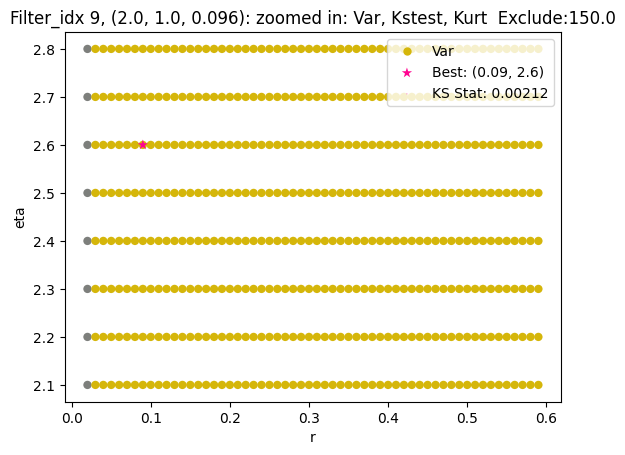

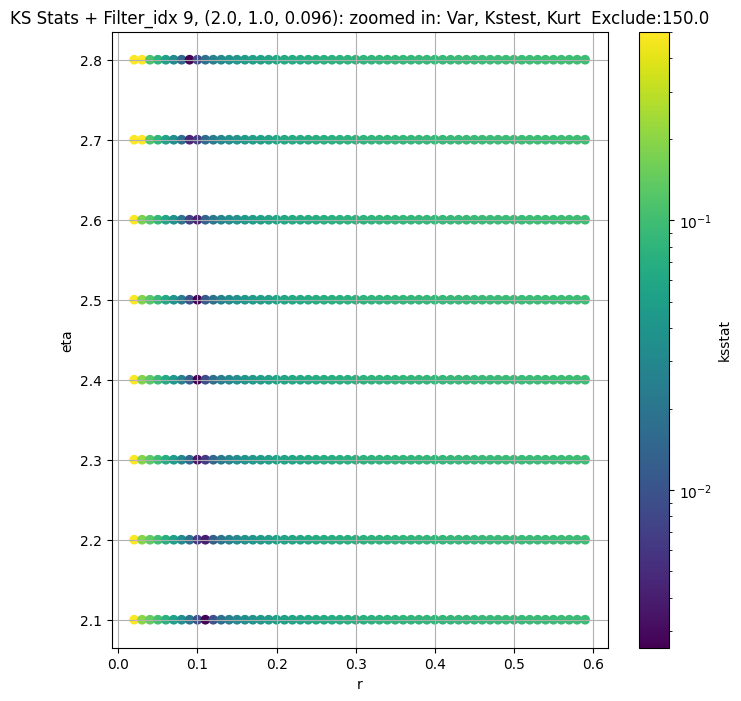

Filter_idx 10, (2.0, 1.0, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + 100 = 300, ksstat: 0.00521675001469768, var: 6.805999755859375


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + 75 = 275, ksstat: 0.004743917682860331, var: 6.980960845947266


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + 50 = 250, ksstat: 0.004256817430199233, var: 7.178126811981201


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + 25 = 225, ksstat: 0.003772878521288818, var: 7.403297424316406


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + 0 = 200, ksstat: 0.0033720104890202496, var: 7.664665699005127


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + -25 = 175, ksstat: 0.0033526758184674876, var: 7.974017143249512


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + -50 = 150, ksstat: 0.004313969766716025, var: 8.34823226928711


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + -75 = 125, ksstat: 0.004756731426585392, var: 8.814190864562988


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + -100 = 100, ksstat: 0.006057035431294655, var: 9.417661666870117
Number of samples: 100000, Without approximation : 262144000.0


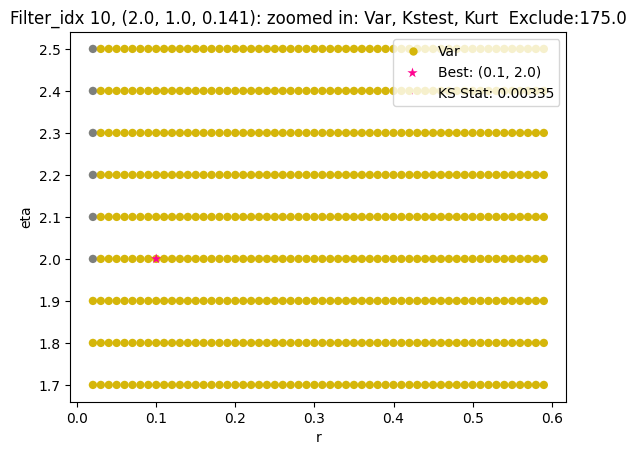

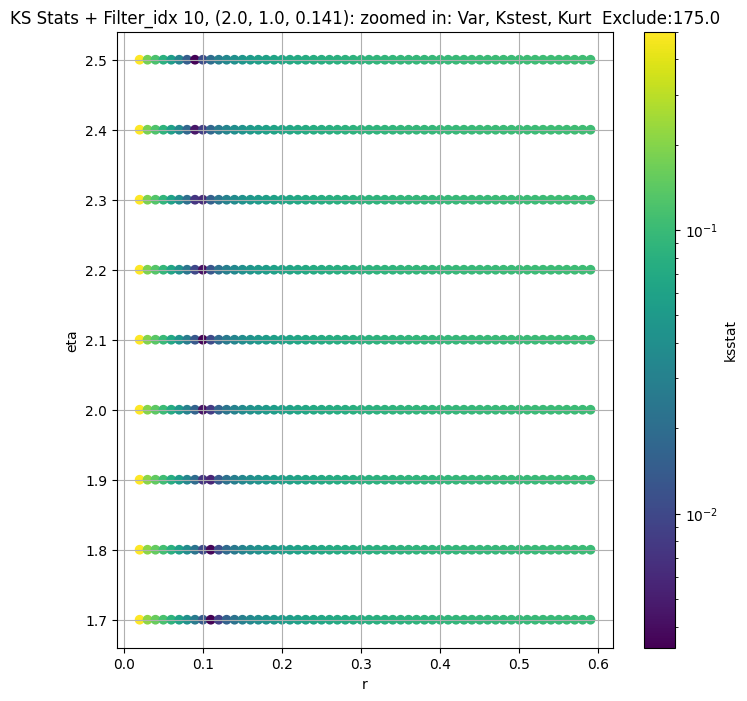

Filter_idx 11, (2.0, 1.0, 0.208):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + 100 = 300, ksstat: 0.00556085166981083, var: 2.5454111099243164


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + 75 = 275, ksstat: 0.005137548418566201, var: 2.598949432373047


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + 50 = 250, ksstat: 0.004706568326955929, var: 2.6571154594421387


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + 25 = 225, ksstat: 0.0043104066466696355, var: 2.7208831310272217


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + 0 = 200, ksstat: 0.003857382930305575, var: 2.791550636291504


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + -25 = 175, ksstat: 0.0034417297489650507, var: 2.8709683418273926


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + -50 = 150, ksstat: 0.004045210010494127, var: 2.9618935585021973


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + -75 = 125, ksstat: 0.004650593050562812, var: 3.068699359893799


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + -100 = 100, ksstat: 0.005064660498748194, var: 3.198791027069092
Number of samples: 100000, Without approximation : 262144000.0


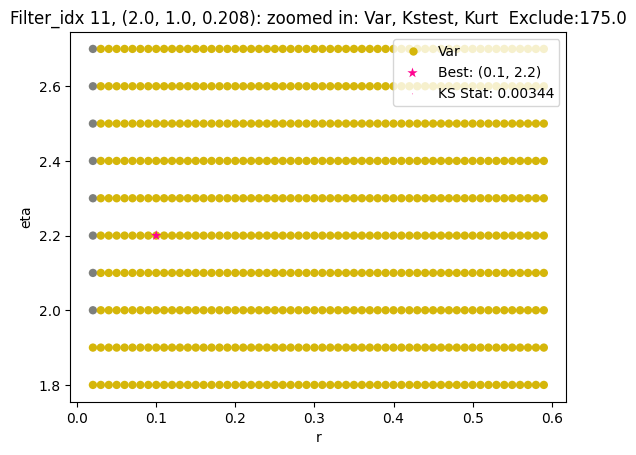

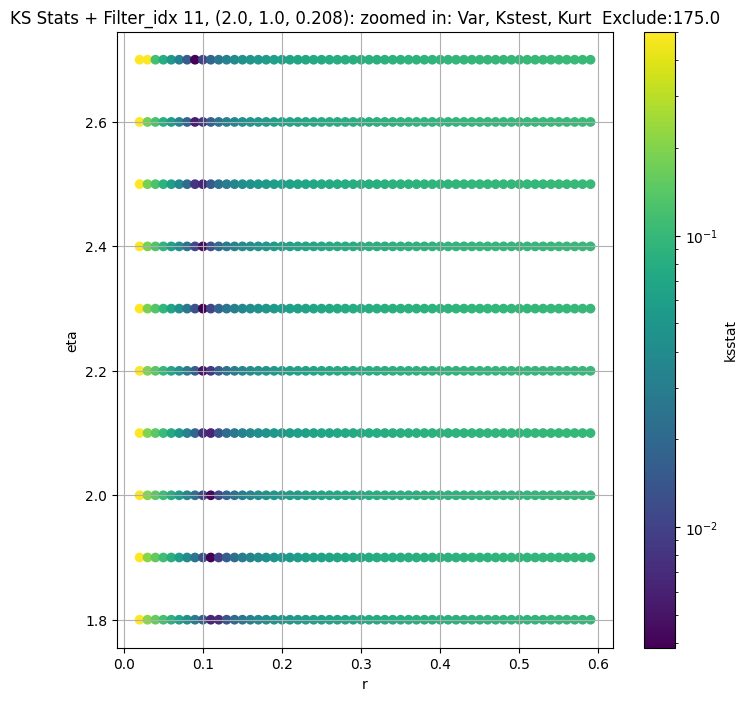

Filter_idx 12, (2.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 100 = 300, ksstat: 0.006459251848827452, var: 0.8509492874145508


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 75 = 275, ksstat: 0.005946292907937911, var: 0.8718223571777344


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 50 = 250, ksstat: 0.005377895455248416, var: 0.8953279852867126


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 25 = 225, ksstat: 0.004919780805927143, var: 0.9223101735115051


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 0 = 200, ksstat: 0.004243985610033411, var: 0.9540190696716309


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + -25 = 175, ksstat: 0.004647490428774659, var: 0.9923250079154968


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + -50 = 150, ksstat: 0.005883605459290814, var: 1.039936900138855


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + -75 = 125, ksstat: 0.005802114077151144, var: 1.1011512279510498


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + -100 = 100, ksstat: 0.00722066271785296, var: 1.1832300424575806
Number of samples: 100000, Without approximation : 262144000.0


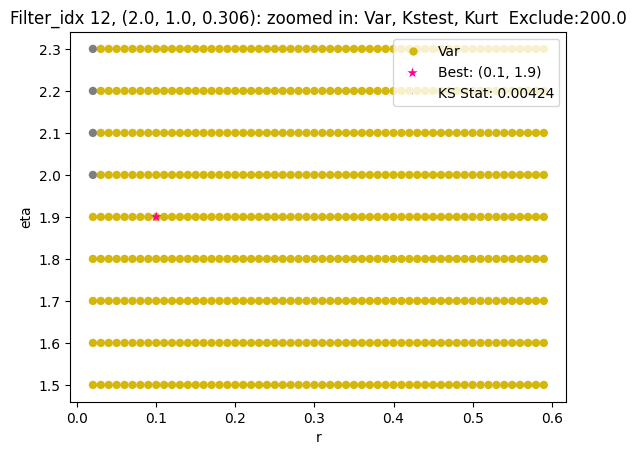

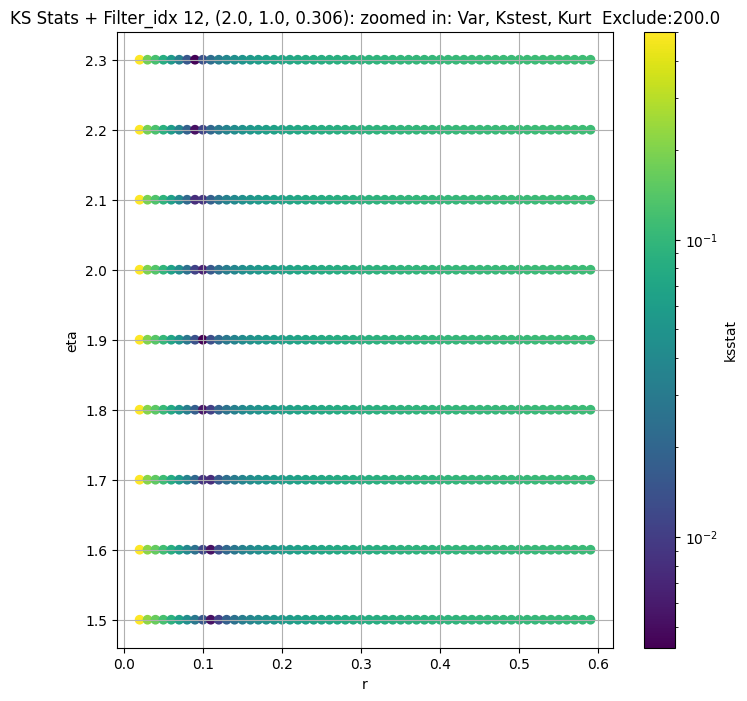

Filter_idx 13, (2.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 100 = 300, ksstat: 0.006279065501545375, var: 0.18316695094108582


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 75 = 275, ksstat: 0.005824179988557443, var: 0.1870265156030655


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 50 = 250, ksstat: 0.005353696911223449, var: 0.19126279652118683


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 25 = 225, ksstat: 0.0048381708345077955, var: 0.19596785306930542


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 0 = 200, ksstat: 0.004410652707134477, var: 0.20126992464065552


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -25 = 175, ksstat: 0.004010892908102803, var: 0.20736350119113922


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -50 = 150, ksstat: 0.004704153289263213, var: 0.21455587446689606


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -75 = 125, ksstat: 0.005028604040321627, var: 0.22338099777698517


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -100 = 100, ksstat: 0.005819699630709052, var: 0.23489825427532196
Number of samples: 100000, Without approximation : 262144000.0


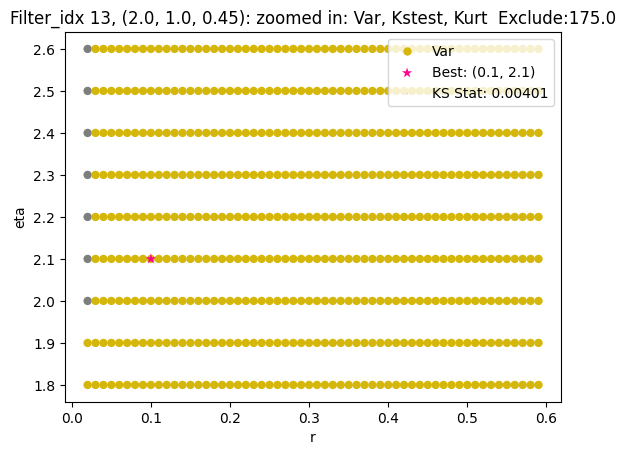

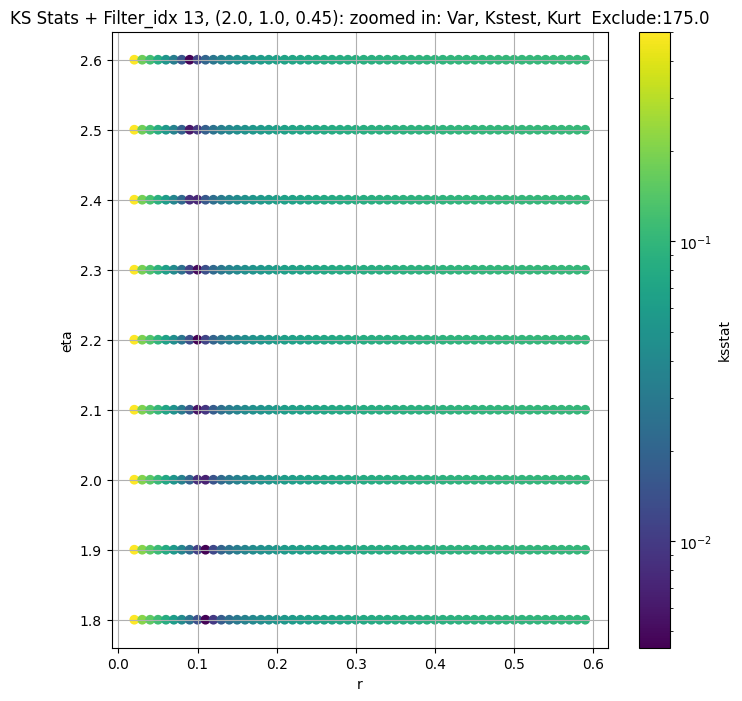

Filter_idx 14, (3.0, 0.5, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 200.0 + 100 = 300, ksstat: 0.0038784545628851967, var: 26.835697174072266


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 200.0 + 75 = 275, ksstat: 0.003493023656727434, var: 27.49782371520996


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 200.0 + 50 = 250, ksstat: 0.0031615478548686097, var: 28.243227005004883


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 200.0 + 25 = 225, ksstat: 0.0028950536889604805, var: 29.092601776123047


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 200.0 + 0 = 200, ksstat: 0.0026648305104520764, var: 30.072851181030273


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 200.0 + -25 = 175, ksstat: 0.0024043054957382237, var: 31.225595474243164


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 200.0 + -50 = 150, ksstat: 0.0023163794836436047, var: 32.61496353149414


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 200.0 + -75 = 125, ksstat: 0.0033274088402432955, var: 34.34175109863281


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 200.0 + -100 = 100, ksstat: 0.004680281608314574, var: 36.560096740722656
Number of samples: 100000, Without approximation : 262144000.0


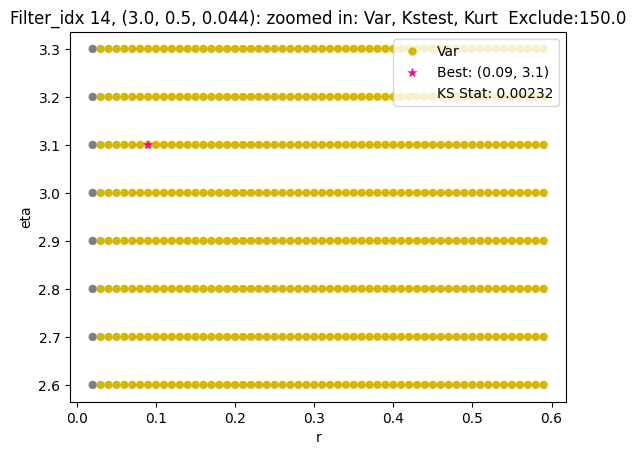

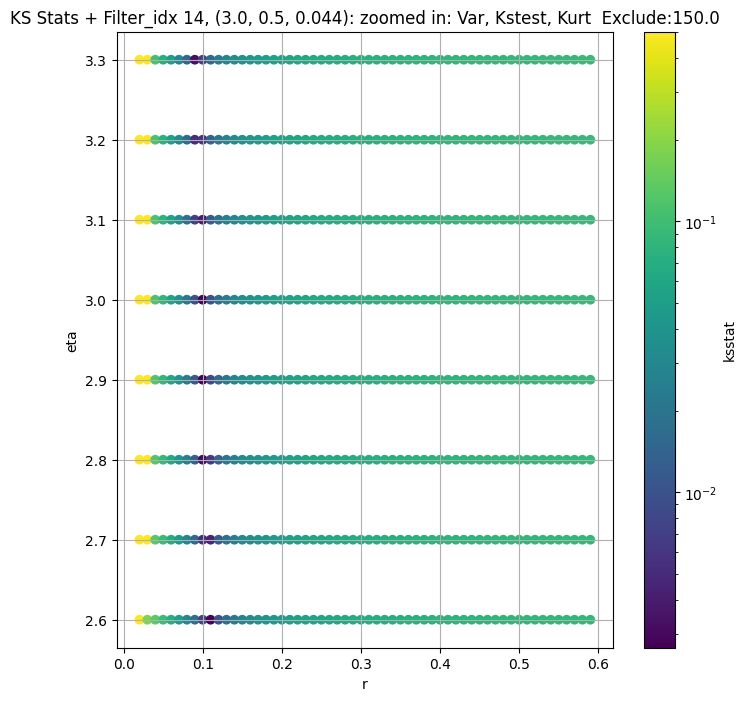

Filter_idx 15, (3.0, 0.5, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 100 = 200, ksstat: 0.003172377567502993, var: 14.25278091430664


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 75 = 175, ksstat: 0.0024975597763264856, var: 14.673563957214355


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 50 = 150, ksstat: 0.0019673691958738693, var: 15.177823066711426


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 25 = 125, ksstat: 0.0017178200634682874, var: 15.79883098602295


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 0 = 100, ksstat: 0.0019796075891896914, var: 16.593650817871094


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + -25 = 75, ksstat: 0.003552577204556928, var: 17.66899299621582


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + -50 = 50, ksstat: 0.005660112578672438, var: 19.240528106689453


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + -75 = 25, ksstat: 0.009035770945945938, var: 21.89068603515625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + -100 = 0, ksstat: 0.019634749024733382, var: 37.087398529052734
Number of samples: 100000, Without approximation : 262144000.0


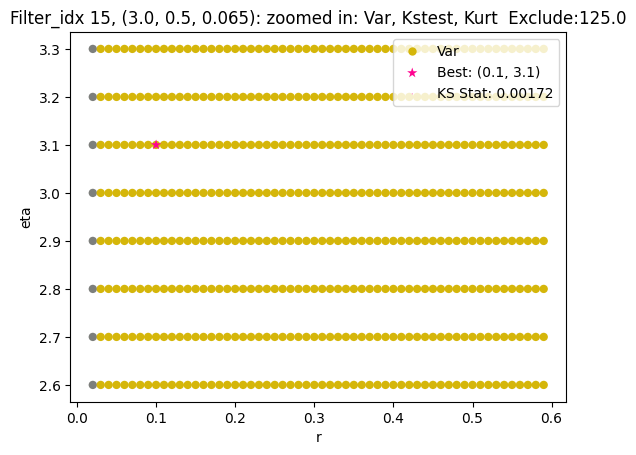

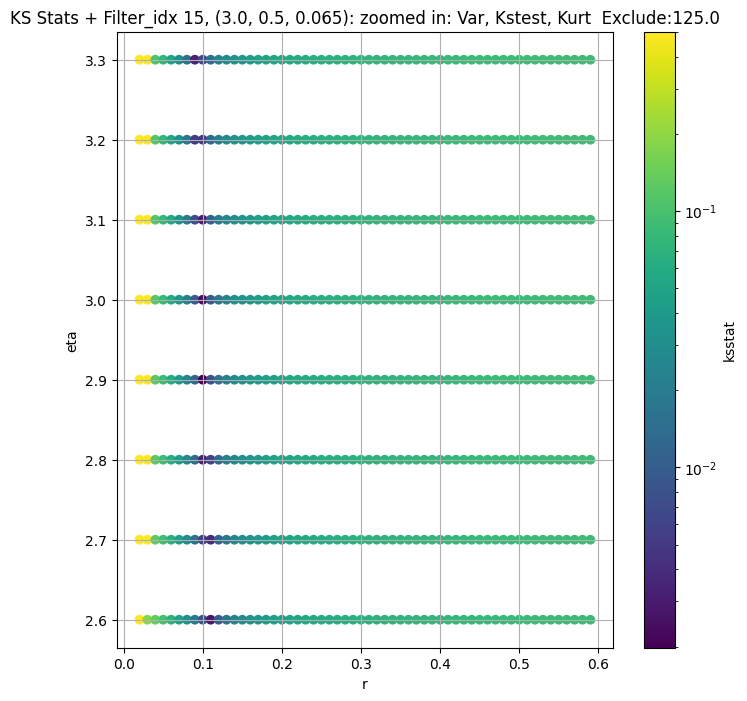

Filter_idx 16, (3.0, 0.5, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + 100 = 150, ksstat: 0.00428218243330547, var: 11.451645851135254


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + 75 = 125, ksstat: 0.0037033486813119465, var: 11.761035919189453


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + 50 = 100, ksstat: 0.002996579447159274, var: 12.132593154907227


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + 25 = 75, ksstat: 0.0021270767766452536, var: 12.609414100646973


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + 0 = 50, ksstat: 0.0019884491677086835, var: 13.304388046264648


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + -25 = 25, ksstat: 0.004247646157579277, var: 14.689994812011719


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + -50 = 0, ksstat: 0.013244096478735173, var: 23.759700775146484
Number of samples: 100000, Without approximation : 262144000.0


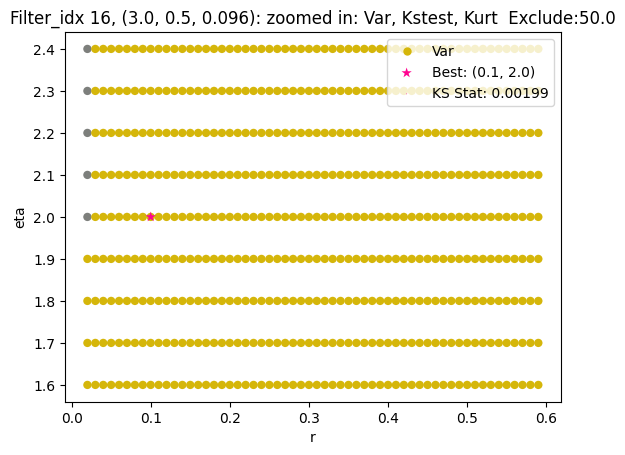

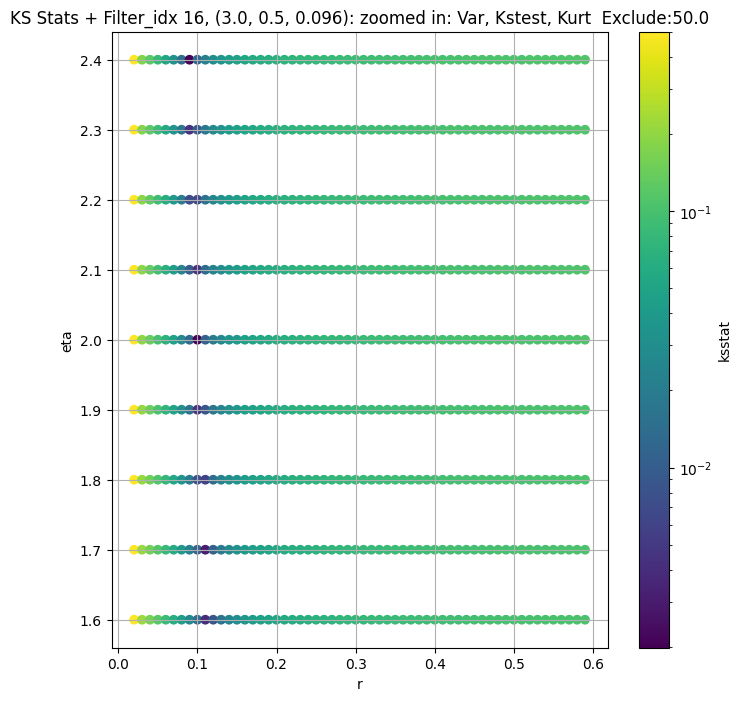

Filter_idx 17, (3.0, 0.5, 0.141):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 200.0 + 100 = 300, ksstat: 0.005789131133502786, var: 5.826193332672119


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 200.0 + 75 = 275, ksstat: 0.00541232899091626, var: 5.958061695098877


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 200.0 + 50 = 250, ksstat: 0.005023252362698398, var: 6.103140830993652


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 200.0 + 25 = 225, ksstat: 0.004663007599854364, var: 6.265095233917236


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 200.0 + 0 = 200, ksstat: 0.004230447082371969, var: 6.449875354766846


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 200.0 + -25 = 175, ksstat: 0.0037601661314972546, var: 6.667004108428955


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 200.0 + -50 = 150, ksstat: 0.003363443917800968, var: 6.933587074279785


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 200.0 + -75 = 125, ksstat: 0.0036967186339668667, var: 7.279364585876465


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 200.0 + -100 = 100, ksstat: 0.004587391587922873, var: 7.760252475738525
Number of samples: 100000, Without approximation : 262144000.0


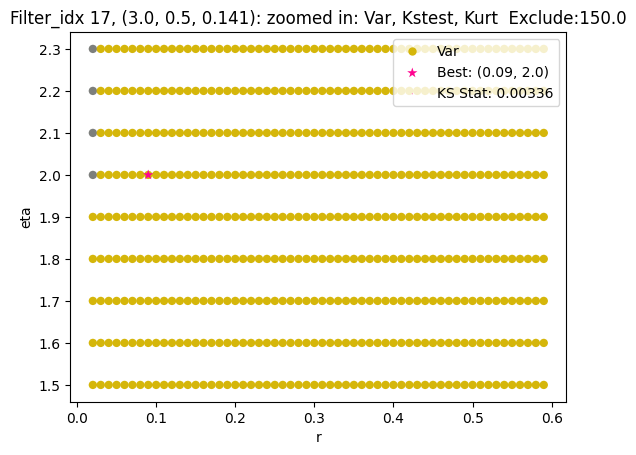

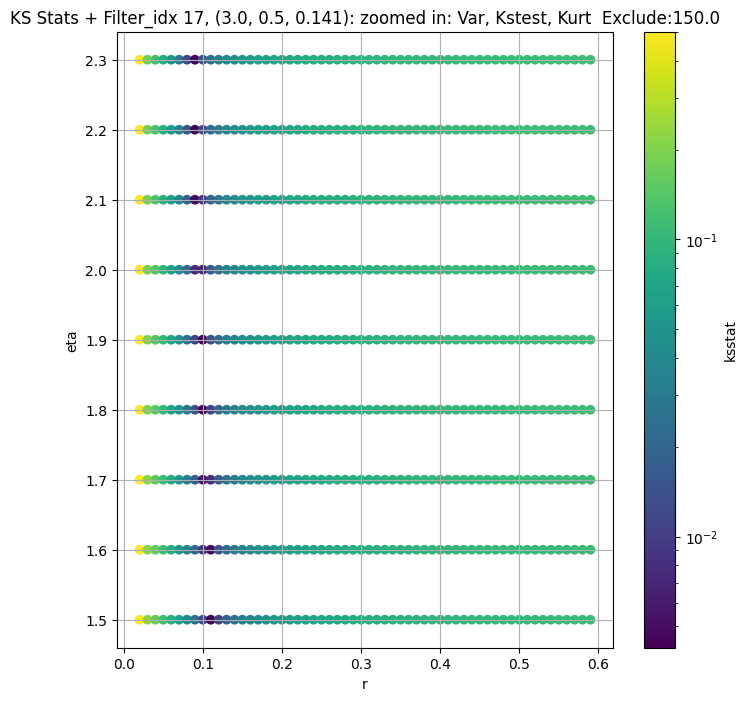

Filter_idx 18, (3.0, 0.5, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 100 = 300, ksstat: 0.007331937683515921, var: 1.846608281135559


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 75 = 275, ksstat: 0.006959243609266252, var: 1.8876043558120728


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 50 = 250, ksstat: 0.006399648023378685, var: 1.9323385953903198


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 25 = 225, ksstat: 0.006014495474518353, var: 1.9816550016403198


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 0 = 200, ksstat: 0.005543497601908087, var: 2.0367510318756104


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -25 = 175, ksstat: 0.005200752925217378, var: 2.099353313446045


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -50 = 150, ksstat: 0.005219312645007523, var: 2.172187566757202


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -75 = 125, ksstat: 0.006309040072594918, var: 2.259702444076538


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -100 = 100, ksstat: 0.006966585342652487, var: 2.3697848320007324
Number of samples: 100000, Without approximation : 262144000.0


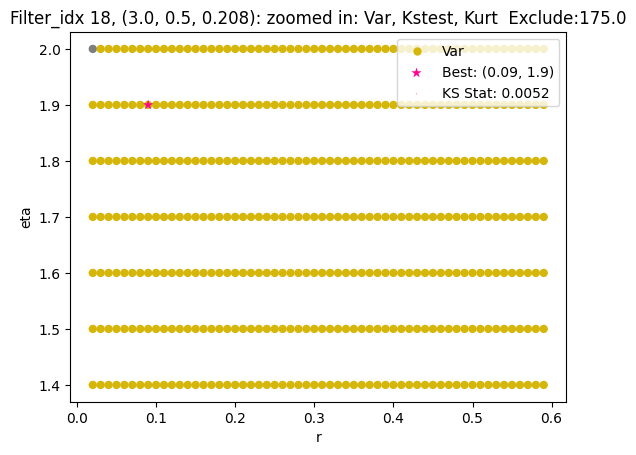

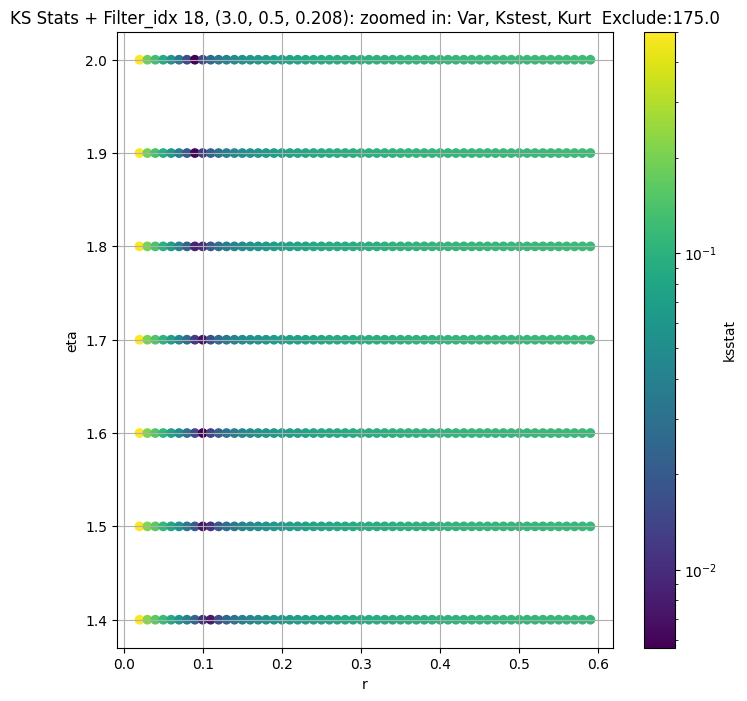

Filter_idx 19, (3.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 100 = 300, ksstat: 0.0075748443798534515, var: 0.32461416721343994


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 75 = 275, ksstat: 0.007232234606871231, var: 0.33146631717681885


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 50 = 250, ksstat: 0.006658802306418285, var: 0.33889883756637573


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 25 = 225, ksstat: 0.006304865070737686, var: 0.3470386564731598


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 0 = 200, ksstat: 0.0058707532133331665, var: 0.35606083273887634


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -25 = 175, ksstat: 0.0055837486761883826, var: 0.3662160634994507


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -50 = 150, ksstat: 0.005617505339221507, var: 0.3779323101043701


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -75 = 125, ksstat: 0.006405418033276211, var: 0.39189833402633667


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -100 = 100, ksstat: 0.00690130166762537, var: 0.4094623923301697
Number of samples: 100000, Without approximation : 262144000.0


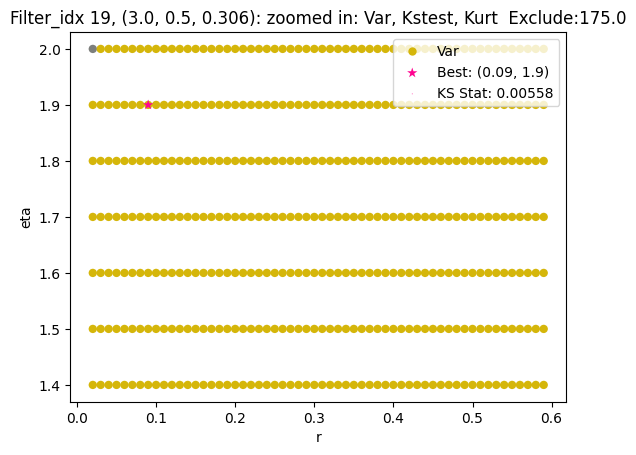

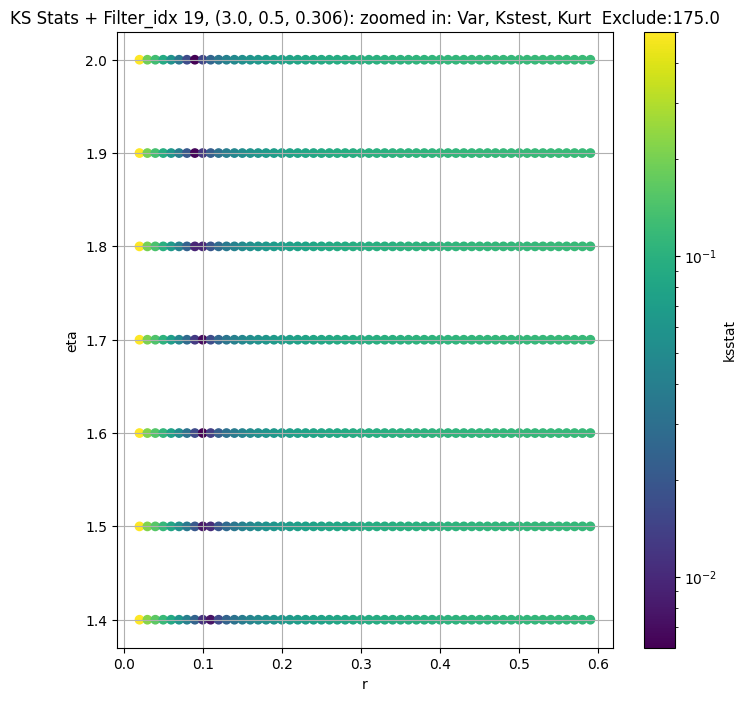

Filter_idx 20, (3.0, 0.5, 0.45):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 200.0 + 100 = 300, ksstat: 0.01036547720190717, var: 0.09629414975643158


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 200.0 + 75 = 275, ksstat: 0.009857825540710102, var: 0.10022391378879547


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 200.0 + 50 = 250, ksstat: 0.010370244602710299, var: 0.10470650345087051


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 200.0 + 25 = 225, ksstat: 0.01189537168048485, var: 0.10987792909145355


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 200.0 + 0 = 200, ksstat: 0.013353254128430136, var: 0.11591710895299911


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 200.0 + -25 = 175, ksstat: 0.012551870164845769, var: 0.12306961417198181


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 200.0 + -50 = 150, ksstat: 0.013452667135957608, var: 0.13167373836040497


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 200.0 + -75 = 125, ksstat: 0.014493497594174176, var: 0.14219649136066437


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 200.0 + -100 = 100, ksstat: 0.016528114759771784, var: 0.1553214192390442
Number of samples: 100000, Without approximation : 262144000.0


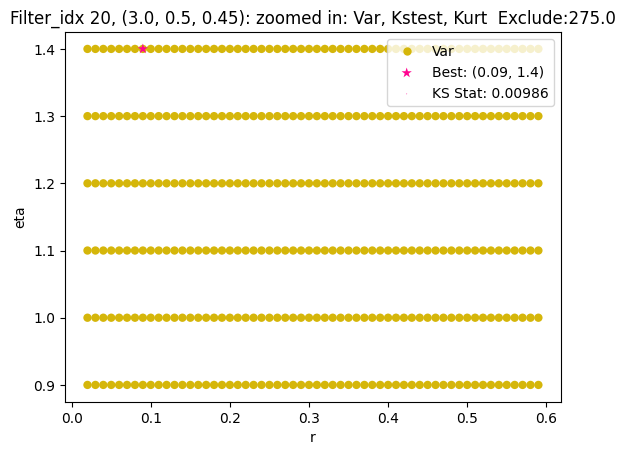

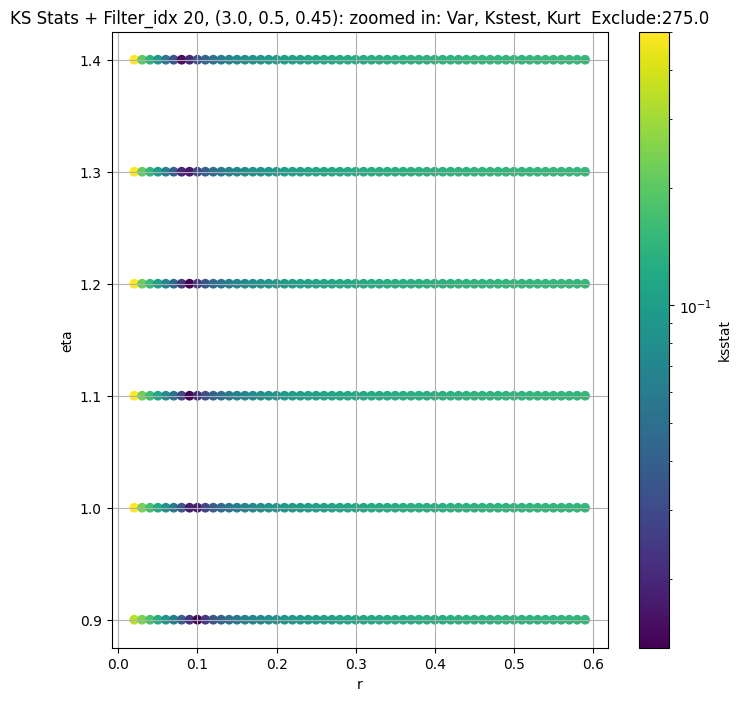

Filter_idx 21, (3.0, 1.0, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 100 = 300, ksstat: 0.0045317085535280695, var: 27.87433433532715


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 75 = 275, ksstat: 0.004098079555896094, var: 28.437538146972656


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 50 = 250, ksstat: 0.003686083589673388, var: 29.05560302734375


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 25 = 225, ksstat: 0.003298233488156055, var: 29.7408447265625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 0 = 200, ksstat: 0.0029371655151303466, var: 30.51030158996582


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + -25 = 175, ksstat: 0.002603308355993872, var: 31.389907836914062


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + -50 = 150, ksstat: 0.002303386015970488, var: 32.420555114746094


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + -75 = 125, ksstat: 0.0019692744112241867, var: 33.66449737548828


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + -100 = 100, ksstat: 0.0023443055064472085, var: 35.233848571777344
Number of samples: 100000, Without approximation : 262144000.0


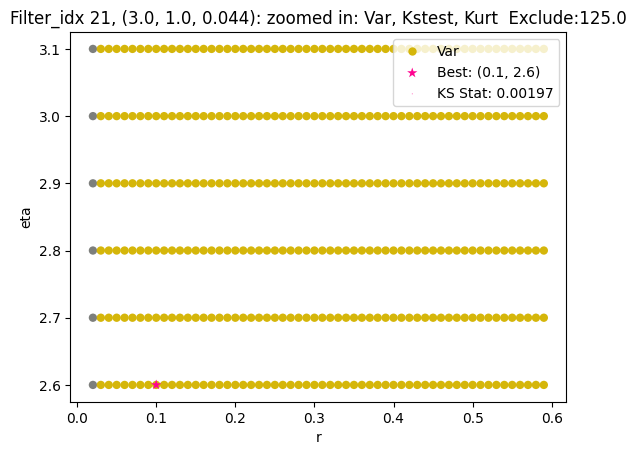

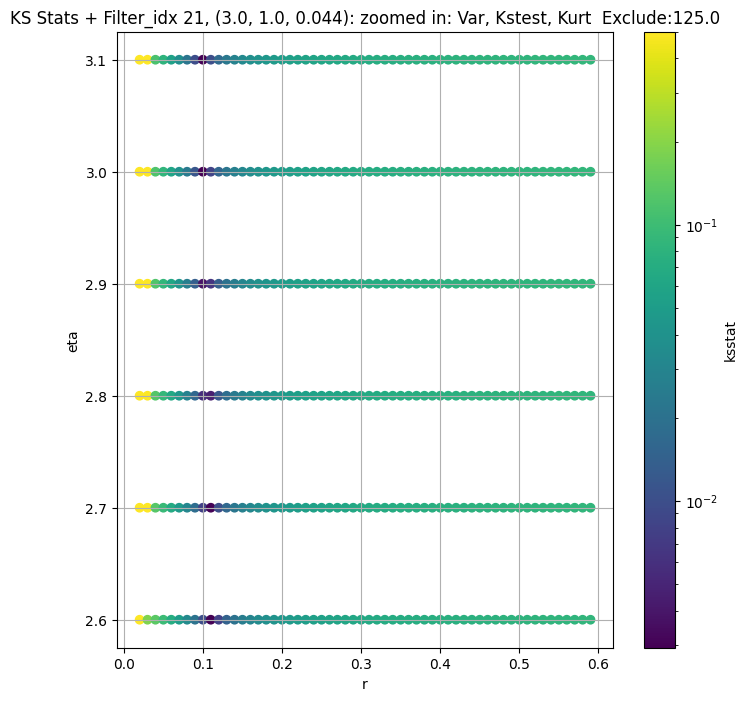

Filter_idx 22, (3.0, 1.0, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + 100 = 300, ksstat: 0.004442432921483164, var: 16.12736701965332


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + 75 = 275, ksstat: 0.0036372554851297895, var: 16.556129455566406


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + 50 = 250, ksstat: 0.0030107758199479084, var: 17.047622680664062


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + 25 = 225, ksstat: 0.002737085867292821, var: 17.6187801361084


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + 0 = 200, ksstat: 0.002495622867062397, var: 18.29422378540039


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + -25 = 175, ksstat: 0.0023149410066776177, var: 19.108638763427734


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + -50 = 150, ksstat: 0.0021091865653171116, var: 20.113168716430664


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + -75 = 125, ksstat: 0.0035764255696421263, var: 21.387075424194336


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + -100 = 100, ksstat: 0.004938199826058705, var: 23.060924530029297
Number of samples: 100000, Without approximation : 262144000.0


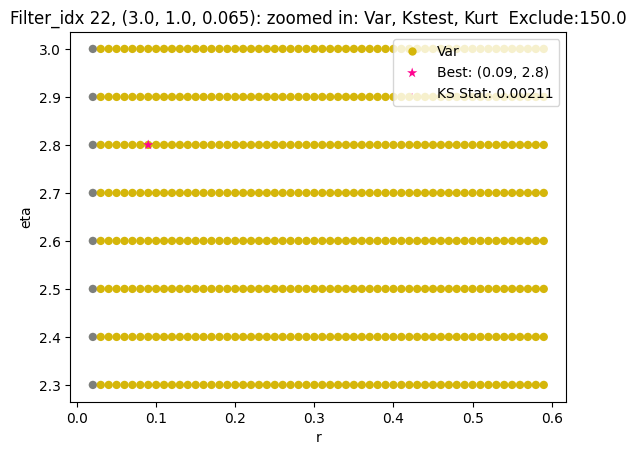

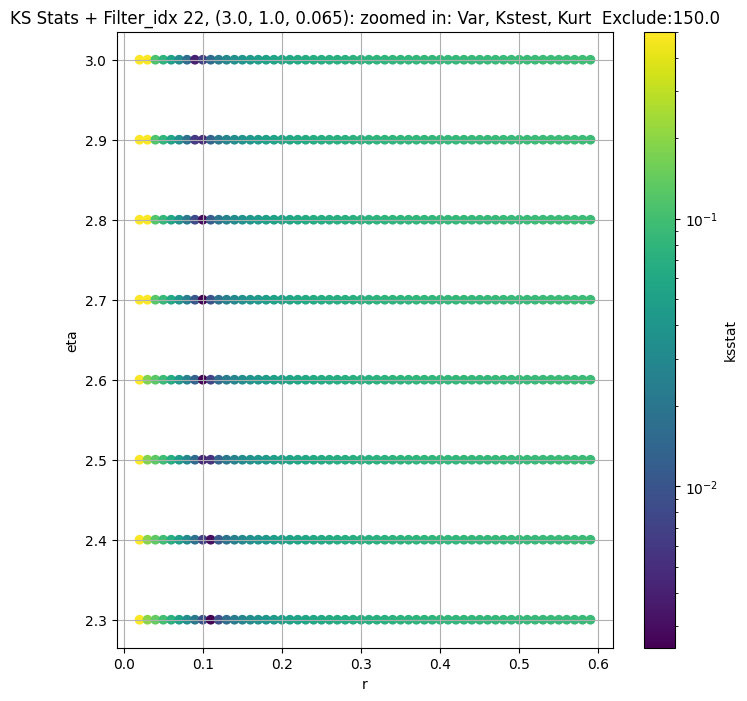

Filter_idx 23, (3.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 200.0 + 100 = 300, ksstat: 0.005408382085531516, var: 11.481130599975586


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 200.0 + 75 = 275, ksstat: 0.004942986369347313, var: 11.734277725219727


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 200.0 + 50 = 250, ksstat: 0.004552878724344955, var: 12.011555671691895


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 200.0 + 25 = 225, ksstat: 0.003978611181303979, var: 12.318337440490723


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 200.0 + 0 = 200, ksstat: 0.0034990691530681663, var: 12.66224193572998


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 200.0 + -25 = 175, ksstat: 0.0030668592400177053, var: 13.054229736328125


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 200.0 + -50 = 150, ksstat: 0.0026627608833115126, var: 13.511176109313965


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 200.0 + -75 = 125, ksstat: 0.0024857366049272356, var: 14.060907363891602


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 200.0 + -100 = 100, ksstat: 0.0037048900750898672, var: 14.747557640075684
Number of samples: 100000, Without approximation : 262144000.0


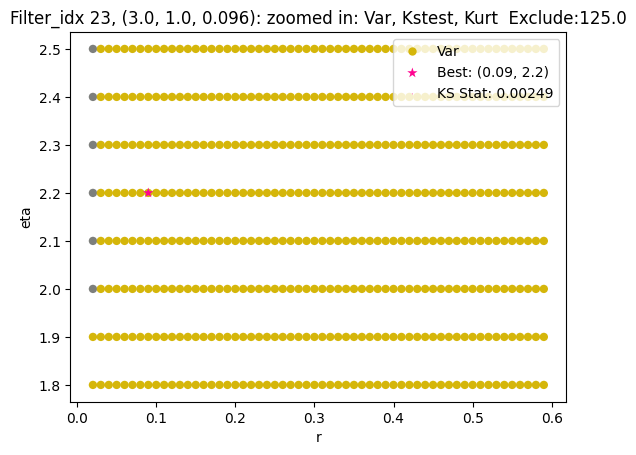

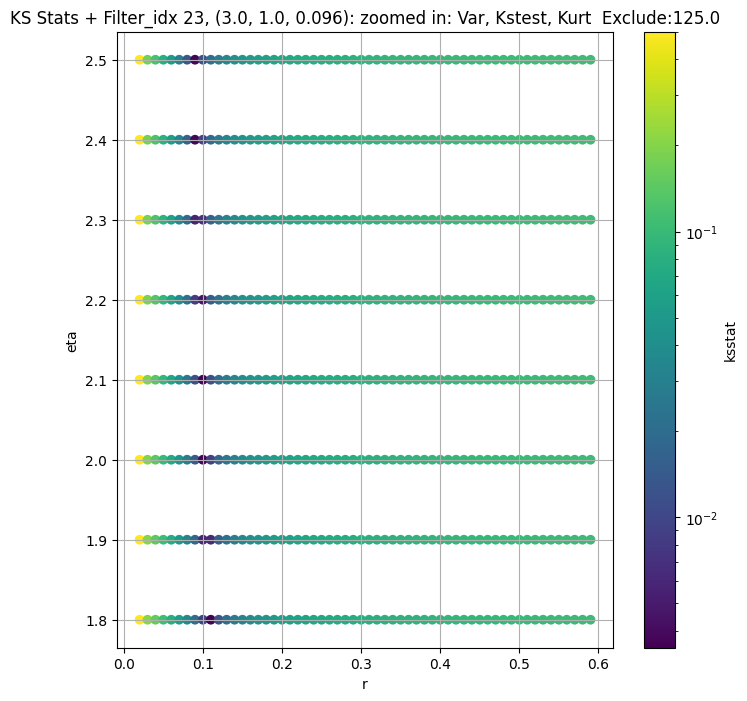

Filter_idx 24, (3.0, 1.0, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 50.0 + 100 = 150, ksstat: 0.004207249376396584, var: 5.7650275230407715


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 50.0 + 75 = 125, ksstat: 0.0036860268946471327, var: 5.903664588928223


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 50.0 + 50 = 100, ksstat: 0.0032277166038600577, var: 6.060697555541992


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 50.0 + 25 = 75, ksstat: 0.0025547650054519623, var: 6.245100975036621


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 50.0 + 0 = 50, ksstat: 0.002054161955693079, var: 6.478614807128906


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 50.0 + -25 = 25, ksstat: 0.0025103366073208067, var: 6.838850498199463


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 50.0 + -50 = 0, ksstat: 0.008084713818665268, var: 9.180669784545898
Number of samples: 100000, Without approximation : 262144000.0


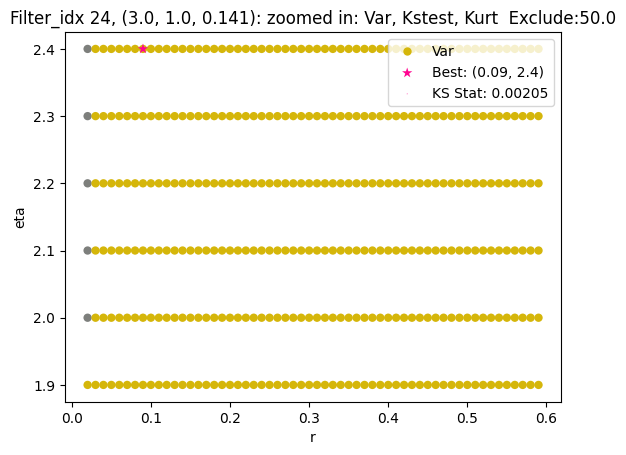

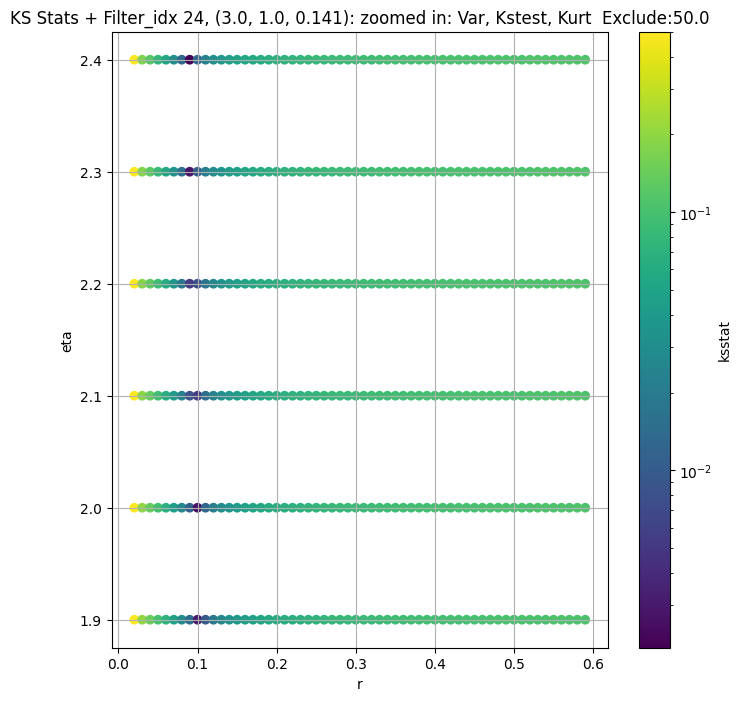

Filter_idx 25, (3.0, 1.0, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + 100 = 300, ksstat: 0.005465912148475027, var: 2.657184362411499


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + 75 = 275, ksstat: 0.005746437695816925, var: 2.7624614238739014


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + 50 = 250, ksstat: 0.006769347466391684, var: 2.8845038414001465


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + 25 = 225, ksstat: 0.007866016708633183, var: 3.0281102657318115


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + 0 = 200, ksstat: 0.008866248430358104, var: 3.1999106407165527


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + -25 = 175, ksstat: 0.009725450805270486, var: 3.4087560176849365


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + -50 = 150, ksstat: 0.01073893763618848, var: 3.6668834686279297


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + -75 = 125, ksstat: 0.012065988562822039, var: 3.991738796234131


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + -100 = 100, ksstat: 0.01399777423147397, var: 4.408851146697998
Number of samples: 100000, Without approximation : 262144000.0


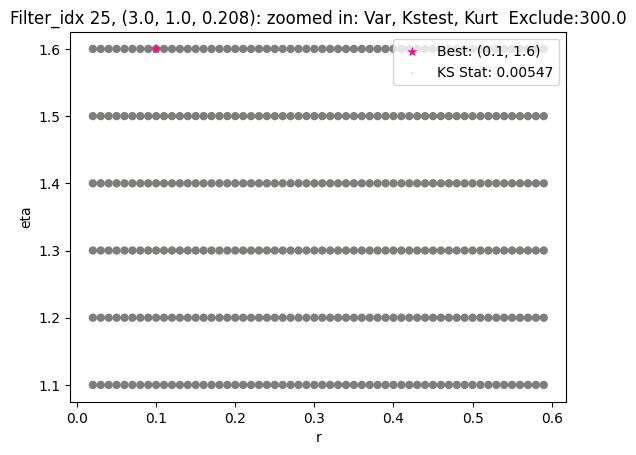

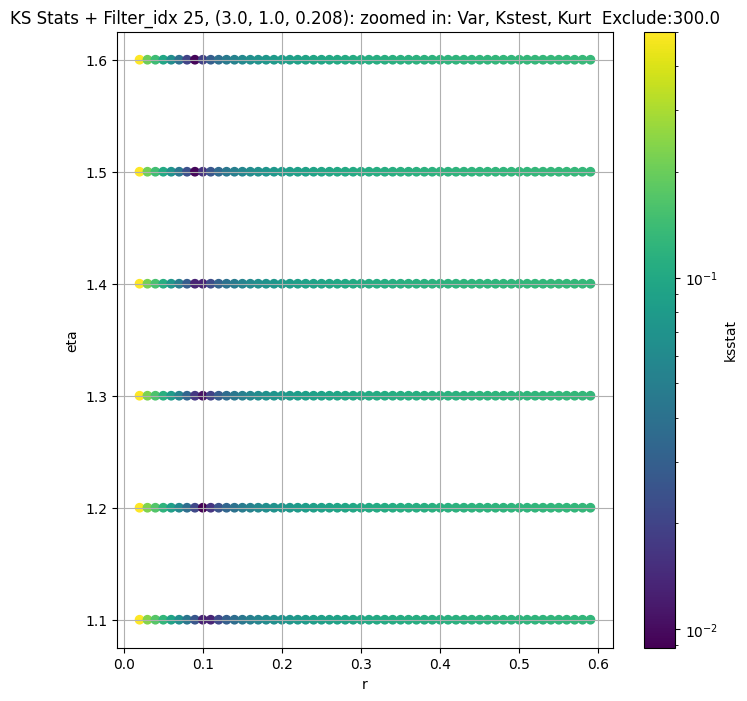

Filter_idx 26, (3.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 100 = 300, ksstat: 0.005996274844528693, var: 0.4735795259475708


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 75 = 275, ksstat: 0.005619609768548917, var: 0.48615971207618713


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 50 = 250, ksstat: 0.005983257268049269, var: 0.500144898891449


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 25 = 225, ksstat: 0.006079804424744761, var: 0.5159184336662292


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 0 = 200, ksstat: 0.006205010893299057, var: 0.5340454578399658


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + -25 = 175, ksstat: 0.007220033052083741, var: 0.555368185043335


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + -50 = 150, ksstat: 0.008029839835613978, var: 0.5811992883682251


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + -75 = 125, ksstat: 0.009316317054802625, var: 0.6136309504508972


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + -100 = 100, ksstat: 0.009691088579585616, var: 0.6561952829360962
Number of samples: 100000, Without approximation : 262144000.0


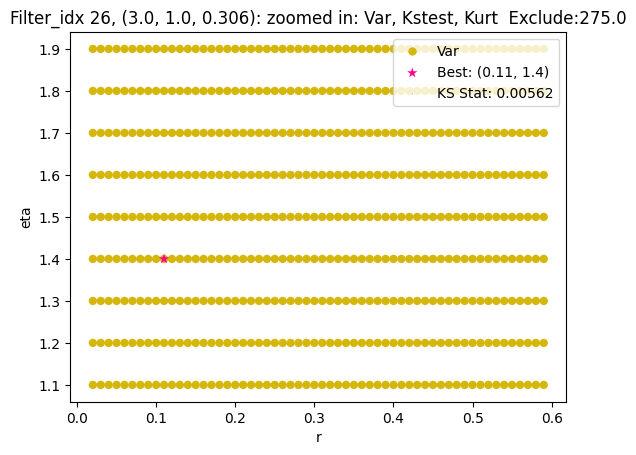

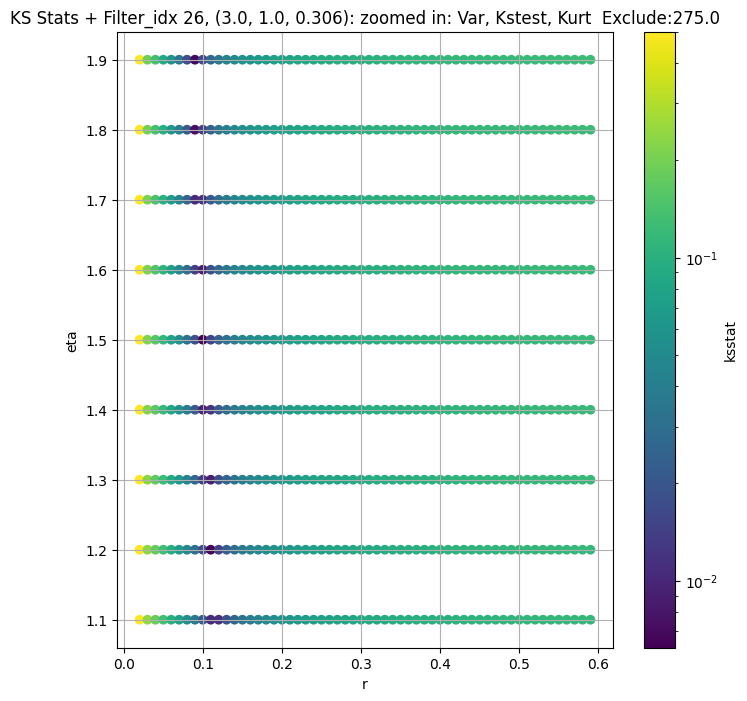

Filter_idx 27, (3.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 100 = 300, ksstat: 0.006726557430154045, var: 0.10033366829156876


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 75 = 275, ksstat: 0.008387714453026551, var: 0.10359586775302887


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 50 = 250, ksstat: 0.00823059720534769, var: 0.10724586993455887


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 25 = 225, ksstat: 0.008656577286839773, var: 0.1113724634051323


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 0 = 200, ksstat: 0.009577490571898162, var: 0.11610005795955658


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + -25 = 175, ksstat: 0.009698546572651456, var: 0.12159910053014755


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + -50 = 150, ksstat: 0.0100981844100142, var: 0.12813304364681244


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + -75 = 125, ksstat: 0.01088669590053648, var: 0.13612286746501923


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + -100 = 100, ksstat: 0.012257153888771133, var: 0.14628151059150696
Number of samples: 100000, Without approximation : 262144000.0


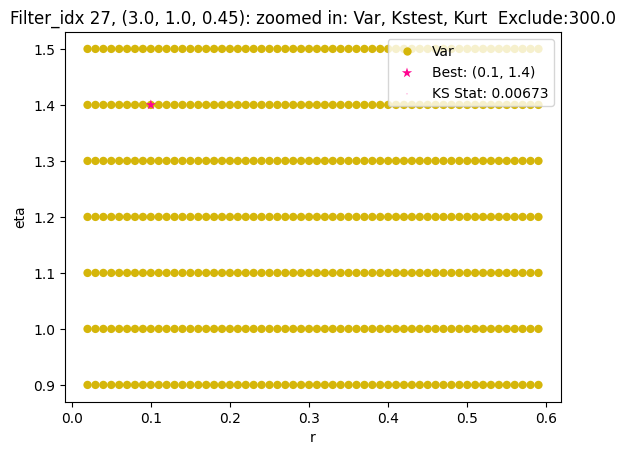

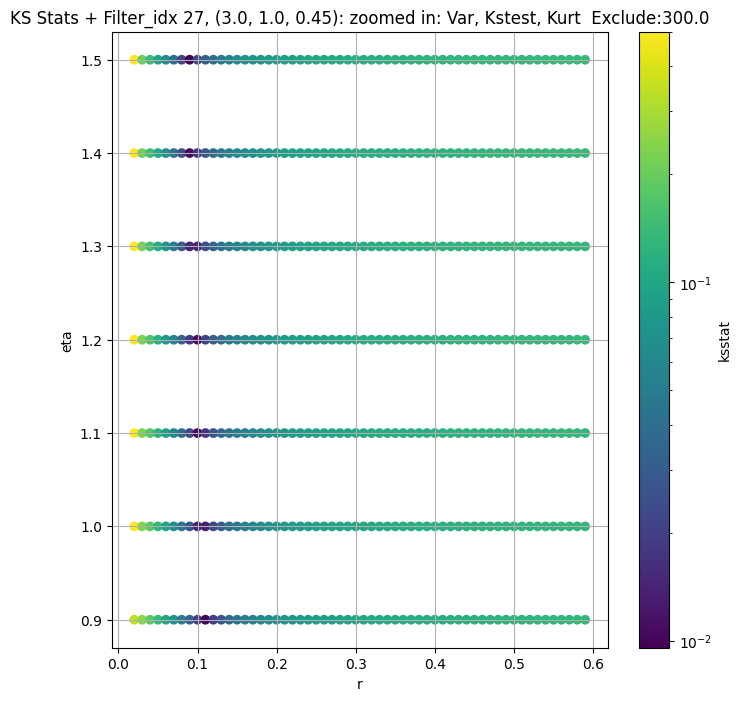

Filter_idx 28, (4.0, 0.5, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 100 = 200, ksstat: 0.003127800462175645, var: 26.78565216064453


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 75 = 175, ksstat: 0.002630266483777014, var: 27.473934173583984


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 50 = 150, ksstat: 0.00224714154632788, var: 28.26667594909668


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 25 = 125, ksstat: 0.0018918142728509002, var: 29.203105926513672


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 0 = 100, ksstat: 0.001552707059923053, var: 30.34676170349121


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -25 = 75, ksstat: 0.0017159644361706833, var: 31.813016891479492


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -50 = 50, ksstat: 0.003532336469179484, var: 33.850589752197266


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -75 = 25, ksstat: 0.0057777773448803305, var: 37.188392639160156


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -100 = 0, ksstat: 0.01404646541008936, var: 55.46469497680664
Number of samples: 100000, Without approximation : 262144000.0


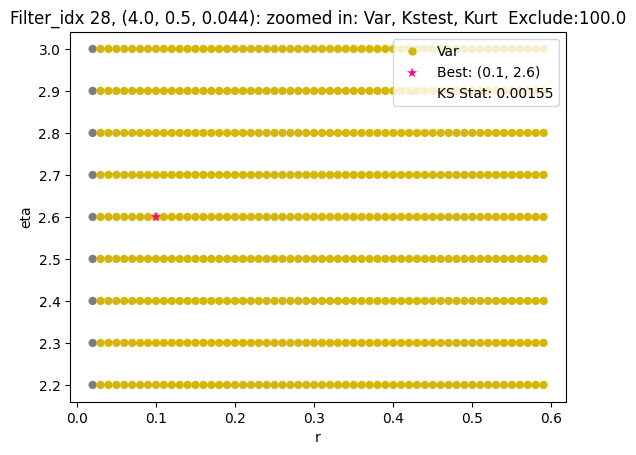

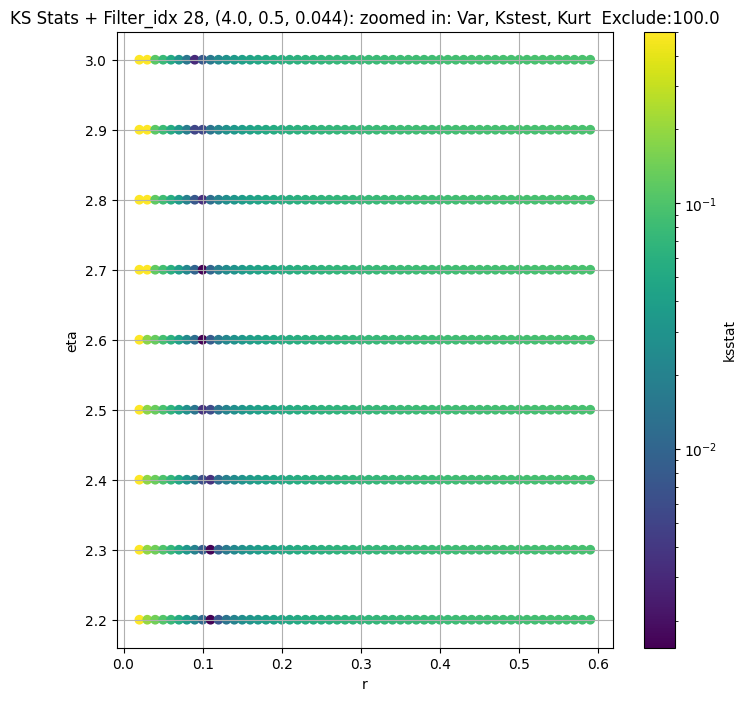

Filter_idx 29, (4.0, 0.5, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 100 = 200, ksstat: 0.0026219535971464536, var: 14.210952758789062


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 75 = 175, ksstat: 0.0023092788692599822, var: 14.654109001159668


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 50 = 150, ksstat: 0.001993673525507722, var: 15.187233924865723


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 25 = 125, ksstat: 0.0017306607796981899, var: 15.85266399383545


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 0 = 100, ksstat: 0.0019274847374372572, var: 16.727025985717773


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -25 = 75, ksstat: 0.003617281113549746, var: 17.960447311401367


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -50 = 50, ksstat: 0.006204991062717109, var: 19.872631072998047


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -75 = 25, ksstat: 0.009487213922898488, var: 23.426504135131836


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -100 = 0, ksstat: 0.021070767594395343, var: 42.596290588378906
Number of samples: 100000, Without approximation : 262144000.0


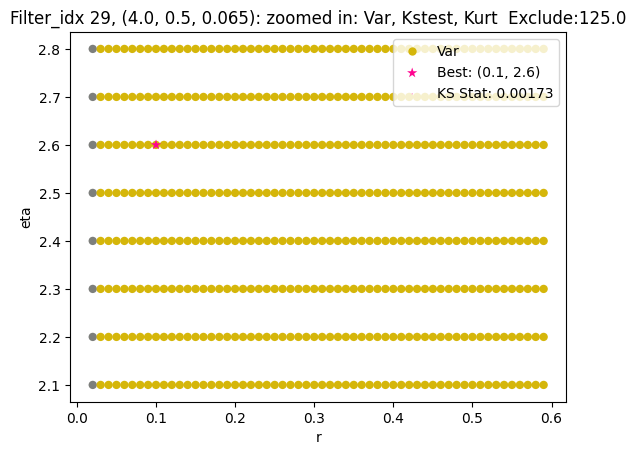

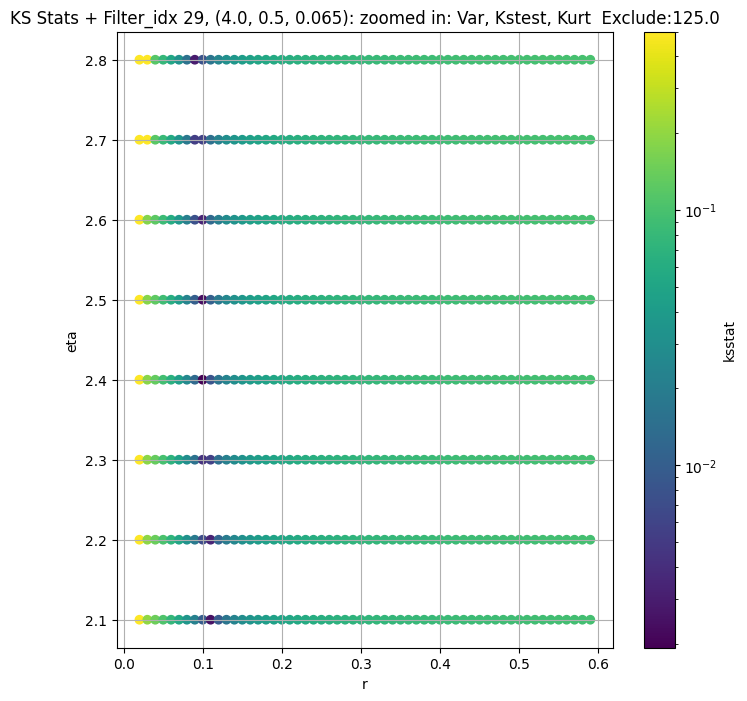

Filter_idx 30, (4.0, 0.5, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 200.0 + 100 = 300, ksstat: 0.005026437472930412, var: 10.414277076721191


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 200.0 + 75 = 275, ksstat: 0.0043425757860394085, var: 10.701530456542969


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 200.0 + 50 = 250, ksstat: 0.0036888184283886127, var: 11.029642105102539


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 200.0 + 25 = 225, ksstat: 0.0029628255458674646, var: 11.409978866577148


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 200.0 + 0 = 200, ksstat: 0.002500826513204917, var: 11.858972549438477


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 200.0 + -25 = 175, ksstat: 0.00283709343471078, var: 12.399632453918457


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 200.0 + -50 = 150, ksstat: 0.002842716586723415, var: 13.063899040222168


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 200.0 + -75 = 125, ksstat: 0.003634571258083086, var: 13.896706581115723


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 200.0 + -100 = 100, ksstat: 0.005229951048662418, var: 14.96999454498291
Number of samples: 100000, Without approximation : 262144000.0


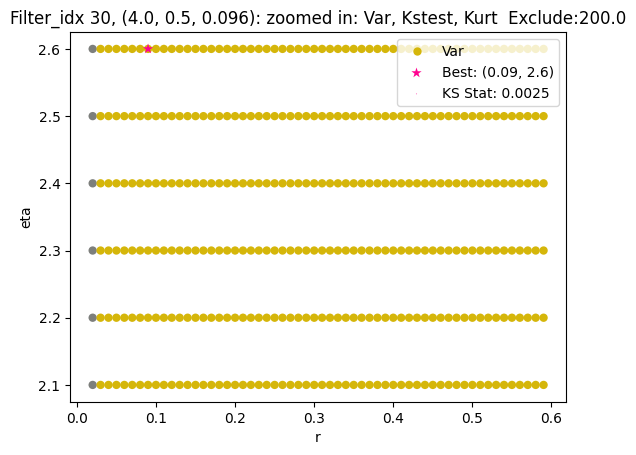

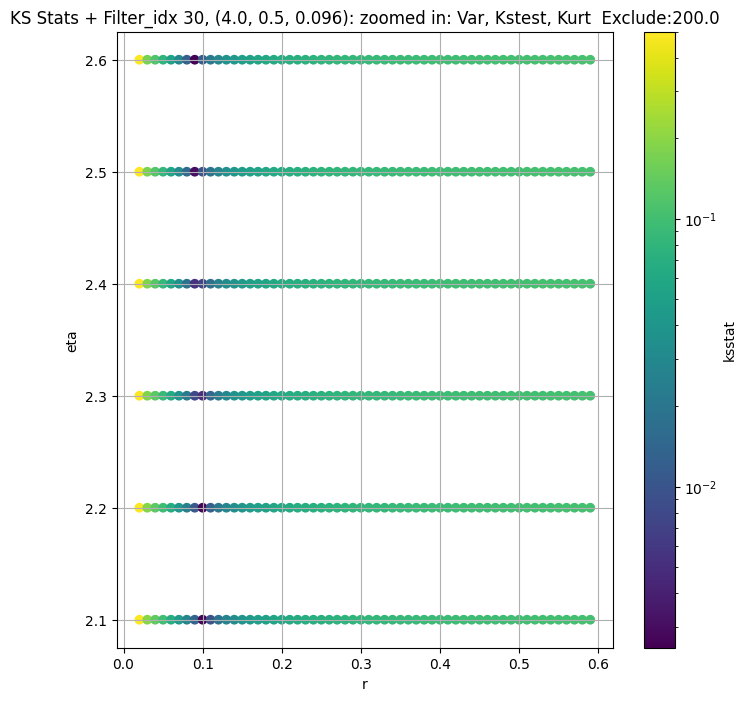

Filter_idx 31, (4.0, 0.5, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 100 = 300, ksstat: 0.0045574100322705036, var: 5.7271623611450195


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 75 = 275, ksstat: 0.004155337122247698, var: 5.917494297027588


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 50 = 250, ksstat: 0.004122629766654284, var: 6.1341352462768555


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 25 = 225, ksstat: 0.004424222347451046, var: 6.383850574493408


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 0 = 200, ksstat: 0.00491822713462009, var: 6.676551342010498


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + -25 = 175, ksstat: 0.00534064712511928, var: 7.027027130126953


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + -50 = 150, ksstat: 0.007182039716516611, var: 7.455132484436035


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + -75 = 125, ksstat: 0.008360925786276951, var: 7.990353584289551


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + -100 = 100, ksstat: 0.01014108434357204, var: 8.690302848815918
Number of samples: 100000, Without approximation : 262144000.0


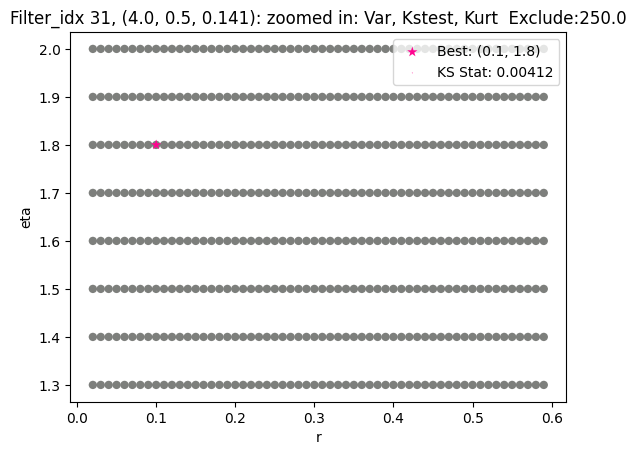

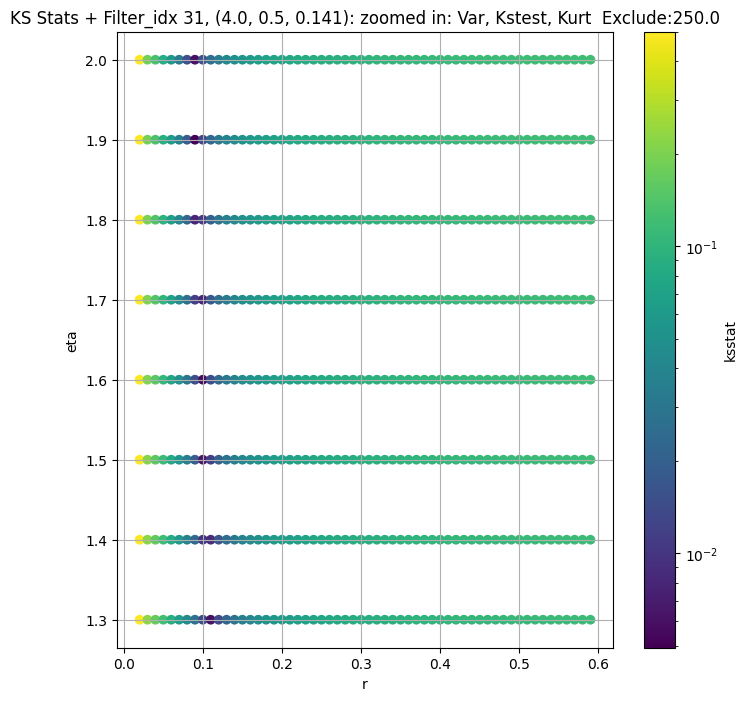

Filter_idx 32, (4.0, 0.5, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 100 = 300, ksstat: 0.006934282545054321, var: 1.784735918045044


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 75 = 275, ksstat: 0.008198360156090656, var: 1.8480486869812012


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 50 = 250, ksstat: 0.009418491244341576, var: 1.9203107357025146


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 25 = 225, ksstat: 0.0085795720213373, var: 2.0039291381835938


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 0 = 200, ksstat: 0.009608427508110196, var: 2.102159023284912


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -25 = 175, ksstat: 0.010527463802711856, var: 2.219219923019409


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -50 = 150, ksstat: 0.011691003638570563, var: 2.3610892295837402


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -75 = 125, ksstat: 0.013493218350886016, var: 2.5366456508636475


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -100 = 100, ksstat: 0.013927674446921778, var: 2.7593257427215576
Number of samples: 100000, Without approximation : 262144000.0


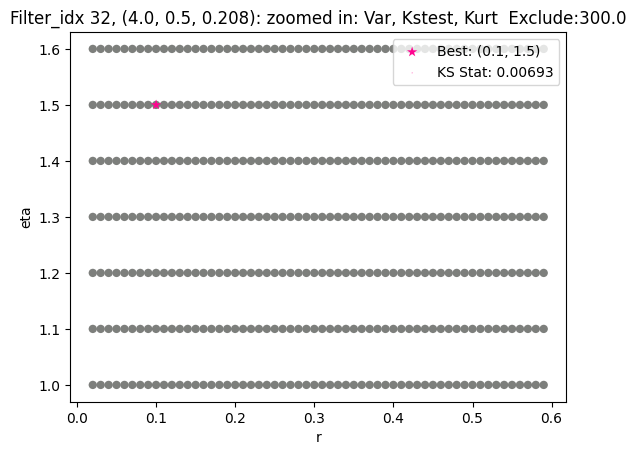

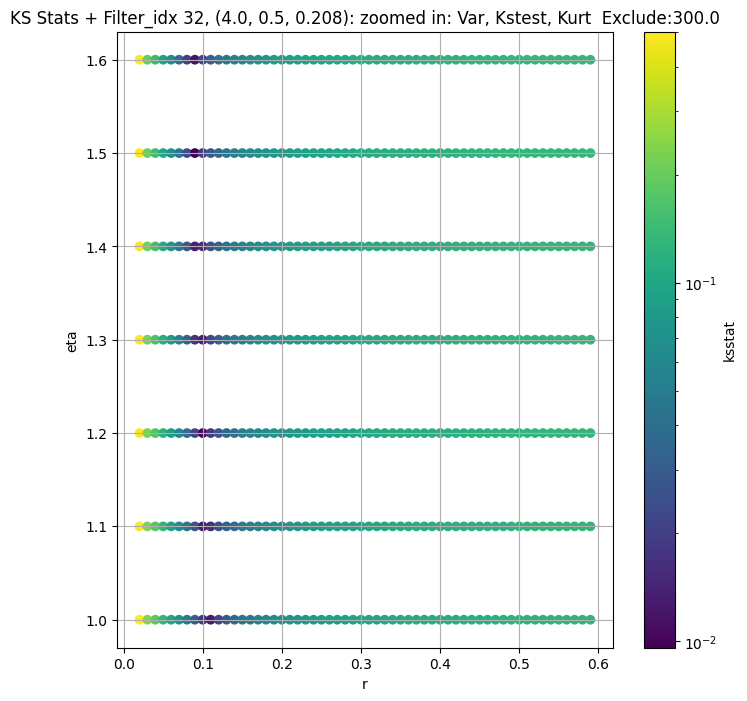

Filter_idx 33, (4.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 100 = 300, ksstat: 0.006647429448655928, var: 0.22862619161605835


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 75 = 275, ksstat: 0.006247788161122481, var: 0.23379065096378326


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 50 = 250, ksstat: 0.005719334438537116, var: 0.2394389510154724


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 25 = 225, ksstat: 0.005325218074745508, var: 0.24568012356758118


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 0 = 200, ksstat: 0.004838863681783961, var: 0.2526715397834778


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -25 = 175, ksstat: 0.0044801955165414235, var: 0.2606413960456848


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -50 = 150, ksstat: 0.004879156046207145, var: 0.26994672417640686


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -75 = 125, ksstat: 0.005748843807510562, var: 0.28116291761398315


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -100 = 100, ksstat: 0.006357919519893396, var: 0.29529643058776855
Number of samples: 100000, Without approximation : 262144000.0


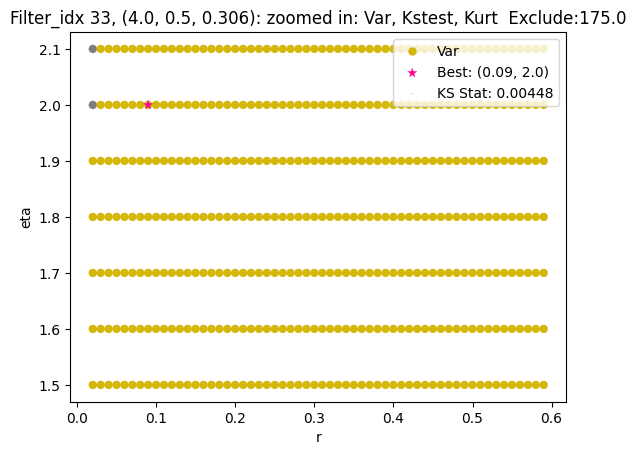

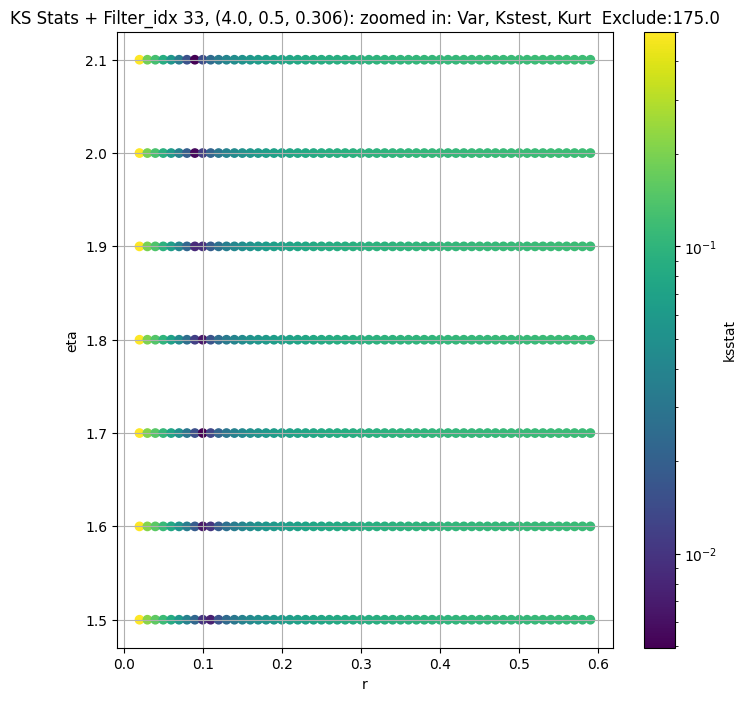

Filter_idx 34, (4.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + 100 = 300, ksstat: 0.009450110637824527, var: 0.04599441960453987


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + 75 = 275, ksstat: 0.01040530284709451, var: 0.047251082956790924


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + 50 = 250, ksstat: 0.009423298369261701, var: 0.04862343892455101


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + 25 = 225, ksstat: 0.01067750285018379, var: 0.050135090947151184


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + 0 = 200, ksstat: 0.010178516613691152, var: 0.051818061619997025


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + -25 = 175, ksstat: 0.011741698034059445, var: 0.053716376423835754


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + -50 = 150, ksstat: 0.011948912780445353, var: 0.05589399114251137


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + -75 = 125, ksstat: 0.012559748597623488, var: 0.058452293276786804


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + -100 = 100, ksstat: 0.012622176450818201, var: 0.06156689301133156
Number of samples: 100000, Without approximation : 262144000.0


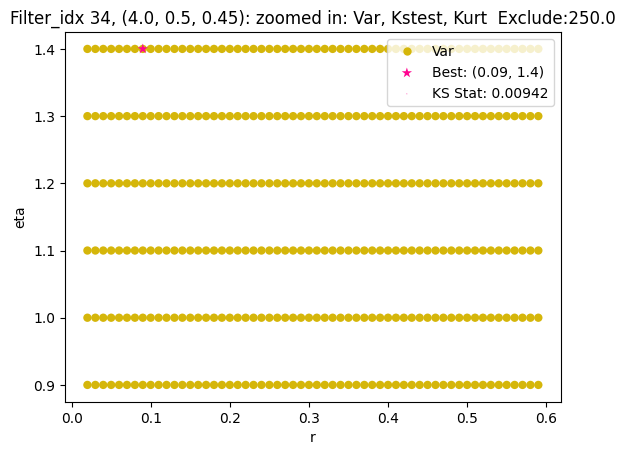

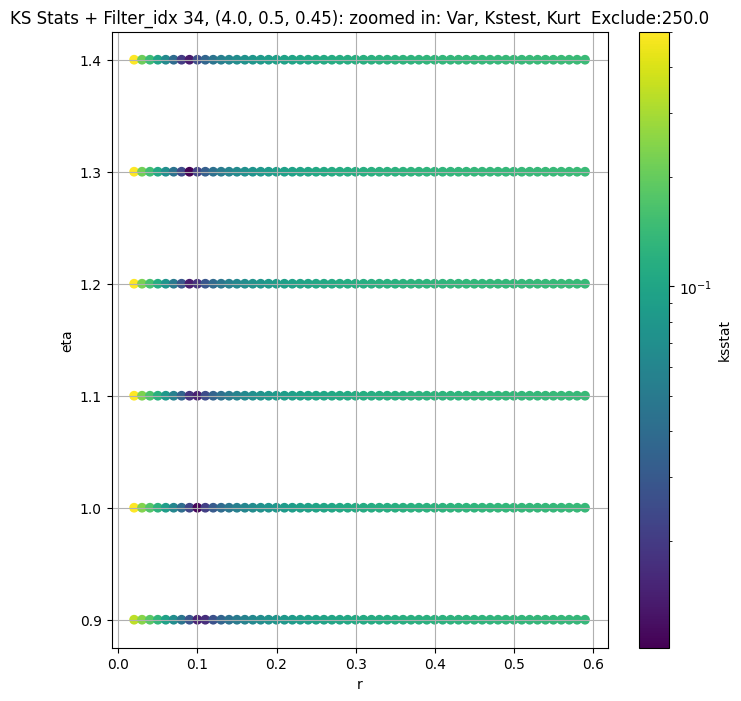

Filter_idx 35, (4.0, 1.0, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + 100 = 300, ksstat: 0.004883396541482593, var: 24.82924461364746


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + 75 = 275, ksstat: 0.004195423809062682, var: 25.372486114501953


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + 50 = 250, ksstat: 0.003864611420670183, var: 25.97882652282715


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + 25 = 225, ksstat: 0.0030741523568255796, var: 26.66556167602539


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + 0 = 200, ksstat: 0.0026061622811167926, var: 27.45734214782715


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + -25 = 175, ksstat: 0.0023355855139263193, var: 28.392066955566406


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + -50 = 150, ksstat: 0.0020565359186112786, var: 29.531715393066406


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + -75 = 125, ksstat: 0.0017954998753731966, var: 30.975099563598633


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + -100 = 100, ksstat: 0.0024979053901178494, var: 32.90974807739258
Number of samples: 100000, Without approximation : 262144000.0


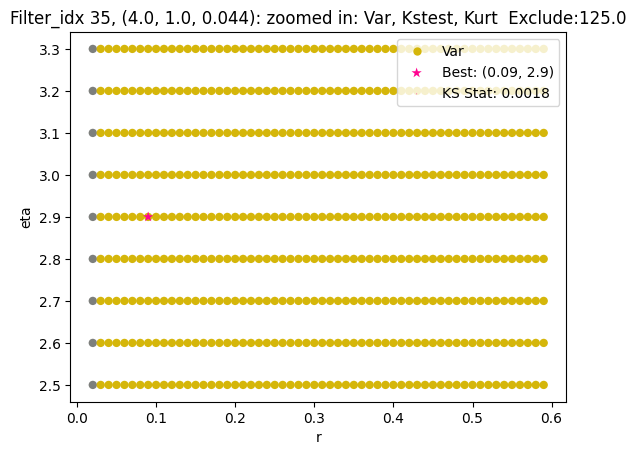

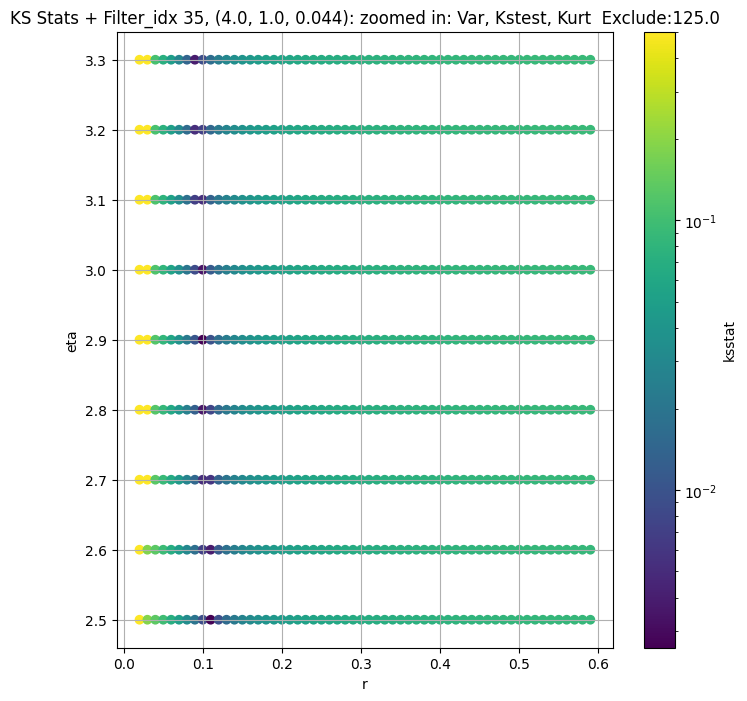

Filter_idx 36, (4.0, 1.0, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 100 = 200, ksstat: 0.0032146136496951083, var: 15.298114776611328


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 75 = 175, ksstat: 0.0026180960769637274, var: 15.713647842407227


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 50 = 150, ksstat: 0.0021066493725225843, var: 16.195966720581055


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 25 = 125, ksstat: 0.0017881002758545206, var: 16.772401809692383


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 0 = 100, ksstat: 0.0015241691186573814, var: 17.489896774291992


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -25 = 75, ksstat: 0.002710420816296022, var: 18.43394660949707


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -50 = 50, ksstat: 0.004055702368454844, var: 19.79887580871582


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -75 = 25, ksstat: 0.007117303755503457, var: 22.131128311157227


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -100 = 0, ksstat: 0.016079282107233202, var: 35.171085357666016
Number of samples: 100000, Without approximation : 262144000.0


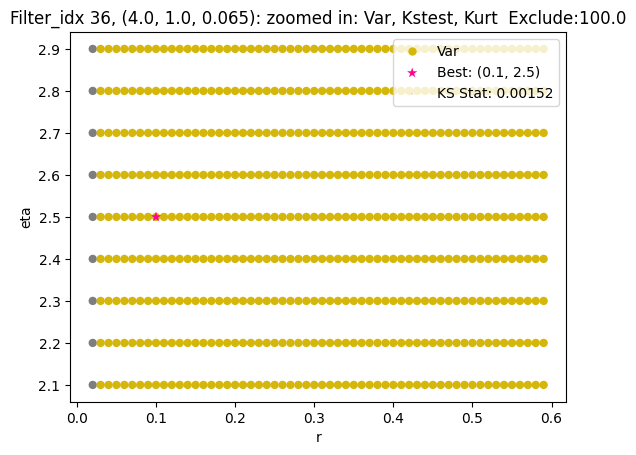

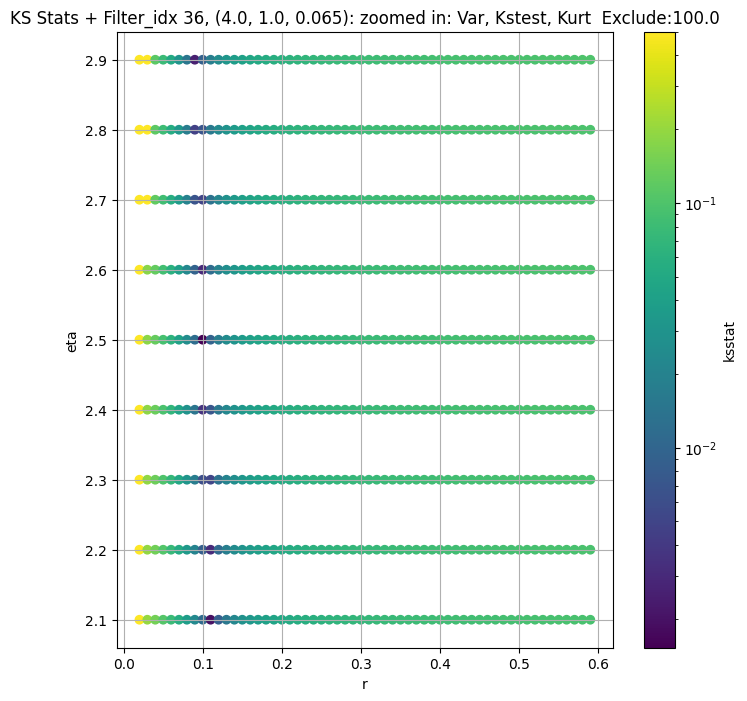

Filter_idx 37, (4.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 100 = 300, ksstat: 0.005305232096377802, var: 10.252204895019531


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 75 = 275, ksstat: 0.004848676297848686, var: 10.470585823059082


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 50 = 250, ksstat: 0.004381290952910288, var: 10.710723876953125


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 25 = 225, ksstat: 0.0039499086865016145, var: 10.977994918823242


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 0 = 200, ksstat: 0.003454739779679028, var: 11.28018569946289


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + -25 = 175, ksstat: 0.0029574117233208443, var: 11.628213882446289


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + -50 = 150, ksstat: 0.002515590725216241, var: 12.03775405883789


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + -75 = 125, ksstat: 0.003508489756641836, var: 12.53567123413086


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + -100 = 100, ksstat: 0.004134481227496267, var: 13.171142578125
Number of samples: 100000, Without approximation : 262144000.0


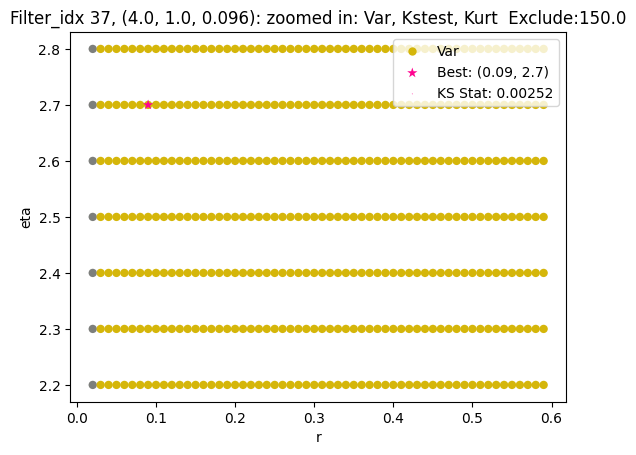

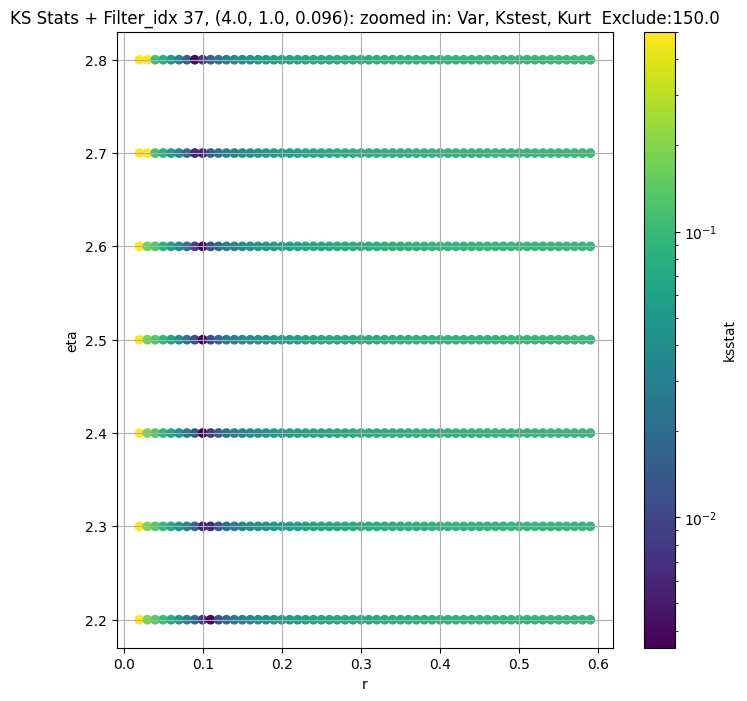

Filter_idx 38, (4.0, 1.0, 0.141):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + 100 = 300, ksstat: 0.0042152285751151375, var: 6.545055389404297


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + 75 = 275, ksstat: 0.003919179175519518, var: 6.773288726806641


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + 50 = 250, ksstat: 0.004787862768813739, var: 7.026718616485596


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + 25 = 225, ksstat: 0.004578405742108049, var: 7.309571743011475


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + 0 = 200, ksstat: 0.005514382590219191, var: 7.62729024887085


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + -25 = 175, ksstat: 0.00643815627606853, var: 7.98809814453125


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + -50 = 150, ksstat: 0.007313497652388756, var: 8.405383110046387


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + -75 = 125, ksstat: 0.0074573428399478114, var: 8.900944709777832


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + -100 = 100, ksstat: 0.009296826810494485, var: 9.509749412536621
Number of samples: 100000, Without approximation : 262144000.0


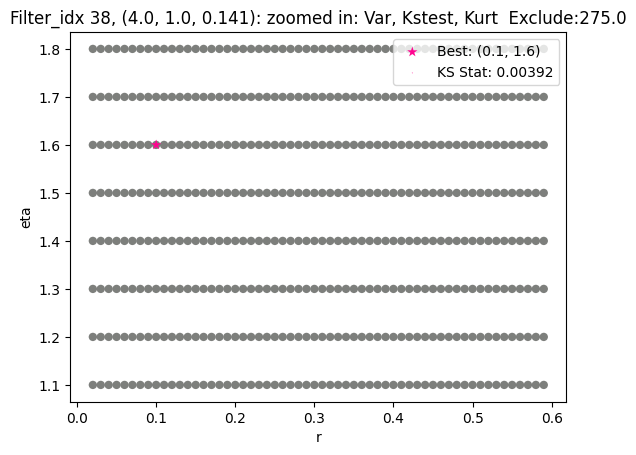

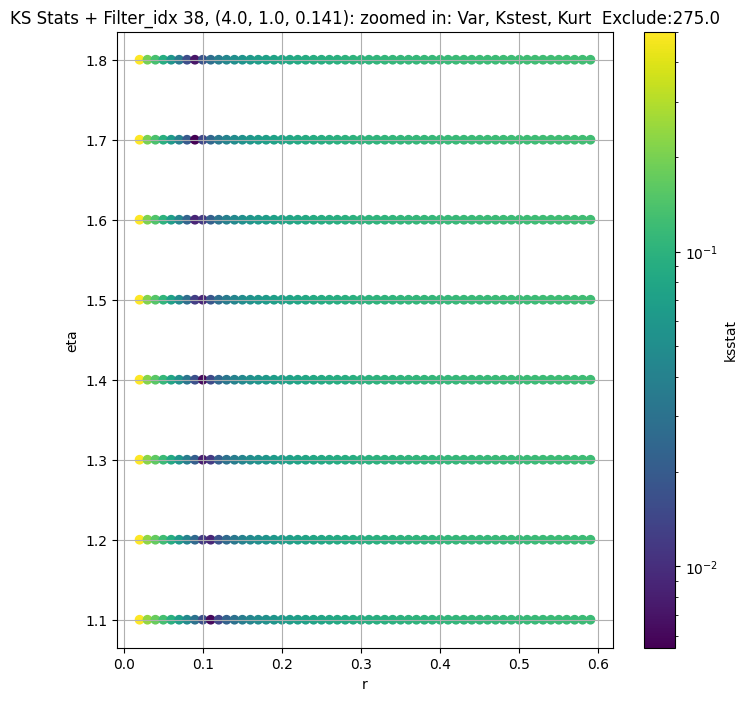

Filter_idx 39, (4.0, 1.0, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 100 = 300, ksstat: 0.0048501504219522484, var: 1.8704147338867188


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 75 = 275, ksstat: 0.0059691543239625, var: 1.9387773275375366


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 50 = 250, ksstat: 0.006615721497885224, var: 2.018281936645508


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 25 = 225, ksstat: 0.008035788663713184, var: 2.1124823093414307


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 0 = 200, ksstat: 0.0076484339591615935, var: 2.226144790649414


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -25 = 175, ksstat: 0.009414252284590696, var: 2.366335868835449


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -50 = 150, ksstat: 0.010183209327771059, var: 2.5430376529693604


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -75 = 125, ksstat: 0.012202588749868015, var: 2.7719016075134277


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -100 = 100, ksstat: 0.013347998910566039, var: 3.0790441036224365
Number of samples: 100000, Without approximation : 262144000.0


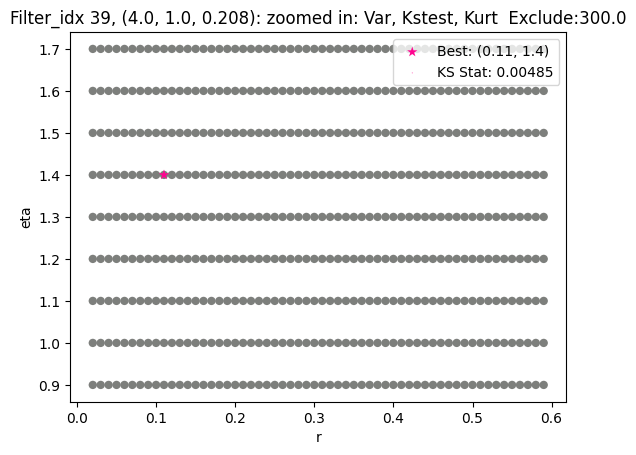

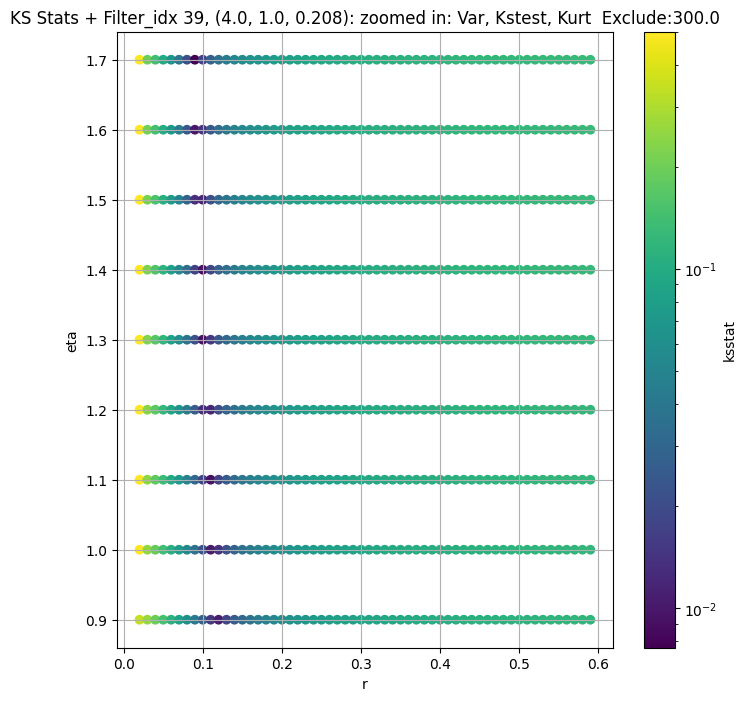

Filter_idx 40, (4.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 100 = 300, ksstat: 0.006279283869225716, var: 0.3417680263519287


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 75 = 275, ksstat: 0.0058542567678066156, var: 0.3515866994857788


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 50 = 250, ksstat: 0.006459383598306445, var: 0.36258020997047424


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 25 = 225, ksstat: 0.006026067709253957, var: 0.3750484883785248


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 0 = 200, ksstat: 0.006543101514177585, var: 0.38941389322280884


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + -25 = 175, ksstat: 0.007840091973464802, var: 0.40624678134918213


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + -50 = 150, ksstat: 0.008481208215894098, var: 0.42644551396369934


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + -75 = 125, ksstat: 0.009547556177736172, var: 0.4513816237449646


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + -100 = 100, ksstat: 0.009961784841483523, var: 0.48338204622268677
Number of samples: 100000, Without approximation : 262144000.0


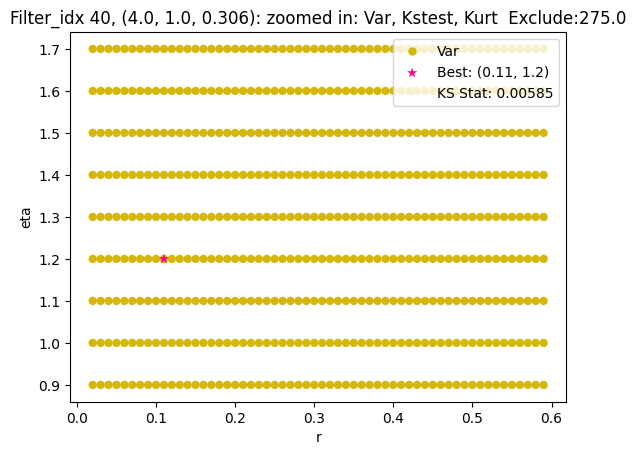

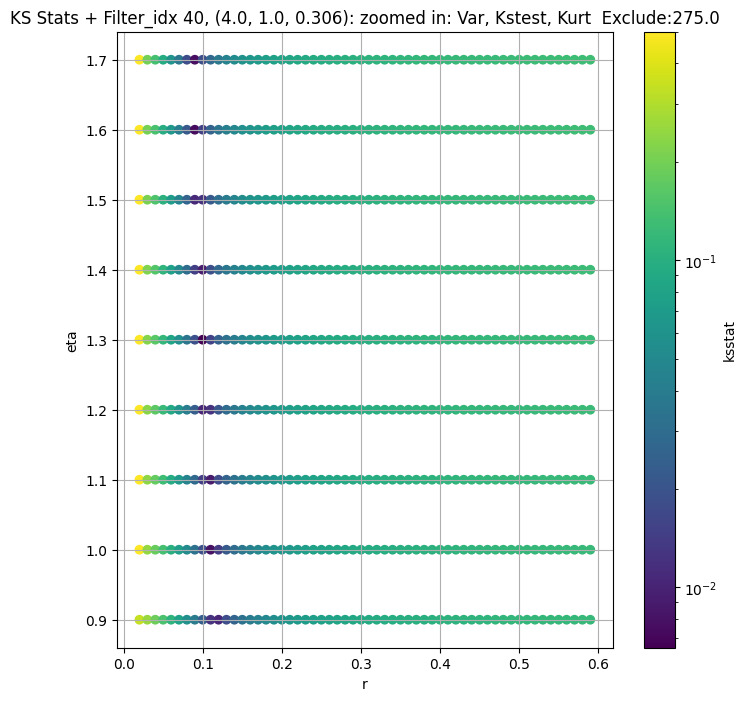

Filter_idx 41, (4.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 100 = 300, ksstat: 0.009987944250985592, var: 0.05109618976712227


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 75 = 275, ksstat: 0.010374233338903721, var: 0.05252309888601303


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 50 = 250, ksstat: 0.011136859720396797, var: 0.054089177399873734


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 25 = 225, ksstat: 0.010406229097939729, var: 0.055823538452386856


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 0 = 200, ksstat: 0.011835415811552674, var: 0.05776550620794296


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + -25 = 175, ksstat: 0.012139369580506848, var: 0.05997107923030853


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + -50 = 150, ksstat: 0.012107643526279133, var: 0.06252138316631317


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + -75 = 125, ksstat: 0.01400702516877772, var: 0.06554122269153595


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + -100 = 100, ksstat: 0.013163098056505673, var: 0.06923798471689224
Number of samples: 100000, Without approximation : 262144000.0


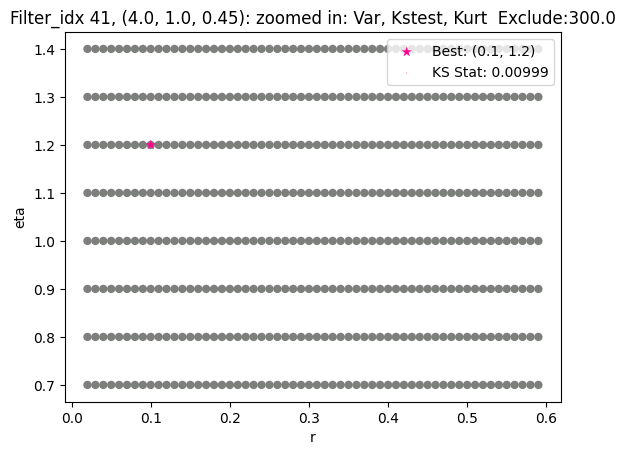

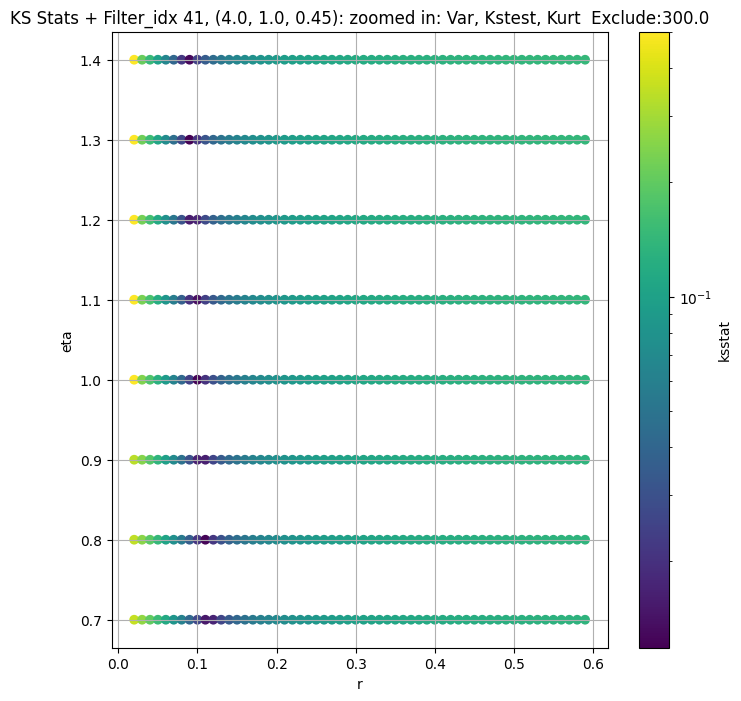

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff,n_pval_0.05
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",85.236410,28.694447,732.051450,1326.75440,8.503800,845.48750,262144000.0,"(2.0, 0.5, 0.044)",0.003028,...,4.556879e-16,200.0,33.281662,0.000084,0.002737,0.09,3.3,8.008571e-19,175.0,256000
1,"(2.0, 0.5, 0.065)",55.119440,16.155226,348.341670,905.38780,7.874421,853.06590,262144000.0,"(2.0, 0.5, 0.065)",0.002430,...,5.914424e-05,200.0,18.205141,0.000084,0.002204,0.17,0.9,1.266467e-06,175.0,384000
2,"(2.0, 0.5, 0.096)",22.824420,9.009885,101.607285,555.71906,5.062737,758.95074,262144000.0,"(2.0, 0.5, 0.096)",0.001922,...,4.031813e-16,50.0,11.276715,0.000084,0.001686,0.11,2.3,4.351579e-14,75.0,648000
3,"(2.0, 0.5, 0.141)",9.843026,4.680263,53.985220,570.56400,6.635873,714.98520,262144000.0,"(2.0, 0.5, 0.141)",0.002410,...,3.105815e-16,100.0,5.835878,0.000084,0.002233,0.11,1.9,5.562909e-14,100.0,384000
4,"(2.0, 0.5, 0.208)",6.010580,1.755476,35.830950,694.43570,11.610837,844.96704,262144000.0,"(2.0, 0.5, 0.208)",0.003833,...,2.906257e-16,200.0,2.022064,0.000084,0.003587,0.11,1.6,4.052092e-14,200.0,144000
5,"(2.0, 0.5, 0.306)",2.173437,0.544470,9.934200,431.17087,24.019732,662.25964,262144000.0,"(2.0, 0.5, 0.306)",0.012624,...,1.555497e-15,200.0,0.590733,0.000084,0.008908,0.11,1.1,4.766485e-14,300.0,24000
6,"(2.0, 0.5, 0.45)",0.541408,0.220924,4.927081,1347.73650,10.447507,847.39990,262144000.0,"(2.0, 0.5, 0.45)",0.005524,...,1.120970e-16,200.0,0.258607,0.000084,0.005384,0.09,1.9,1.973411e-19,200.0,64000
7,"(2.0, 1.0, 0.044)",104.480480,31.121315,1179.829300,2493.79760,8.534616,922.46640,262144000.0,"(2.0, 1.0, 0.044)",0.002877,...,3.247630e-16,200.0,36.952679,0.000084,0.002513,0.09,3.3,8.891928e-19,150.0,288000
8,"(2.0, 1.0, 0.065)",47.764854,16.399597,625.038300,3161.99980,6.106381,912.12420,262144000.0,"(2.0, 1.0, 0.065)",0.002479,...,2.419203e-16,100.0,22.115858,0.000084,0.002384,0.09,3.3,5.321742e-19,75.0,324000


In [14]:
master_df_optimized_path = Path(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))

NUM_ITERS = dict(zip(GROUPS, [1]*len(GROUPS))) # By default, does one iteration per group
NUM_SAMPLES_OPTIMIZE = 2000
EXCLUDE_CUTOFFS_OPTIMIZE = np.arange(100, -101, -25)

if RERUN or not master_df_optimized_path.exists():

    if SKIP_OPTIMIZE_STEP:

        master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
        master_df[f'best_r'] = master_df['initial_r']
        master_df[f'best_eta'] = master_df['initial_eta']
        master_df[f'best_scale'] = master_df['initial_scale']
        master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

    else:
        for group in GROUPS: # TODO For quick testing purposes
            print(f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}:")
            master_df.loc[group, 'kstest_stat_best'] = master_df.loc[group, 'kstest_stat_initial']
            master_df.loc[group, 'best_r'] = master_df.loc[group, 'initial_r']
            master_df.loc[group, 'best_eta'] = master_df.loc[group, 'initial_eta']
            master_df.loc[group, 'best_scale'] = master_df.loc[group, 'initial_scale']

            sample = group_data_map[group]
            if len(sample) == 0:
                continue
            initial_r, initial_eta = master_df.loc[group, 'initial_r'], master_df.loc[group, f'initial_eta']
            eps = 0.5
            group_cdfs_df = fine_cdfs_df[(np.abs(master_df.loc[group, 'initial_r'] - fine_cdfs_df['r']) < eps) & 
                                        (np.abs(master_df.loc[group, 'initial_eta'] - fine_cdfs_df['eta']) < eps)].reset_index(drop=True)
            group_cdfs = {x[0]:x[1] for x in group_cdfs_df['(r,eta),cdf']}

            for adjust_exclude_cutoff in EXCLUDE_CUTOFFS_OPTIMIZE: # -50, -25, 0, 25, 50
                
                exclude_cutoff = int(max(0, adjust_exclude_cutoff + master_df.loc[group, 'initial_exclude_cutoff']))
                
                if exclude_cutoff == 0:
                    augmented_var = np.var(group_data_map[group])
                else:
                    augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])                       

                group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
                ksstats, initial_param, min_stat = gridsearch(sample, group_cdfs, debug=True, scales=group_cdfs_df['scale'])
                
                cutoff_label = generate_cutoff_label(adjust_exclude_cutoff)

                augmented_var_df.loc[group, f"kstest_stat_{cutoff_label}"] = min_stat
                group_cdfs_df[f'ksstat_exclude_{cutoff_label}'] = ksstats
                
                print(f"{GROUP} {group}, {master_df.loc[group, 'initial_exclude_cutoff']} + {adjust_exclude_cutoff} = {exclude_cutoff}, ksstat: {min_stat}, var: {augmented_var}")
                best_adjust = 0

                if min_stat < master_df.loc[group, 'kstest_stat_best']:

                    inital_min_stat = min_stat
                    inital_best_param = initial_param
                    master_df.loc[group, 'kstest_stat_best'] = min_stat
                    initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                    master_df.loc[group, 'best_r'], master_df.loc[group, 'best_eta'] = initial_param
                    master_df.loc[group, 'best_scale'] = initial_scale
                    master_df.loc[group, 'best_exclude_cutoff'] = exclude_cutoff
                    master_df.loc[group, 'best_augmented_var'] = augmented_var
                    augmented_var_df.loc[group, 'best_augmented_var'] = augmented_var
                    best_adjust = adjust_exclude_cutoff

                if exclude_cutoff == 0:
                    break

            cutoff_label = generate_cutoff_label(best_adjust)
            ksstats = group_cdfs_df[f"ksstat_exclude_{cutoff_label}"]
            
            print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
            
            cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
            master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

            best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

            group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
            group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

            group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

            group_dict = rEtaKsstats_dict[group]
            group_dict.update({'r_optimize' : group_cdfs_df['r'], 'eta_optimize' : group_cdfs_df['eta'], f'ksstat_exclude_{cutoff_label}' : ksstats})
            rEtaKsstats_dict[group] = group_dict

            cols = ['pass_var', 'pass_kstest', 'pass_kurt']
            fig = combo_test_plot(group_cdfs_df, cols, 
                                plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: zoomed in: {', '.join([col[5:].capitalize() for col in cols])}  Exclude:{master_df.loc[group, 'best_exclude_cutoff']}",
                                best_param=(master_df.loc[group, 'best_r'], master_df.loc[group, f'best_eta']),
                                best_ksstat=master_df.loc[group, 'kstest_stat_best'])
            fig.figure.savefig(os.path.join(CWD, "plots", f"optimized_full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)
            
    master_df['n_pval_0.05'] = master_df.apply(lambda row : find_n_fixed_pval_stat(row.loc['kstest_stat_best'], row.loc['total_samples']), axis = 1)    
    master_df[['total_samples', 'initial_r', 'initial_eta', 'kstest_stat_initial', 'initial_exclude_cutoff', 'best_r', 'best_eta', 'best_scale', 'kstest_stat_best', 'best_exclude_cutoff', 'n_pval_0.05']].to_csv(os.path.join(CWD, "CSVs", 'optimized_params.csv'))
    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))
    augmented_var_df.to_csv(augmented_var_df_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)

rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df = pd.read_csv(master_df_optimized_path, index_col = GROUP)
augmented_var_df = pd.read_csv(augmented_var_df_path, index_col = GROUP)
master_df

## Comparing Empirical and Computed CDF/PDF

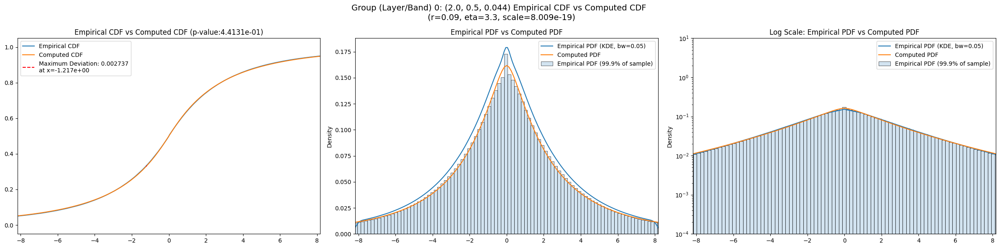

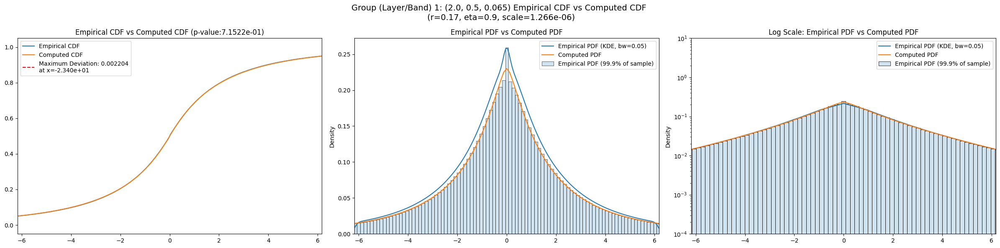

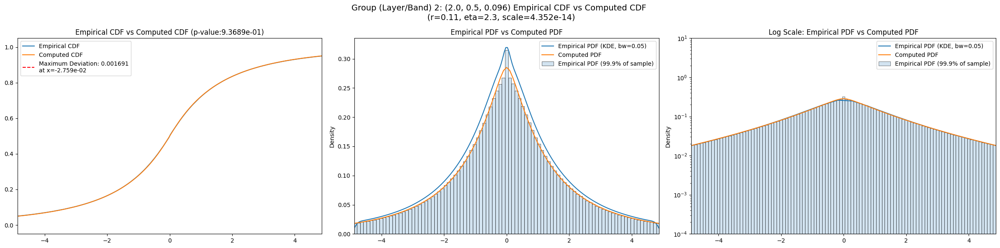

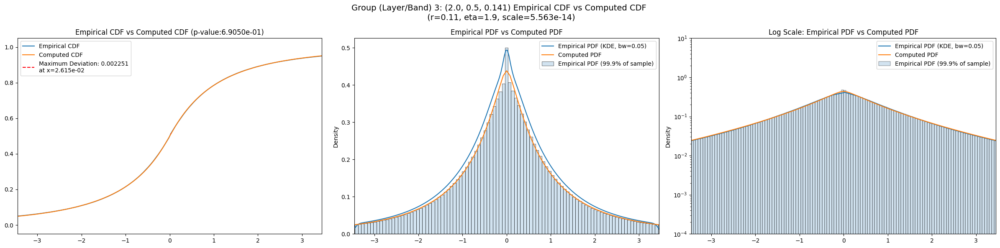

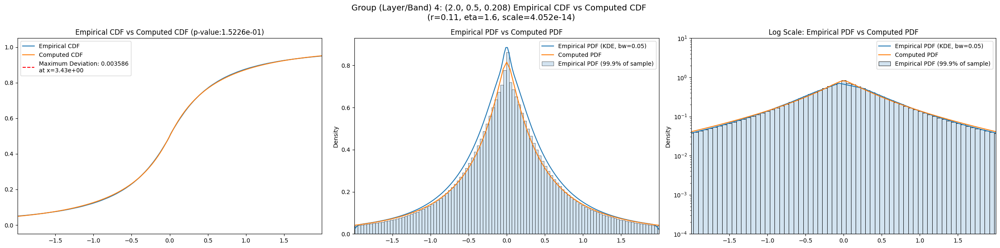

...

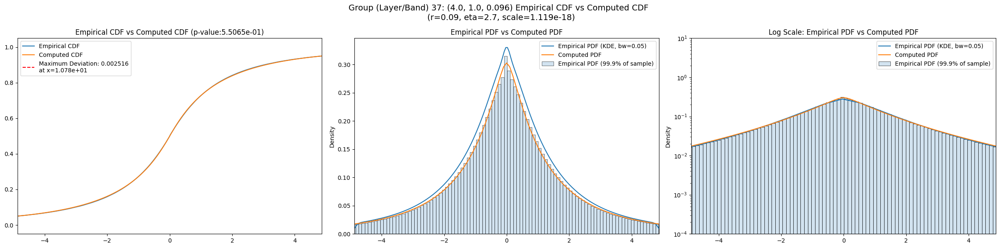

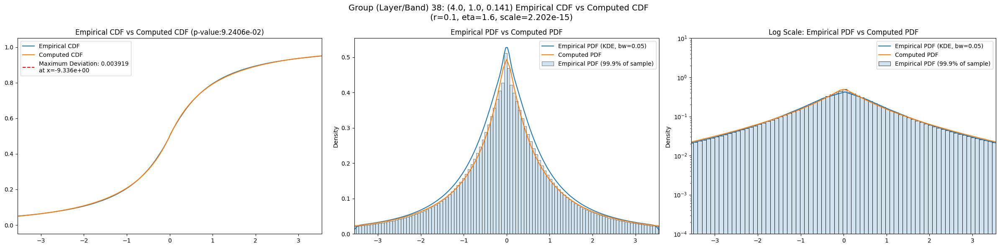

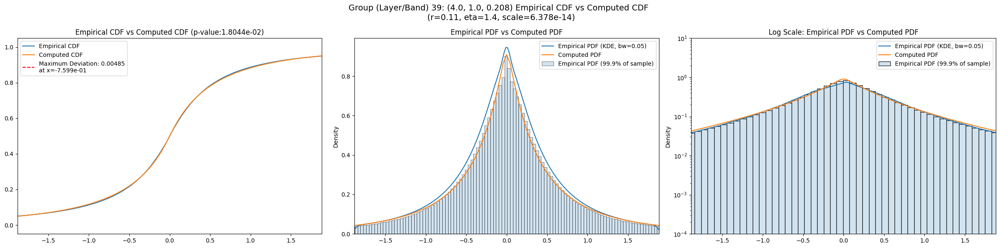

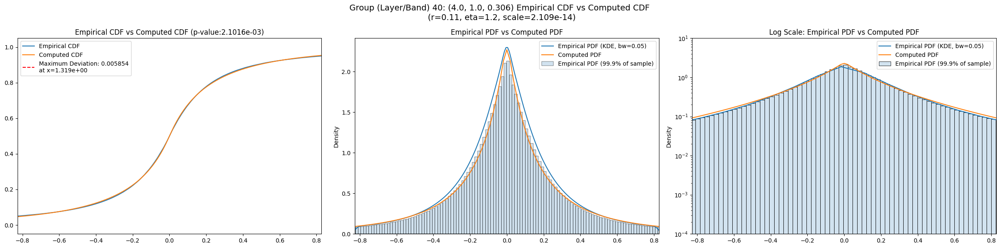

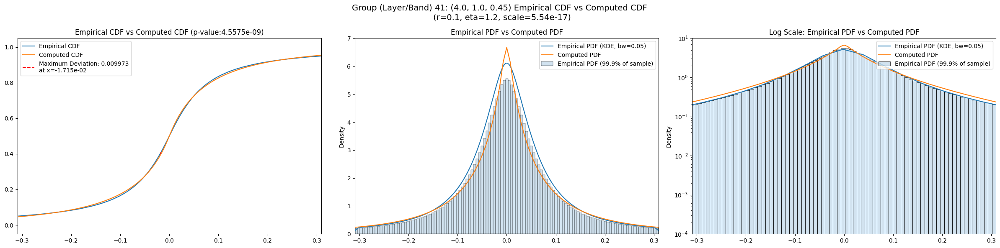

In [15]:
for group in GROUPS:
    group_info = master_df.loc[group]
    best_r = group_info['best_r']
    best_eta = group_info['best_eta']
    best_scale = group_info['best_scale']
    fig = visualize_cdf_pdf(sample = group_data_map[group], 
                    params = (best_r, best_eta, best_scale), 
                    log_scale = True,
                    group = f"{group}: {filter_group_map[group]}")
    fig.savefig(os.path.join(CWD, "plots", f'compare_cdf_pdf_layer_{group}.jpg'), bbox_inches = 'tight', dpi = 100)

## Comparing with Gaussian and Laplace Priors

In [16]:
def generate_func(sample, distro, *args, n_samples=200):
    if distro == 'gaussian' or distro == 'normal':
        def var_func(var):
            cdf = scipy.stats.norm(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'laplace':
        def var_func(var):
            cdf = scipy.stats.laplace(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 't':
        def var_func(var):
            cdf = scipy.stats.t(df=2, scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'prior_r':
        eta = args[0]
        def r_func(r):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return r_func
    elif distro == 'prior_eta':
        r = args[0]
        def eta_func(eta):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return eta_func
    elif distro == 'prior':
        def r_eta_func(params):
            r = params[0]
            eta = params[1]
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample, cdf)
        return r_eta_func
    elif distro == 'prior_with_scale':
        def r_eta_scale_func(params):
            r = params[0]
            eta = params[1]
            scale = params[2]
            print(r, eta, scale)
            cdf = compute_prior_cdf(r = r, eta = eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample/ np.sqrt(scale), cdf)
        return r_eta_scale_func

    print("Please enter a valid argument for `distro`: 'gaussian', 'laplace', 'prior_r', 'prior_eta', 'prior','prior_with_scale', 't'")

In [17]:
master_df_path = Path(os.path.join(CWD, "CSVs", 'master_df.csv'))

if RERUN or not master_df_path.exists():
    upper_bound = int(1e6)
    for group in GROUPS:
        if len(group_data_map[group]) == 0:
            continue
        norm_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'gaussian'), method = 'bounded', bounds = (0, upper_bound))
        laplace_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'laplace'), method = 'bounded', bounds = (0, upper_bound))
        t_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 't'), method = 'bounded', bounds = (0, upper_bound))
        
        master_df.loc[group, 'param_gaussian'] = round_to_sigfigs(norm_result['x'], 6)
        master_df.loc[group, 'kstest_stat_gaussian'] = round_to_sigfigs(norm_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_gaussian'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_gaussian']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6) 

        master_df.loc[group, 'param_t'] = round_to_sigfigs(t_result['x'], 6)
        master_df.loc[group, 'kstest_stat_t'] = round_to_sigfigs(t_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_t'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_t']), 6) 

        master_df.loc[group, 'kstest_pval_gengamma'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_best']))

    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df.csv'))
    
master_df = pd.read_csv(os.path.join(CWD, "CSVs", 'master_df.csv'), index_col = GROUP)
master_df

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,param_gaussian,kstest_stat_gaussian,kstest_pval_gaussian,param_laplace,kstest_stat_laplace,kstest_pval_laplace,param_t,kstest_stat_t,kstest_pval_t,kstest_pval_gengamma
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",85.236410,28.694447,732.051450,1326.75440,8.503800,845.48750,262144000.0,"(2.0, 0.5, 0.044)",0.003028,...,3.665640,0.037985,0.0,3.249560,0.012584,0.0,2.588790,0.010268,0.0,0.0
1,"(2.0, 0.5, 0.065)",55.119440,16.155226,348.341670,905.38780,7.874421,853.06590,262144000.0,"(2.0, 0.5, 0.065)",0.002430,...,2.686620,0.041043,0.0,2.368260,0.014187,0.0,1.897420,0.013612,0.0,0.0
2,"(2.0, 0.5, 0.096)",22.824420,9.009885,101.607285,555.71906,5.062737,758.95074,262144000.0,"(2.0, 0.5, 0.096)",0.001922,...,2.122960,0.040732,0.0,1.871390,0.014100,0.0,1.499720,0.012802,0.0,0.0
3,"(2.0, 0.5, 0.141)",9.843026,4.680263,53.985220,570.56400,6.635873,714.98520,262144000.0,"(2.0, 0.5, 0.141)",0.002410,...,1.448960,0.043714,0.0,1.280600,0.017239,0.0,1.017840,0.015420,0.0,0.0
4,"(2.0, 0.5, 0.208)",6.010580,1.755476,35.830950,694.43570,11.610837,844.96704,262144000.0,"(2.0, 0.5, 0.208)",0.003833,...,0.809330,0.045833,0.0,0.718542,0.020282,0.0,0.566906,0.016443,0.0,0.0
5,"(2.0, 0.5, 0.306)",2.173437,0.544470,9.934200,431.17087,24.019732,662.25964,262144000.0,"(2.0, 0.5, 0.306)",0.012624,...,0.387841,0.048087,0.0,0.345566,0.023366,0.0,0.271964,0.018003,0.0,0.0
6,"(2.0, 0.5, 0.45)",0.541408,0.220924,4.927081,1347.73650,10.447507,847.39990,262144000.0,"(2.0, 0.5, 0.45)",0.005524,...,0.269865,0.050625,0.0,0.239628,0.025116,0.0,0.189292,0.020689,0.0,0.0
7,"(2.0, 1.0, 0.044)",104.480480,31.121315,1179.829300,2493.79760,8.534616,922.46640,262144000.0,"(2.0, 1.0, 0.044)",0.002877,...,3.838240,0.037615,0.0,3.402880,0.011772,0.0,2.713440,0.010701,0.0,0.0
8,"(2.0, 1.0, 0.065)",47.764854,16.399597,625.038300,3161.99980,6.106381,912.12420,262144000.0,"(2.0, 1.0, 0.065)",0.002479,...,2.957210,0.037974,0.0,2.608180,0.011158,0.0,2.096050,0.011623,0.0,0.0


## Results

In [18]:
import pandas as pd
import os
master_df = pd.read_csv(os.path.join(os.getcwd(), "CSVs", 'master_df.csv'), index_col = 0)

In [19]:
master_df.filter(regex="kstest_stat.*")

,kstest_stat_initial,kstest_stat_cutoff_0.05,kstest_stat_best,kstest_stat_gaussian,kstest_stat_laplace,kstest_stat_t
filter_idx,,,,,,
0,0.003028,0.000084,0.002737,0.037985,0.012584,0.010268
1,0.002430,0.000084,0.002204,0.041043,0.014187,0.013612
2,0.001922,0.000084,0.001686,0.040732,0.014100,0.012802
3,0.002410,0.000084,0.002233,0.043714,0.017239,0.015420
4,0.003833,0.000084,0.003587,0.045833,0.020282,0.016443
5,0.012624,0.000084,0.008908,0.048087,0.023366,0.018003
6,0.005524,0.000084,0.005384,0.050625,0.025116,0.020689
7,0.002877,0.000084,0.002513,0.037615,0.011772,0.010701
8,0.002479,0.000084,0.002384,0.037974,0.011158,0.011623


In [20]:
master_df.filter(regex="best.*")

,best_augmented_var,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff
filter_idx,,,,,,
0,33.281662,0.002737,0.09,3.3,8.008571e-19,175.0
1,18.205141,0.002204,0.17,0.9,1.266467e-06,175.0
2,11.276715,0.001686,0.11,2.3,4.351579e-14,75.0
3,5.835878,0.002233,0.11,1.9,5.562909e-14,100.0
4,2.022064,0.003587,0.11,1.6,4.052092e-14,200.0
5,0.590733,0.008908,0.11,1.1,4.766485e-14,300.0
6,0.258607,0.005384,0.09,1.9,1.973411e-19,200.0
7,36.952679,0.002513,0.09,3.3,8.891928e-19,150.0
8,22.115858,0.002384,0.09,3.3,5.321742e-19,75.0
